#### Общий код, использующийся во всех алгоритмах.

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
!pip install scikit-network
import sknetwork

Mounted at /gdrive
     |████████████████████████████████| 8.1 MB 4.6 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstalling scipy-1.4.1:
      Successfully uninstalled scipy-1.4.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
!pip install scikit-network

In [ ]:
dir(sknetwork.data)

['Bunch',
 'Iterable',
 'Optional',
 'Union',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 'albert_barabasi',
 'block_model',
 'bow_tie',
 'check_random_state',
 'clear_data_home',
 'cyclic_digraph',
 'cyclic_graph',
 'cyclic_position',
 'directed2undirected',
 'erdos_renyi',
 'from_adjacency_list',
 'from_csv',
 'from_edge_list',
 'from_graphml',
 'get_data_home',
 'grid',
 'hourglass',
 'house',
 'karate_club',
 'linear_digraph',
 'linear_graph',
 'load',
 'load_konect',
 'load_netset',
 'miserables',
 'models',
 'movie_actor',
 'np',
 'painters',
 'parse',
 'pi',
 'save',
 'sparse',
 'star',
 'star_wars',
 'toy_graphs',
 'watts_strogatz']

In [ ]:
import numpy as np
from copy import copy
import random
import networkx as nx
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
import pandas as pd

import sknetwork as skn
from IPython.display import SVG

import numpy as np
from scipy import sparse
import pandas as pd
import seaborn as sns

#from sknetwork.utils import edgelist2adjacency, edgelist2biadjacency
#from sknetwork.data import convert_edge_list, load_edge_list, load_graphml
from sknetwork.visualization import svg_graph, svg_digraph, svg_bigraph
from sknetwork.clustering import Louvain

from sknetwork.clustering import modularity

from tqdm import tqdm_notebook

import timeit
import time
import pickle

In [ ]:
def get_empty_2D_nparray(len):
    a = np.array([None] * len)
    for i in range(len):
        a[i] = []
    return a

In [ ]:
class HyperEdgeIterator:
    def __init__(self, position, np_lst):
        self.position = position
        self.np_lst = np_lst
    
    def __iter__(self):
        return self

    def __next__(self):
        self.position += 1
        if self.position >= self.np_lst.shape[0]:
            raise StopIteration
        return self.np_lst[self.position]

class HyperEdge:
    def __init__(self, vertexes=[], weight=1, num=None):
        # assert len(vertexes) > 1 # restricted edges wigh size <= 1
        self.vertexes = np.unique(vertexes)
        self.weight = weight
        self.num = num

    def get_vertexes(self):
        return self.vertexes

    def add_weight(self, delta):
        self.weight += delta

    def is_loop(self):
        return self.vertexes.shape[0] == 1
    
    def __len__(self):
        return len(self.vertexes)

    def __eq__(self, other):
        return (self.vertexes == other.vertexes).all()

    def __hash__(self):
        return hash(tuple(self.vertexes))

    def __iter__(self):
        return HyperEdgeIterator(-1, self.vertexes)

    def __str__(self):
        return "Edge#" + str(self.num) + " = " + str(self.vertexes)[:-1] + "| w = " + str(self.weight) + "]"

class Hypergraph:
    def __init__(self, number_of_vertexes):
        self.hyperedges = []
        self.number_of_vertexes = number_of_vertexes
        self.adjlist = get_empty_2D_nparray(number_of_vertexes)
        self.hyperedge_number = dict()

    def add_hyperedge(self, list_of_verticles, weight=1):
        edge_numm = len(self.hyperedges)
        # print('edge_num = ', edge_numm)
        new_edge = HyperEdge(vertexes=list_of_verticles, weight=weight)

        if new_edge in self.hyperedge_number.keys():
            # print('this way')
            edge_numm = self.hyperedge_number[new_edge]
            self.hyperedges[edge_numm].add_weight(weight)
        else:
            self.hyperedge_number[new_edge] = edge_numm
            new_edge.num = edge_numm
            self.hyperedges.append(new_edge)
            # adding edge_num to adjancted vertexes
            for vertex in new_edge:
                self.adjlist[vertex].append(edge_numm)
            # print('edge_numm = ', edge_numm)
        return edge_numm
    
    def degree(self, vertex):
        return len(self.adjlist[vertex])

    def n_vertex(self):
        return self.number_of_vertexes

    def print(self):
        for i, edge in enumerate(self.hyperedges):
            print('Edge# ' + str(i) + " = [", end = "")
            print(edge.vertexes[0], end = "")
            for v in edge.vertexes[1:]:
                print(", ", v, end = "", sep = "")
            print("| w = ", edge.weight, "]", sep="")
    
    def pruning(self, vertexes):
        vertexes = list(np.unique(vertexes))
        assert len(vertexes) > 1
        vertex_to_num = dict()
        for id, v in enumerate(vertexes):
            vertex_to_num[v] = id

        H_new = Hypergraph(len(vertexes))

        for he in self.hyperedges:
            e_vert = he.vertexes
            if set(e_vert).issubset(set(vertexes)):
                e1_vert = [vertex_to_num[x] for x in e_vert]
                H_new.add_hyperedge(e1_vert, he.weight)
        return H_new

G = Hypergraph(5)
G.add_hyperedge([1, 2, 4], 1)
G.add_hyperedge([1, 2, 3], 2)
G.add_hyperedge([3, 4], 3)
G.print()
print(G.degree(0))
print(G.degree(1))
print(G.degree(2))
print(G.degree(3))
print(G.degree(4))

Edge# 0 = [1, 2, 4| w = 1]
Edge# 1 = [1, 2, 3| w = 2]
Edge# 2 = [3, 4| w = 3]
0
2
2
2
2


Функция φ(z) = p, где p - partition, z - номера кластеров вершин \\
φ - просто считает для каждого класса количество его встречаемостей в z. \\
Далее эти количества сортируются по убыванию и выкидываются = 0.

In [ ]:
def φ(z):
    z = np.array(z)
    z = np.sort(z)
    assert(z.shape[0] != 0)
    ans = [0]
    prev_label = z[0]
    for label in z:
        if prev_label == label:
            ans[-1] += 1
            continue
        else:
            ans.append(1)
            prev_label = label
    return sorted(ans, key = lambda x: -x)
assert φ([1, 1, 2, 3, 3, 5]) == [2, 2, 1, 1]
assert φ([2, 2, 2, 2]) == [4]
assert φ([1,1,4,1,2,3,2]) == [3,2,1,1]

Функция $z_R(z, R)$: \\
z - номера кластеров вершин \\
R - гиперребро \\
$z_R$ считает вектор z, ограниченный на вершины гиперребра.

In [ ]:
def z_R(z, R: HyperEdge):
    '''
        Номера не сохраняются!!!
        Только набор
    '''
    # r - hyperedge
    # z - labels
    distinkt_vertexes = np.unique(R.vertexes)
    ans = np.zeros(distinkt_vertexes.shape[0], dtype=int)
    id = 0
    for vertex in distinkt_vertexes:
        ans[id] = z[vertex]
        id += 1
    return list(ans)

e1 = HyperEdge([1, 3, 2, 2], 4, 0)
e2 = HyperEdge([3, 3, 3], 4, 0)
e3 = HyperEdge([1, 2, 0], 5, 0)
assert z_R([1, 2, 3, 4, 5], e1) == [2, 3, 4]
assert z_R([1, 2, 3, 4, 5], e2) == [4]
assert z_R([1, 1, 1, 2, 2], e3) == [1, 1, 1]
assert φ(z_R([1, 1, 1, 2, 2], e3)) == [3]

$get\_d(H)$:
считает вектор d для гиперграфа H. \\
d[i] = сумма весов ребер, покрывающих вершину i. \\
(c 5, (9) в статье)

In [ ]:
def get_d(H: Hypergraph):
    '''
    d[vertex] - cуммарный вес ребер, накрывающий вершину vertex
    ! Если в гиперребре 2 раза встречается вершина, кто ее весовой коэффициент - x2!!! правильно ли это???

        Проблема: в коде-ускорении в самом низу петлю нужно учитывать 2 раза!!!
    '''
    d = np.zeros((H.number_of_vertexes), dtype=int)
    for edge in H.hyperedges:
        for vertex in edge:
            d[vertex] += edge.weight
    return list(d)
assert get_d(G) == [0, 3, 3, 5, 4]

$cut(H, p, z)$:
принимает H - гиперграф, p - фиксированный вектор partition(разбиения), z - номера кластеров вершин

Возвращает: сумму весов гиперребер, partition которых = p (учитывая, что метки классов = z) \\
Фомула из статьи (с 6, (12)): \\
$$cut_p(z) = \sum_{R\in R^k}a_Rδ(p, ϕ(z_R))$$ \\
$R^k$ - подмножество ребер состоящих из k вершин.
В моей реализации я пробегаюсь по всем ребрам, но функция все равно - правильная, так как ребра не того размера автоматически отсекуться условием в 9 строчке (так как сумма элементов в p = количество вершин гиперребра)

In [ ]:
def cut(H: Hypergraph, p, z):
    # p = φ(z) - partition vector
    # z - labels
    p = list(p)
    k = sum(p)
    ans = 0

    for hyper_e in H.hyperedges:
        if p == φ(z_R(z, hyper_e)):
            ans += hyper_e.weight
    return ans
assert cut(G, [2, 1], [1, 2, 2, 3, 3]) == 3

$vol\_single(H, label, z, d):$ (в статье c 5, чуть ниже (9)) \\
H - гиперграф \\
label - зафиксированный номер кластера \\
z - номера кластеров вершин \\
d: d[i] - сумма весов ребер, покрывающих вершину i. (= get_d(H)) \\
Возвращает:
$vol(label) = \sum_{i=1}^{n} d_iδ(z_i, label)$ \\

In [ ]:
def vol_single(H: Hypergraph, label, z, d = None):
    '''
        label - метка вершины
        z - вектор, текущая кластеризация
        d - вектор, d[vertex] - сумма весов гиперребер, которые накрывают данную вершину
                                        ^
                                        |
                                    А ведь я складываю не веса гиперребер, а степени вершин!!!
        Проблема: в коде-ускорении в самом низу петлю нужно учитывать 2 раза!!!
    '''
    ans = 0
    if d == None:
        d = get_d(H)

    for vertex in range(H.number_of_vertexes):
        if z[vertex] == label:
            ans += d[vertex]
    return ans
assert vol_single(G, 3, [1, 2, 2, 3, 3]) == 9
assert vol_single(G, 1, [1, 2, 2, 3, 3]) == 0
assert vol_single(G, 2, [1, 2, 2, 3, 3]) == 6
assert vol_single(G, 4, [1, 2, 2, 3, 3]) == 0

$vol\_of\_graph(H):$ (в статье с 8, (верхняя часть)):
$vol(H) = \sum_{i=1}^n {d_i}$;   \\
$d_i$,  - сумма весов 
ребер, накрывающих вершину i \\


In [ ]:
def vol_of_graph(H: Hypergraph):
    sum = 0
    for edge in H.hyperedges:
        sum += edge.weight * len(edge)
    return sum

def get_all_volumes(H: Hypergraph, z, d):
    volumes = dict()
    for vertex in range(H.number_of_vertexes):
        label = z[vertex]
        if label not in volumes.keys():
            volumes[label] = 0
        volumes[label] += d[vertex]
    return volumes

$m_k(H, k): $ (в статье с 7, (16))
сумма весов гиперребер, костоящих из k вершин \\

$$m_k = \sum_{R \in R^k}a_R$$ \\


In [ ]:
def m_k(H: Hypergraph, k):
    sum = 0
    for edge in H.hyperedges:
        if len(edge) == k:
            sum += edge.weight
    return sum
assert m_k(G, 1) == 0
assert m_k(G, 2) == 3
assert m_k(G, 2) == 3

def get_all_m_k(H: Hypergraph, k):
    '''
        k - максимальный размер гиперребра
    '''

    m_ks = {x: 0 for x in range(1, k + 1)}
    for edge in H.hyperedges:
        length = len(edge)
        m_ks[length] += edge.weight
    return m_ks

Функция $cut_k(H, z, k):$ (с 7, (16)) - специализированная функция, нужная для того, чтобя посчитать функцию модулярности (Q) для случая $Ω = All\_Or\_Nothing$
H - гиперграф \\
z - кластеризация \\
k - размер гиперребра
$cut_k(z) = m_k - \sum_{R \in R_k}{a_Rδ(z_R)}$ \\
где $δ(z_R) = 1,$ если данное гиперребро лежит в 1 кластере целиком

In [ ]:
def cut_k(H: Hypergraph, z, k):
    ans = m_k(H, k)
    for edge in H.hyperedges:
        if len(edge) == k and len(φ(z_R(z, edge))) == 1:
            ans -= edge.weight
    return ans

def get_all_cut_ks(H: Hypergraph, z, k, m_ks): # Медленно!!!
    '''
        k - максимальный размер гиперребра
    '''

    cut_ks = {x: m_ks[x] for x in range(1, k + 1)}

    for edge in H.hyperedges:
        length = len(edge)
        if len(φ(z_R(z, edge))) == 1:
            cut_ks[length] -= edge.weight
    return cut_ks

In [ ]:
def to_canonic_view(z):
    unic = np.unique(z)
    # print('unic = ', unic)
    label_to_id = dict()
    id = 1
    for label in z:
        if label not in label_to_id.keys():
            label_to_id[label] = id
            id += 1
    
    z1 = []
    for label in z:
        z1.append(label_to_id[label])
    return z1
assert(to_canonic_view([1, 2, 3, 2, 3]) == to_canonic_view([2, 3, 1, 3, 1]))

#### Самая простая версия Q и алгоритма кластеризации, описанная в начале статьи. Без expand, collapse.

$All\_or\_Nothing(p)$ (с 8) - принимает вектор-partition p, и в зависимости от того, 1 !!!(если все равны или нет) в нем элемент или несколько возвращает значение. \\

Это - strict modularity, такое, что:
$w_{k0}$ и $w_{k1}$ такие, что $β_k = 1$ и $γ_k = \frac{m_k}{(vol(H))^k} $

Так как далее в функции Q будет браться логарифм от $All\_or\_Nothing$, то в случае 0 возвращаемого значения, возврящяется $10^{-10}$

In [ ]:
def All_or_Nothing(H: Hypergraph, p):
    # wk0, wk1 
    p = list(p)
    k = sum(p)

    wk0 = m_k(H, k) / (vol_of_graph(H) ** k)
    if wk0 == 0:
        wk0 = 10 ** -10
    wk1 = wk0 * 2
    
    if np.unique(p).shape[0] == 1:
        return wk1
    else:
        return wk0

Функция $Q\_for\_all\_or\_nothing(H, z, Ω, d): (с7, (15))$ Специализированная под  $All\_Or\_Nothing$ функцию модулярности.
$$Q(z, Ω, d) = -\sum_{i=1}^{k}β_i[cut_i(z) + γ_i\sum_{l=1}^{L}vol(l)^i]$$, где 
$β_k = log(w_{k1}) - log(w_{k0}), γ_k = β_k^{-1}(w_{k1} - w_{k0}).$ \\
Из strick modularity:
$β_k = 1$ и $γ_k = \frac{m_k}{(vol(H))^k} $

In [ ]:
def Q_for_all_ar_nothing_faster(H: Hypergraph, z, Ω, d, graph_volume, k, label_volumes, m_ks):
    '''
        k - максимальный размер гиперребра
        d - степени вершин
        label_volumes - объемы лейблов, соответствующие текущей кластеризации
    '''
    unique_labels = list(np.unique(z))

    β = 1
    ans = 0.0
    # k = 0 # k - vаксимальный размер гиперребра гиперграфа H
    # for edge in H.hyperedges:
    #    k = max(k, edge.vertexes.shape[0])

    # print('k = ', k)
    # graph_volume = vol_of_graph(H)

    # d[vertex] - cуммарный вес ребер, накрывающий вершину vertex
    # label_volumes = get_all_volumes(H, z, d)
    cut_ks = get_all_cut_ks(H, z, k, m_ks) # !!! Это очень долго!!!
    # print('Start')

    for i in range(1, k + 1):
        # print('i = ', i)
        γ = m_ks[i] / (graph_volume ** i)
        sum_vol = 0
        for label in unique_labels: # квадратичная скорость
            sum_vol += γ * (label_volumes[label] ** i)
        ans -= β * (cut_ks[i] + sum_vol)
    return ans

Функция $get\_nodes\_with\_cluster(H, z, c):$ Вспомогательная функция, возвращает список вершин в данном кластере c, соответствующий кластеризации z

In [ ]:
def get_nodes_with_cluster(H: Hypergraph, z, c):
    ans = []
    for vertex in range(H.number_of_vertexes):
        if z[vertex] == c:
            ans.append(vertex)
    return ans

def get_all_nodes_with_cluster(z):
    cluster_nodes = dict()
    for vertex, label in enumerate(z):
        if label not in cluster_nodes.keys():
            cluster_nodes[label] = []
        cluster_nodes[label].append(vertex)
    return cluster_nodes

Функция $get\_adjancted\_clusters(H, z, Sc):$ Вспомогательная функция, находит все кластеры, смежные с вершинами Sc (все вершины Sc находятся в 1 кластере). Потом мы попробуем объединить кластер Sc с новым кластером

In [ ]:
def get_adjancted_clusters(H: Hypergraph, z, Sc):
    '''
        Sc - множество, к которому нужно найти смежные кластеры
    '''
    current_label = z[Sc[0]]

    cl = []

    for vertex in Sc:
        for edge_num in H.adjlist[vertex]:
            edge = H.hyperedges[edge_num]
            for vertex_1 in edge: # вершины, смежные с vertex по ребру edge
                if z[vertex_1] != current_label:
                    cl.append(z[vertex_1])
    return list(np.unique(cl))

Функция $ΔQ(H, Q, Ω, z, Sc, c1):$ Считает изменение Q при объединении кластера Sc с новым кластером c1

In [ ]:
def ΔQ(H: Hypergraph, Q, Ω, z, Sc, c1, H_d, old_Q, graph_volume, k, label_volumes, m_ks):
    '''
        ΔQ от перемещения кластера Sc в кластер с номером c1
    '''

    # old_Q = Q(H, z, Ω, H_d)

    new_z = copy(z)
    for vertex in Sc:
        label_volumes[z[vertex]] -= H_d[vertex]
        label_volumes[c1] += H_d[vertex]
        new_z[vertex] = c1
    
    new_Q = Q(H, new_z, Ω, H_d, graph_volume, k, label_volumes, m_ks)

    for vertex in Sc:
        label_volumes[z[vertex]] += H_d[vertex]
        label_volumes[c1] -= H_d[vertex]

    return new_Q - old_Q

Функция $SymmetricHMLLstep(H, Q, Ω, z):$ (с 9) - 1 шаг алгоритма Maximal-Likelihood Louvain. 

In [ ]:
# Более оптимизированная версия
def SymmetricHMLLstep(H: Hypergraph, Q, Ω, z):
    '''
        Ω - affinity function (ex: All-or-Nothnig)
        z - current partition vector

        А в статье он вообще правильный? Казалось бы надо не так
    '''
    z = list(z)
    C = list(np.unique(copy(z)))

    k = 0 # k - vаксимальный размер гиперребра гиперграфа H
    for edge in H.hyperedges:
       k = max(k, edge.vertexes.shape[0])
    

    new_z = copy(z)
    improving = True

    H_d = get_d(H)
    graph_volume = vol_of_graph(H)
    label_volumes = get_all_volumes(H, z, H_d)
    m_ks = get_all_m_k(H, k)

    cluster_nodes = get_all_nodes_with_cluster(z)
    
    old_Q = Q(H, new_z, Ω, H_d, graph_volume, k, label_volumes, m_ks)

    while improving:
        improving = False
        # все дейсвтвия происходят отложенно. 
        # Я сначала намереваюсь сдвинуть, и только потом реально двигаю.

        for c in tqdm_notebook(C): # цикл по всем кластерам
            # print('c = ', c)

            Sc = cluster_nodes[c] # вершины такого же кластера
                                                # странно, что здесь все еще z
            # print('before get_adj')
            Ac = get_adjancted_clusters(H, new_z, Sc)
            # print('after get_adj')
            assert c not in Ac # так как нумерации разные

            Δ, new_c = -np.inf, -1

            # пробую переместить Sc в кластер с номером c_1
            print('start cycle |Ac| = ', len(Ac))
            for c_1 in Ac:
                delta_Q = ΔQ(H, Q, Ω, new_z, Sc, c_1, H_d, old_Q, graph_volume, k, label_volumes, m_ks)
                if delta_Q > Δ:
                    Δ = delta_Q
                    new_c = c_1
            # print('end cycle')
            if Δ > 0:
                print('Δ = ', Δ)
                for vertex in Sc:
                    label_volumes[new_z[vertex]] -= H_d[vertex]
                    new_z[vertex] = new_c
                    label_volumes[new_c] += H_d[vertex]
                old_Q += Δ
                improving = True
            
        print('new_z = ', new_z)
    return new_z
# SymmetricHMLLstep(G, Q_for_all_ar_nothing_faster, All_or_Nothing, [1, 2, 3, 4, 5])

Функция $SymmetricHMLL(H, Q, Ω):$ (с 10) - итоговая функция разбиения на кластеры

In [ ]:
def SymmetricHMLL(H: Hypergraph, Q, Ω):
    n = H.n_vertex()
    z_new = list(range(1, n + 1))
    z = list(range(1, n + 1))
    z = to_canonic_view(z)

    n_step = 0
    while True:
        n_step += 1
        z = copy(z_new)
        z_new = SymmetricHMLLstep(H, Q, Ω, z)
        z_new = to_canonic_view(z_new)
        print('step #' + str(n_step) + 'done')
        if z == z_new:
            break
    return z

#### Средняя версия (показывает худшее качество)

In [ ]:
def z_R_local(z, R: HyperEdge):
    '''
        Лейблы - ровно в том порядке, в котором вершины ребра
    '''
    # r - hyperedge
    # z - labels
    distinkt_vertexes = np.unique(R.vertexes)
    ans = np.zeros(distinkt_vertexes.shape[0], dtype=int)
    for id, vertex in enumerate(distinkt_vertexes):
        ans[id] = z[vertex]
    return list(ans)

e1 = HyperEdge([1, 3, 2, 2], 4, 0)
e2 = HyperEdge([3, 3, 3], 4, 0)
e3 = HyperEdge([1, 2, 0], 5, 0)
assert z_R_local([1, 2, 3, 4, 5], e1) == [2, 3, 4]
assert z_R_local([1, 2, 3, 4, 5], e2) == [4]
assert z_R_local([1, 1, 1, 2, 2], e3) == [1, 1, 1]
assert φ(z_R_local([1, 1, 1, 2, 2], e3)) == [3]

In [ ]:
def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k))
    return β, γ

In [ ]:
def δ(lst):
    '''
    Возвращает 1, только если все элементы lst ==. Иначе 0.
    '''
    lst = list(lst)
    return np.unique(lst).shape[0] == 1
assert δ([1]) and δ([1, 1, 1]) and not δ([1, 2]) and not δ([3, 3, 1]) and δ(np.array([1, 1, 1]))

In [ ]:
def get_adjancted_vertexes_in_collapsed_hypergraph(H: Hypergraph, v):
    '''
        v - вершина сжатого гиперграфа(лейбл), к которому нужно найти смежные кластеры
    '''

    adj = []

    for edge_num in H.adjlist[v]:
        edge = H.hyperedges[edge_num]
        for vertex_1 in edge: # вершины, смежные с vertex по ребру edge
            if vertex_1 != v:
                adj.append(vertex_1)
    return list(np.unique(adj))

def get_adjancted_edges_in_collapsed_hypergraph(H: Hypergraph, v):
    '''
        v - вершина сжатого гиперграфа(лейбл), к которому нужно найти смежные кластеры
    '''

    adj = []

    for edge_num in H.adjlist[v]:
        edge = H.hyperedges[edge_num]
        adj.append(edge)
    return adj

Код кластеризации без коллапсирования. Между самым простым и самым последним.

In [ ]:
def ΔQ_AON_smart(H: Hypergraph, sizes_of_edjes, z, A, i, incedent_edges, β, γ, d, v, max_edge_size):
    '''
    H - collapsed гиперграф
    sizes_of_edjes - для каждого ребра сжатого гиперграфа хранится количество вершин в нем в обычном гиперграфе
    z - кластеризация collapsed гиперграфа
    A - номер кластера, то, куда нужно "перетащить" вершину i. То есть объединить 2 кластера
    i - вершина collapsed гиперграфа, которая имеет смысл как часть 1 кластера
    β, γ - параметры, которые используются вычисления ΔQ_AON

    d - степени вершин
    v - объемы всех кластеров (соответствующие z)
    return: ΔQ_AON - изменение модулярности, при условии, что i-ый кластер будет перемещен в A-ый
    '''
    # vol_A = vol_single(H, A, z)
    n = H.number_of_vertexes
    assert len(z) == n

    vol_A = v[A]

    # max_edge_size = max(sizes_of_edjes)
    #d -  степени вершин

    Δv = 0
    for k in range(1, max_edge_size + 1): # вроде бы здесь должно быть с 1
        ###wrong! 
        Δv += β[k] * γ[k] * ((v[z[i]] ** k) - ((v[z[i]] - d[i]) ** k) + (vol_A ** k) - ((vol_A + d[i]) ** k))
        ### Δv += β[k] * γ[k] * ((v[i] ** k) - ((v[i] - d[i]) ** k) - ( (vol_A ** k) - ((vol_A - d[i]) ** k)) )
        ### Δv += β[k] * γ[k] * ((v[i] ** k) + ((v[i] - d[i]) ** k) - ( (vol_A ** k) + ((vol_A - d[i]) ** k)) )
        ### Δv += β[k] * γ[k] * ((v[i] ** k) - ((v[i] + d[i]) ** k) - ( (vol_A ** k) - ((vol_A + d[i]) ** k)) )
        ###Δv += β[k] * γ[k] * ((v[i] ** k) + ((v[i] + d[i]) ** k) - ( (vol_A ** k) + ((vol_A + d[i]) ** k)) )
        ### ТРЕБУЕТ ВНИМАНИЯ!!!

    new_z = copy(z)
    new_z[i] = A
    Δc = 0
    for e in incedent_edges:
        new_z_e = z_R_local(new_z, e) # почему здесь z_R - OK, сужение на ребро e
        z_e = z_R_local(z, e)
        Δc += β[sizes_of_edjes[e.num]] * (δ(new_z_e) - δ(z_e)) 
    return Δv + Δc

def AONLouvainStep(H: Hypergraph, sizes_of_edges, vertex_to_label, β, γ):
    '''
        H - сжатый гиперграф
        sizes_of_edjes - для каждого гиперребра сжатого графа хранится количество вершин в этом ребре в несжатом графе
        vertex_to_label - отображение: из номера вершины сжатого гиперграфа могу получить номер кластера, ему соответствующий
        β, γ - параметры

        return:
            z - новая, локально-оптимальная кластеризация сжатого гиперграфа H
    '''

    #
    # Временно считаю что граф не сжат 
    #

    n = H.number_of_vertexes
    max_edge_size = max(sizes_of_edges)
    # z = list(range(1, n + 1)) # Здесь подразумевается что мы сжали
    z = copy(vertex_to_label)
    H_d = get_d(H)
    v = get_all_volumes(H, z, H_d)

    # z - для collapsed графа
    improving = True

    while improving:
        improving = False
        for vertex in range(n):
            # print('vertex = ', vertex)
            incident_hyperedges = get_adjancted_edges_in_collapsed_hypergraph(H, vertex)
            
            adj_vertexes = get_adjancted_vertexes_in_collapsed_hypergraph(H, vertex)
            adj_clusters = []
            for i in adj_vertexes:
                adj_clusters.append(z[i])
                #adj_clusters.append(vertex_to_label[i]) # Здесь не меняется vertex_to_label!!!
                                                        # а меняетс только z
                                                            ### ПРОБЛЕМА!!!
            adj_clusters = np.unique(adj_clusters)
            Δ, new_c = -np.inf, -1
            for new_cluster in adj_clusters:
                delta_Q = ΔQ_AON_smart(H, sizes_of_edges, z, new_cluster, vertex, incident_hyperedges, β, γ, H_d, v, max_edge_size)
                #if new_cluster == adj_clusters[0]:
                #    print('delta = ', delta_Q)
                if delta_Q > Δ:
                    Δ = delta_Q
                    new_c = new_cluster
            #print('end cycle')
            # print('end for\n')
            if Δ > 0:
                # print('vertex = ', vertex, ' to_cluster = ', new_c)

                # Было: перемещаю 1 вершину: v[z[vertex]] -= H_d[vertex]; v[new_c] += H_d[vertex]; z[vertex] = new_c;
            

                v[z[vertex]] -= H_d[vertex]
                v[new_c] += H_d[vertex]
                z[vertex] = new_c # вообще говоря, здесь надо присваивать целый кластер!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!11
                # print('Δ = ', Δ)
                # v = get_all_volumes(H, z, H_d)
                # print('z_new = ', z, to_canonic_view(z))
                improving = True
                # break #??????????????????
            else:
                # print('Δ < 0, trying again\n for another vertex')
                pass
            # print('vertex = ', vertex)
    return z

def AllOrNothingHMLL_without_expand_collapce(H: Hypergraph, β, γ):
    '''
        H - Не сжатый гиперграф
        β, γ - параметры

        return:
            оптимальная кластеризация z
    '''
    n = H.n_vertex()
    z_new = list(range(1, n + 1))
    z = list(range(1, n + 1))

    sizes_of_edjes = []
    for edge in H.hyperedges:
        sizes_of_edjes.append(len(edge))

    node_degrees = []
    for vertex in range(n):
        node_degrees.append(H.degree(vertex))

    while True:
        print('NEW ITERATION')
        z = copy(z_new)
        
        ver_to_label = copy(z)         
        z_new = AONLouvainStep(H, sizes_of_edjes, ver_to_label, β, γ)
        
        z_new = to_canonic_view(z_new)
        print(z_new)
        if z == z_new:
            break
    return z

#### Самая продвинутая версия алгоритма кластеризации. Используются Expand, Collapse. Работает достаточно быстро (1000 вершин ~ 3-5 минут).

In [ ]:
def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k)) # А здесь не m_k_collapsed?????
    return β, γ

In [ ]:
def get_d_with_loops(H: Hypergraph):
    '''
    d[vertex] - cуммарный вес ребер, накрывающий вершину vertex
    ! Если в гиперребре 2 раза встречается вершина, кто ее весовой коэффициент - x2!!! правильно ли это???

        Проблема: в коде-ускорении в самом низу петлю нужно учитывать 2 раза!!!
    '''
    d = np.zeros((H.number_of_vertexes), dtype=int)
    for edge in H.hyperedges:
        for vertex in edge:
            if edge.is_loop():
                d[vertex] += edge.weight
            d[vertex] += edge.weight
        
    return list(d)

def vol_of_graph_collapced(H: Hypergraph, edge_sizes):
    sum = 0
    for edge in H.hyperedges:
        sum += edge.weight * edge_sizes[edge.num]
    return sum

def vol_single_with_loops(H: Hypergraph, label, z, d = None):
    '''
        label - метка вершины
        z - вектор, текущая кластеризация
        d - вектор, d[vertex] - сумма весов гиперребер, которые накрывают данную вершину
                                        ^
                                        |
                                    А ведь я складываю не веса гиперребер, а степени вершин!!!
        Проблема: в коде-ускорении петли нужно учитывать 2 раза!!!
        Сделаю это!
    '''
    ans = 0
    if d == None:
        d = get_d_with_loops(H)

    for vertex in range(H.number_of_vertexes):
        if z[vertex] == label:
            ans += d[vertex]
    return ans


def get_all_volumes_with_loops(H: Hypergraph, z, d):
    '''
        Делает то же, что и vol_single_with_loops, только сразу для всех
    '''
    volumes = dict()
    for vertex in range(H.number_of_vertexes):
        label = z[vertex]
        if label not in volumes.keys():
            volumes[label] = 0
        volumes[label] += d[vertex]
    return volumes

In [ ]:
def get_all_sizes_of_every_edge(G: Hypergraph, z):
    '''
        G - гиперграф для коллапсирования
        z - номера кластеров для каждой вершины
        
        return: H - сколлапсированный гиперграф, у которого каждая вершина по сути является 
                    кластером
                edge_sizes: массив по номеру ребра сжатого графа edge.num -> количество вершин в общем графе G

                expanded_vertexes: массив, по каждой вершине сжатого дает список вершин обычного
                ... что-то еще
    '''
    m = np.unique(z).shape[0] # вершин в сжатом гиперграфе
    
    cluster_to_H_vertex = dict()


    expanded_vertexes = dict()
    for id, cluster in enumerate(np.unique(z)):
        cluster_to_H_vertex[cluster] = id
        expanded_vertexes[id] = []
    
    for vertex in range(G.number_of_vertexes):
        cluster = z[vertex]
        H_vertex = cluster_to_H_vertex[cluster]
        expanded_vertexes[H_vertex].append(vertex)

    H = Hypergraph(m)
    
    edge_list = dict()
    edge_weight = dict()
    edge_sizes = dict()
    

    edge_list_sizes = dict()

    for edge_G in G.hyperedges:
        vertexes = list(copy(edge_G.vertexes))
        ver = []
        for v in vertexes:
            ver.append(cluster_to_H_vertex[z[v]])
        ver = tuple(np.unique(ver))

        if ver not in edge_list:
            edge_list[ver] = list(vertexes)
            edge_weight[ver] = edge_G.weight

            edge_list_sizes[ver] = []
            edge_list_sizes[ver].append(len(vertexes))
        else:
            edge_list[ver] += vertexes
            edge_weight[ver] += edge_G.weight

            edge_list_sizes[ver].append(len(vertexes))
        
    for ver, G_vert in edge_list.items():
        if len(G_vert) == 1:
            continue
        its_num = H.add_hyperedge(list_of_verticles=list(ver), weight=edge_weight[ver])
        edge_sizes[its_num] = np.unique(G_vert).shape[0]
    return edge_list_sizes

In [ ]:
def Collapse_h(G: Hypergraph, z):
    '''
        G - гиперграф для коллапсирования
        z - номера кластеров для каждой вершины
        
        return: H - сколлапсированный гиперграф, у которого каждая вершина по сути является 
                    кластером
                edge_sizes: массив по номеру ребра сжатого графа edge.num -> количество вершин в общем графе G

                expanded_vertexes: массив, по каждой вершине сжатого дает список вершин обычного
                ... что-то еще
    '''
    m = np.unique(z).shape[0]
    
    cluster_to_H_vertex = dict()


    expanded_vertexes = dict()
    for id, cluster in enumerate(np.unique(z)):
        cluster_to_H_vertex[cluster] = id
        expanded_vertexes[id] = []
    
    for vertex in range(G.number_of_vertexes):
        cluster = z[vertex]
        H_vertex = cluster_to_H_vertex[cluster]
        expanded_vertexes[H_vertex].append(vertex)

    H = Hypergraph(m)
    
    edge_list = dict()
    edge_weight = dict()
    edge_sizes = dict()
    

    for edge_G in G.hyperedges:
        vertexes = list(copy(edge_G.vertexes))
        ver = []
        for v in vertexes:
            ver.append(cluster_to_H_vertex[z[v]])
        ver = tuple(np.unique(ver))

        if ver not in edge_list:
            edge_list[ver] = list(vertexes)
            edge_weight[ver] = edge_G.weight
        else:
            edge_list[ver] += vertexes
            edge_weight[ver] += edge_G.weight
        
    for ver, G_vert in edge_list.items():
        if len(G_vert) == 1:
            continue
        its_num = H.add_hyperedge(list_of_verticles=list(ver), weight=edge_weight[ver])
        edge_sizes[its_num] = np.unique(G_vert).shape[0]
    
    return H, edge_sizes, expanded_vertexes

def Expand_with(H: Hypergraph, z_collapced, expanded_vertexes):
    pre_z = []
    for H_vertex in range(H.number_of_vertexes):
        label = z_collapced[H_vertex] # это и будет лейблом в развернутом графе

        for G_vertex in expanded_vertexes[H_vertex]:
            pre_z.append((G_vertex, label))
    pre_z = sorted(pre_z)
    z = []
    for id, (n_vertex, label) in enumerate(pre_z):
        assert id == n_vertex
        z.append(label)
    return z

In [ ]:
def get_adjancted_edges_in_collapsed_hypergraph_for_all_vertex(H: Hypergraph): # ~ список смежности вершина - ребра
    arr = []
    for vertex in range(H.number_of_vertexes):
        arr.append(get_adjancted_edges_in_collapsed_hypergraph(H, vertex))
    return arr

def get_adj_clusters_for_collapsed(H: Hypergraph, vertex, z):
    clusters = []

    for edge_num in H.adjlist[vertex]:
        edge = H.hyperedges[edge_num]
        for vertex_1 in edge:
            if z[vertex_1] != z[vertex]:
                clusters.append(z[vertex_1])
    return np.unique(clusters)

'''
def m_k_collapced(H: Hypergraph, k, edge_sizes): # не используется
    sum = 0
    for edge in H.hyperedges:
        if edge_sizes[edge.num] == k:
            sum += edge.weight
    return sum

def get_all_m_k_collapsed(H: Hypergraph, mx_hyper_size, edge_sizes): # не используется
    m_ks = {x: 0 for x in range(1, mx_hyper_size + 1)}
    for edge in H.hyperedges:
        length = edge_sizes[edge.num]
        m_ks[length] += edge.weight
    return m_ks
''';

Код алгоритма кластеризации, ускоренный. Использующий коллапсирование.

In [ ]:
from numpy.random.mtrand import beta
def ΔQ_AON_with_collapce(H: Hypergraph, z, A, i, incedent_edges, β, γ, all_sizes, d, all_volumes, all_edge_sizes_β_sum, max_edge_size):
    '''
        H - collapsed гиперграф
        edge_sizes - для каждого ребра сжатого гиперграфа хранится количество вершин в нем в обычном гиперграфе
        z - кластеризация collapsed гиперграфа ДА!!! 
                Это та кластеризация, которой мы хотим добиться? - НЕТ. В процессе Louvain Step на меняется!!!
        A - номер кластера, то, куда нужно "перетащить" вершину i. То есть объединить 2 кластера
        i - вершина collapsed гиперграфа, которая имеет смысл как часть 1 кластера
        β, γ - параметры, которые используются вычисления ΔQ_AON

        d - степени вершин

        return: ΔQ_AON - изменение модулярности, при условии, что i-ый кластер будет перемещен в A-ый
    '''

    vol_A = all_volumes[A]
    n = H.number_of_vertexes
    assert len(z) == n
        
    # print('v = ', v)
    # print('d = ', d)

    # Это можно вычислить сразу для всех A (i = fixed) и быстрее, с помощью np.arrays
    Δv = 0
    for k in range(1, max_edge_size + 1): # вроде бы здесь должно быть с 1
        Δv += β[k] * γ[k] * ((all_volumes[z[i]] ** k) - ((all_volumes[z[i]] - d[i]) ** k) + (vol_A ** k) - ((vol_A + d[i]) ** k))
        # print('Δv = ', Δv)

    new_z = copy(z)
    new_z[i] = A
    
    Δc = 0

    for e in incedent_edges:
        new_z_e = z_R_local(new_z, e) # почему здесь z_R - OK, сужение на ребро e
        z_e = z_R_local(z, e)
        koeff = δ(new_z_e) - δ(z_e)

        if koeff == 0:
            continue
        Δc += koeff * all_edge_sizes_β_sum[e.num]
        # for e_sz in all_sizes[tuple(e.vertexes)]:
        #    Δc += β[e_sz] * koeff 

    return Δv + Δc

def AONLouvainStep_with_collapce(H: Hypergraph, edge_sizes, β, γ, all_edge_sizes):
    '''
        H - сжатый гиперграф
        sizes_of_edjes - для каждого гиперребра сжатого графа хранится количество вершин в этом ребре в несжатом графе
        vertex_to_label - отображение: из номера вершины сжатого гиперграфа могу получить номер кластера, ему соответствующий
        β, γ - параметры

        return:
            z - новая, локально-оптимальная кластеризация сжатого гиперграфа H
    '''

    #
    # считаю что граф сжат 
    #

    m = H.number_of_vertexes
    z = list(range(1, m + 1)) # Здесь подразумевается что мы сжали

    H_d = get_d_with_loops(H)
    all_volumes = get_all_volumes_with_loops(H, z, H_d)

    incident_hyperedges_arr = get_adjancted_edges_in_collapsed_hypergraph_for_all_vertex(H)

    β, γ = get_β_γ_collapsed(H, edge_sizes)
    print('β.size = ', len(β))

    all_edge_sizes_β_sum = {}

    print('preproc start')
    for edge in H.hyperedges:
        all_edge_sizes_β_sum[edge.num] = 0
        for ed_sz in all_edge_sizes[tuple(edge.vertexes)]:
            all_edge_sizes_β_sum[edge.num] += β[ed_sz]
    print('preproc end')

    max_edge_size = max([max(lst) for _, lst in all_edge_sizes.items()]) # соптимизировать

    

    # z = copy(vertex_to_label) <- для несжатого

    # z - для collapsed графа
    improving = True

    while improving:
        improving = False
        max_change = 0.0
        sum_change = 0.0

        for vertex in tqdm_notebook(range(m)):
            # incident_hyperedges_arr[vertex]
            
            adj_clusters = get_adj_clusters_for_collapsed(H, vertex, z)

            Δ, new_c = -np.inf, -1
            # print('|adj|: ', len(adj_clusters))


            # В пределах этого цикла incedent_edges не меняется!!!
            for new_cluster in adj_clusters:
                # print("move " + str(vertex) + "to new cluster=" + str(new_cluster))
                delta_Q = ΔQ_AON_with_collapce(H, z, new_cluster, vertex, incident_hyperedges_arr[vertex], β, γ, 
                                               all_edge_sizes, H_d, all_volumes, all_edge_sizes_β_sum, max_edge_size)
                # print('delta = ', delta_Q)
                # assert False
                if delta_Q > Δ:
                    Δ = delta_Q
                    # print('Δ = ', Δ)
                    new_c = new_cluster

            
            # print('end_loop')
            if Δ > 0:
                # изменения для all_volumes
                # МБ двигать весь кластер, а не по 1 вершине!!!
                max_change = max(max_change, Δ)
                sum_change += Δ

                print('Δ = ', Δ)
                all_volumes[z[vertex]] -= H_d[vertex]
                all_volumes[new_c] += H_d[vertex]
                z[vertex] = new_c
                improving = True
        if sum_change == 0:
            break

    return z

def AllOrNothingHMLL_with_expand_collapce(G: Hypergraph, β, γ):
    '''
        H - Не сжатый гиперграф
        β, γ - параметры

        return:
            оптимальная кластеризация z
    '''
    n = G.n_vertex()
    z = list(range(1, n + 1))

    while True:
        H, edge_sizes, expanded_vertexes = Collapse_h(G, z)
        print('edge_sizes: ', np.unique(list(edge_sizes.values())))
        all_edge_sizes = get_all_sizes_of_every_edge(G, z)
        # H.print()
        # print(all_edge_sizes)

        print("Start louvain step:\n")
        z_collapced_new = AONLouvainStep_with_collapce(H, edge_sizes, β, γ, all_edge_sizes)
        # print("End Louvain step\n")

        z_new = Expand_with(H, z_collapced_new, expanded_vertexes)

        z_new = to_canonic_view(z_new)
        print('z_new = ', z_new)

        if z == z_new:
            break
        z = z_new
    return z

#### Вспомогательные функции для нахождения модулярности и кластеризации гиперграфов.

Функции простого, самого начального алгоритма.

In [ ]:
def get_simple_modularity(H: Hypergraph, z):
    k = 0
    for edge in H.hyperedges:
        k = max(k, len(edge))
    
    H_d = get_d(H)
    graph_volume = vol_of_graph(H)
    label_volumes = get_all_volumes(H, z, H_d)
    m_ks = get_all_m_k(H, k)

    return Q_for_all_ar_nothing_faster(H, z, All_or_Nothing, H_d, graph_volume, k, label_volumes, m_ks)

def get_simple_clusterisation(H: Hypergraph):
    z_opt = SymmetricHMLL(H, Q_for_all_ar_nothing_faster, All_or_Nothing)
    modularity = get_simple_modularity(H, z_opt)
    
    return z_opt, modularity

Функции среднего алгоритма.

In [ ]:
def get_medium_clusterisation(H: Hypergraph):
    β, γ = get_β_γ(H)
    return AllOrNothingHMLL_without_expand_collapce(H, β, γ)

Функции самого последнего алгоритма с Expand и Collapce.

In [ ]:
def get_hard_clusterisation(H: Hypergraph):
    β, γ = get_β_γ(H)
    return AllOrNothingHMLL_with_expand_collapce(H, β, γ) 

#### Код для кластеризации с помощью проекций Лувенским алгоритмом.

In [ ]:
def get_projection_graph(H: Hypergraph, weighted_func):
    G = nx.Graph()
    G.add_nodes_from(range(H.number_of_vertexes))
    for edge in H.hyperedges:
        vertexes = edge.vertexes
        for i in range(len(vertexes)):
            for j in range(i + 1, len(vertexes)):
                v1 = vertexes[i]
                v2 = vertexes[j]
                w = weighted_func(v1, v2, edge.weight)
                if w != 0:
                    prev_weight = 0
                    if (v1, v2) in G.edges: # (v2, v1) ???
                        prev_weight = G.edges[v1, v2]['weight']
                    prev_weight += w
                    # print(v1, v2)
                    G.add_edge(v1, v2, weight=prev_weight)
    return G

In [ ]:
def get_nx_graph(G: Hypergraph):
    G2 = nx.Graph()
    for edge in G.hyperedges:
        for u in range(len(edge.vertexes)):
            for v in range(u + 1, (len(edge.vertexes))):
                G2.add_edge(edge.vertexes[u], edge.vertexes[v])
    return G2

In [ ]:
def get_weighted_adjacency(G: nx.Graph):
    adj = nx.linalg.graphmatrix.adjacency_matrix(G=G, nodelist = list(G.nodes))
    return adj

def get_louvain_labels(adjacency):
    louvain = Louvain(sort_clusters=True)
    labels = louvain.fit_transform(adjacency)
    return labels

def get_projection_adj_z(H: Hypergraph, weighted_func):
    '''
        weighted_func(e, i, j)
    '''
    G = get_projection_graph(H, weighted_func)
    adj_matrix = get_weighted_adjacency(G)
    labels = get_louvain_labels(adj_matrix)
    return G, adj_matrix, labels    

In [ ]:
def get_step_by_step_clusterisation_proj(H: Hypergraph, weighted_func, edge_sizes=None):
    if edge_sizes is None:
        edge_sizes = get_unique_edge_sizes(H)
    
    labelss = []

    for e_sz in edge_sizes:
        if e_sz == 1:
            continue
        H_proj = remain_k(H, e_sz)
        G_proj, adj, z = get_projection_adj_z(H_proj, weighted_func)
        labelss.append(z)
    return labelss

#### Коды для получения различных гиперграфов (помеченных и нет). ТАкже получения их step-by-step кластеризаций.
get_primary_school_hypergraph, get_high_school_hypergraph, get_house_committees_hypergraph, get_senate_committees_hypergraph, get_NDC_classes_hypergraph

In [ ]:
def get_primary_school_hypergraph():
    '''
        return: H, labels
    '''
    path_to_edges = '/gdrive/MyDrive/community_detection/datasets/contact-primary-school/hyperedges-contact-primary-school.txt'
    path_true_clusterisation = '/gdrive/MyDrive/community_detection/datasets/contact-primary-school/node-labels-contact-primary-school.txt'
    n_nodes = 242

    file_edges = open(path_to_edges, 'r', encoding='utf-8')
    file_clust = open(path_true_clusterisation, 'r', encoding='utf-8')
    H = Hypergraph(n_nodes)

    while True:
        line = file_edges.readline()
        if not line:
            break
        line = [int(x) - 1 for x in line.split(',')]
        H.add_hyperedge(line)
    
    true_clusters = []
    while True:
        line = file_clust.readline()
        if not line:
            break
        line = int(line)
        true_clusters.append(line)
    return H, true_clusters

In [ ]:
def get_high_school_hypergraph():
    '''
        return: H, labels
    '''
    path_to_edges = '/gdrive/MyDrive/community_detection/datasets/contact-high-school/hyperedges-contact-high-school.txt'
    path_true_clusterisation = '/gdrive/MyDrive/community_detection/datasets/contact-high-school/node-labels-contact-high-school.txt'
    n_nodes = 327

    file_edges = open(path_to_edges, 'r', encoding='utf-8')
    file_clust = open(path_true_clusterisation, 'r', encoding='utf-8')
    H = Hypergraph(n_nodes)

    while True:
        line = file_edges.readline()
        if not line:
            break
        line = [int(x) - 1 for x in line.split(',')]
        H.add_hyperedge(line)
    
    true_clusters = []
    while True:
        line = file_clust.readline()
        if not line:
            break
        line = int(line)
        true_clusters.append(line)
    return H, true_clusters

In [ ]:
def get_house_committees_hypergraph():
    '''
        return: H, labels
    '''
    path_to_edges = '/gdrive/MyDrive/community_detection/datasets/house-committees/hyperedges-house-committees.txt'
    path_true_clusterisation = '/gdrive/MyDrive/community_detection/datasets/house-committees/node-labels-house-committees.txt'
    n_nodes = 1290

    file_edges = open(path_to_edges, 'r', encoding='utf-8')
    file_clust = open(path_true_clusterisation, 'r', encoding='utf-8')
    H = Hypergraph(n_nodes)

    while True:
        line = file_edges.readline()
        if not line:
            break
        line = [int(x) - 1 for x in line.split(',')]
        H.add_hyperedge(line)
    
    true_clusters = []
    while True:
        line = file_clust.readline()
        if not line:
            break
        line = int(line)
        true_clusters.append(line)
    return H, true_clusters

In [ ]:
def get_senate_committees_hypergraph():
    '''
        return: H, labels
    '''
    path_to_edges = '/gdrive/MyDrive/community_detection/datasets/senate-committees/hyperedges-senate-committees.txt'
    path_true_clusterisation = '/gdrive/MyDrive/community_detection/datasets/senate-committees/node-labels-senate-committees.txt'
    n_nodes = 282

    file_edges = open(path_to_edges, 'r', encoding='utf-8')
    file_clust = open(path_true_clusterisation, 'r', encoding='utf-8')
    H = Hypergraph(n_nodes)

    while True:
        line = file_edges.readline()
        if not line:
            break
        line = [int(x) - 1 for x in line.split(',')]
        H.add_hyperedge(line)
    
    true_clusters = []
    while True:
        line = file_clust.readline()
        if not line:
            break
        line = int(line)
        true_clusters.append(line)
    return H, true_clusters

In [ ]:
def get_NDC_classes_hypergraph():
    '''
        return: H
    '''
    n_nodes = 1161
    path_edge_sizes = '/gdrive/MyDrive/community_detection/datasets/NDC-classes/NDC-classes-nverts.txt'
    path_edges = '/gdrive/MyDrive/community_detection/datasets/NDC-classes/NDC-classes-simplices.txt'


    file_ed_sz = open(path_edge_sizes, 'r', encoding='utf-8')
    file_edges = open(path_edges, 'r', encoding='utf-8')

    edge_sizes = []
    while True:
        line = file_ed_sz.readline()
        if not line:
            break
        edge_sizes.append(int(line))
    H = Hypergraph(n_nodes)
    for ed_sz in edge_sizes:
        he = []
        for i in range(ed_sz):
            line = file_edges.readline()
            he.append(int(line) - 1)
        H.add_hyperedge(he)
    return H

#### Функции, необходимые для анализа кластеризации.

Функция, которая оставляет в гиперграфе только ребра <=k

In [ ]:
def remain_k(H: Hypergraph, k):
    '''
        остваляет ребра размером <=k;
        return: Hypergraph
    '''
    H1 = Hypergraph(H.number_of_vertexes)

    for e in H.hyperedges:
        if len(e) <= k:
            H1.add_hyperedge(e.vertexes, e.weight)
    return H1

Возвращает различные размеры гиперребер.

In [ ]:
def get_unique_edge_sizes(H: Hypergraph, return_counts=False):
    '''
        return: список различных размеров гиперребер, отсортированный по возрастанию.
    '''
    edge_sz = [len(e) for e in H.hyperedges]
    
    unique_sz = np.unique(edge_sz, return_counts = return_counts)
    if return_counts:
        return list(unique_sz[0]), unique_sz[1]
    sz = list(unique_sz)
    return sz

Оставляет в гиперграфе ребра размеров $\le sz_i$, кластеризует его методом HSBM, возвращает полученные кластеризации.

In [ ]:
def get_step_by_step_clusterisation(H: Hypergraph, sz=None):
    '''
        sz - те проекции, которые нам интересны

        1) Оставляет в гиперграфе гиперребра размера <=2, <=3, ...
        2) Кластеризует его методом HSBM
        
        return: labelss, sz
    '''
    
    labelss = []
    if sz is None:
        sz = get_unique_edge_sizes(H)


    for k in tqdm_notebook(sz):
        if k == 1: # не интересуют 1-ребра
            continue
        H_sz = remain_k(H, k)
        z = get_hard_clusterisation(H_sz)
        z = to_canonic_view(z)

        labelss.append(z)
        
    if sz[0] == 1:
        sz = sz[1:]
    
    return labelss, sz

Список вершин, лежащих в каждом кластере.

In [ ]:
def get_clusters(z):
    '''
    возвращает список кластеров в отсотрированном порядке (по уменьшунию размера). Кластер - набор вершин
    '''
    clusters = dict()
    for v, label in enumerate(z):
        if label not in clusters.keys():
            clusters[label] = [v]
        else:
            clusters[label].append(v)
    return sorted(list(clusters.values()), key=lambda x: (-len(x), x[0]))

Функции, измеряющие, насколько следующая кластеризация является надкластеризацией предыдущей.

In [ ]:
def difference1(prev_z, z):
    '''
        prev_z - кластеризация H с меньшим k, z - с текущим.
        То есть prev_z <= z

        Вычисляет количество кластеров prev_z, которые разбиты новой кластеризацией z
    '''
    prev_z = np.array(prev_z)
    z = np.array(z)
    
    prev_unique = np.unique(prev_z)
    taken_label = {l: 0 for l in prev_unique} # нумерация кластеров с 1
    
    is_split = set() # разделился ли кластер

    for id in range(len(prev_z)):
        if taken_label[prev_z[id]] == 0:
            taken_label[prev_z[id]] = z[id]
            continue
        if taken_label[prev_z[id]] != z[id]:
            is_split.add(prev_z[id])
    return len(is_split)

def difference2(prev_z, z):
    '''
        prev_z - кластеризация H с меньшим k, z - с текущим.
        То есть prev_z <= z

        Для каждого кластера prev_z вычисляет количество различных, в которые он попал в z - 1
        Дальше берется сумма по всем кластером prev_v этих величин
    '''
    prev_z = np.array(prev_z)
    z = np.array(z)
    
    prev_unique = np.unique(prev_z)
    taken_label = {l: set() for l in prev_unique} # нумерация кластеров с 1
    
    for id in range(len(prev_z)):
        taken_label[prev_z[id]].add(z[id])

    ans = 0
    for label, x in taken_label.items():
        ans += len(x) - 1
    return ans

def difference3(prev_z, z):
    '''
        prev_z - кластеризация H с меньшим k, z - с текущим.
        То есть prev_z <= z

        Суммарное количество пар вершин, которые раньше были в 1 кластере, а теперь в разных.    
    '''
    prev_z = np.array(prev_z)
    z = np.array(z)
    ans = 0

    for i in range(len(prev_z)):
        for j in range(i, len(prev_z)):
            if z[i] != z[j] and prev_z[i] == prev_z[j]:
                ans += 1
    
    return ans

Другая функция difference.
Если кластер C разбилна на несколько кластеров $C_1, ..., C_k (k \ge 1), $ ($C_i$ - это набор вершин, который на текущем этапе кластеризации лежал в C, а в следующем - уже в другом кластере) то штраф:
$$
     L^1(C, C_1, ..., C_k) = \sum_{i=1}^k\frac{|C| - |C_i|}{k} = |C| - \sum_{i=1}^k\frac{|C_i|}{k}  = |C| (1 - \frac{1}{k})
$$.
Свойства:

$0 \le L(C, ...) \le |C| - 1, $, левая граница - если он не делился вообще, правая - если разделился на |C| кластеров по 1.

Также чем больше |C|, тем больше штраф (чем меньше - тем меньше) (при тех же пропорциях разделения). Именно этого мы и хотели: чтобы маленькие кластеры влияли мало, а большие - много.

Аггрегация в итог: $$f^1(z_0, z_1) = \sum_{i=1}^{x} L(C_x) = \sum_{i=1}^{x}|C_x|(1-\frac{1}{k_x})$$, где x - количество клстеров старой кластеризации, $c_x$ - сам кластер старой кластеризации.

Также можно рассматривать "мягкий вариант" ошибки (который сближает loss от больших и маленьких кластеров):

$$f^1_{\alpha}(z_0, z_1) = \sum_{i=1}^{x} \frac{L(C_x)}{|C_x|^{1 - \alpha}} = \sum_{i=1}^{x}|C_x|^{\alpha}(1-\frac{1}{k_x}),  0 \le \alpha \le 1$$, Если $\alpha = 0$, то тогда вклады маленьких и больших кластеров одинаковые, $\alpha = 1$ - обычный случай (верхний).

In [ ]:
def get_smooth_difference(prev_z, z, alpha = 1):

    prev_clusters = get_clusters(prev_z)
    curr_clusters = get_clusters(z)

    ans = 0.0

    for prev_clu in prev_clusters:
        # find intersection

        # 1) calculate k
        k = 0
        for curr_clu in curr_clusters:
            if len(set(prev_clu) & set(curr_clu)) != 0:
                k += 1
        # 2) calculate loss
        for curr_clu in curr_clusters:
            if len(set(prev_clu) & set(curr_clu)) != 0:
                ans += (len(prev_clu) ** alpha) * (1 - 1 / k)
    return ans

Другая функция построена на предположении: если кластер C разбилна на несколько кластеров $C_1, ..., C_k (k \ge 1), $ ($C_i$ - это набор вершин, который на текущем этапе кластеризации лежал в C, а в следующем - уже в другом кластере), $D_1, ..., D_k$ - кластеры новой кластеризации, в которой лежат $C_1, ..., C_k$ то 

1) Чем ближе $|C_i|$ к $\frac{|C_i|}{k}$, тем больше должен быть штраф (коастер сильно порезали. Таким образом, если $|C_i| = 1, |C_i| = |C|$, то никакого штрафа может не быть.

2) Если $C_i$ попал в $D_i$, то чем больше отнощение $|D_i| / |C|$, тем меньше должен быть штраф (так как мы смотрим в сторону объединения).

3) Если делятся маленькие - то для них штраф - меньше, чем для больших (значительно меньше).

Формула: 
$$L(C, C_i) = \frac{|C_i|^{1-\alpha}}{|\ln{(|C|)} - \ln{(|C_i|k)}| + \beta} \times \frac{|C|}{|D_i|}, if k != 0, else 0$$, где параметр $\alpha - $ отвечает за то, насколько больший склад вносят большие кластеры при разбиении, чем маленькие: чем боиже $\alpha$ к 0, тем больше вносят большие по сравнению с маленькими, $\alpha = 1$ соответствует одинаковому вкладу.

$0 \le \beta \le 1$ сглаживание (знаменатель может обратиться в 0, когда $|C| = |C_i| * k$)

Итоговая аггрегационная функция: 
$
    f^2 = \sum_{i=1}^{x} L(C, C_i)
$

In [ ]:
def get_smooth_smart_diff(prev_z, z, alpha=0.5, beta=0.05):
    prev_clusters = get_clusters(prev_z)
    curr_clusters = get_clusters(z)

    ans = 0.0

    for prev_clu in prev_clusters:
        # find intersection
        k = 0
        # 1) calculate k
        C = len(prev_clu)
        for curr_clu in curr_clusters:
            C_i = len(set(prev_clu) & set(curr_clu))
            if C_i == 0:
                continue
            k += 1
    
        if k == 1:
            continue
            
        # 2) calculate loss
        for curr_clu in curr_clusters:
            C_i = len(set(prev_clu) & set(curr_clu))
            if C_i == 0:
                continue
            
            D_i = len(curr_clu)

            ans += (C_i ** (1 - alpha)) * C / D_i / (beta + np.abs(np.log(C) - np.log(C_i * k)))
    return ans

Возвращает распределение размеров кластеров.

In [ ]:
def get_cluster_sz_distribution(labelss):
    '''
        labelss - 
        ДАВАТЬ двумерный массив!
    '''
    cluster_szs = []
    for z in labelss:
        cluster_szs.append(np.unique(z, return_counts=True)[1])
    return cluster_szs

Функция рисует diffs

In [ ]:
def plot_horizontal_diffs(labelss, sz, figsize=(9, 8)):
    '''
        labelss - это список кластеризаций
    '''
    assert sz[0] != 1


    diffs1 = [difference1(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
    diffs2 = [difference2(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
    diffs3 = [difference3(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
    
    n_clusters = [np.unique(z_).shape[0] for z_ in labelss]

    plt.figure(figsize=figsize)

    xx = np.arange(len(diffs1))

    plt.subplot(4, 1, 1)
    plt.plot(xx, diffs1)

    xx_to = []
    for i in range(1, len(sz)):
        prev = sz[i - 1]
        cur = sz[i]
        xx_to.append(str(prev) + "/" + str(cur))

    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs1, c='r', s=60)
    plt.title('Plot f1 between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.yticks(fontsize=15)
    plt.ylabel('f1', fontsize=15)
    
    plt.xticks(rotation=90)
    

    plt.subplot(4, 1, 2)
    plt.plot(xx, diffs2)

    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs2, c='r', s=60)

    plt.title('Plot f2 between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.yticks(fontsize=15)
    plt.ylabel('f2', fontsize=15)

    ax = plt.subplot(4, 1, 3)
    plt.yticks(fontsize=15)
    plt.plot(xx, diffs3)

    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs3, c='r', s=60)
    plt.title('Plot f3 between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.ylabel('f3', fontsize=15)


    plt.subplot(4, 1, 4)
    xx = np.arange(len(diffs1) + 1)
    plt.yticks(fontsize=15)
    plt.plot(xx, n_clusters)

    plt.xticks(np.array(xx), sz, fontsize=15)
    plt.scatter(x=np.array(xx), y=n_clusters, c='r', s=60)
    plt.title('Number of clusters', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.ylabel('Number of clusters', fontsize=15)

    plt.tight_layout()

In [ ]:
def plot_horizontal_diffs_smooth(labelss, sz, figsize=(9, 8), alpha_ord=1, alpha_smart=0.5, beta=0.05):
    '''
        labelss - это список кластеризаций
    '''
    assert sz[0] != 1


    diffs3 = [difference3(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
    diffs_ord = [get_smooth_difference(labelss[i - 1], labelss[i], alpha=alpha_ord) for i in range(1, len(labelss))]
    diffs_smart = [get_smooth_smart_diff(labelss[i - 1], labelss[i], alpha=alpha_smart, beta=beta) for i in range(1, len(labelss))]
    
    n_clusters = [np.unique(z_).shape[0] for z_ in labelss]

    plt.figure(figsize=figsize)

    xx = np.arange(len(diffs3))

    plt.subplot(4, 1, 1)
    plt.plot(xx, diffs3)

    xx_to = []
    for i in range(1, len(sz)):
        prev = sz[i - 1]
        cur = sz[i]
        xx_to.append(str(prev) + "/" + str(cur))

    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs3, c='r', s=60)
    plt.title('Plot f3 between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.yticks(fontsize=15)
    plt.ylabel('f3', fontsize=15)
    # plt.xticks(rotation=90)
    

    plt.subplot(4, 1, 2)
    plt.plot(xx, diffs_ord)

    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs_ord, c='r', s=60)

    plt.title('Plot f_ord between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.yticks(fontsize=15)
    plt.ylabel('f_ord', fontsize=15)

    ax = plt.subplot(4, 1, 3)
    plt.yticks(fontsize=15)
    plt.plot(xx, diffs_smart)

    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs_smart, c='r', s=60)
    plt.title('Plot f_smart between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.ylabel('f_smart', fontsize=15)


    plt.subplot(4, 1, 4)
    xx = np.arange(len(diffs3) + 1)
    plt.yticks(fontsize=15)
    plt.plot(xx, n_clusters)

    plt.xticks(np.array(xx), sz, fontsize=15)
    plt.scatter(x=np.array(xx), y=n_clusters, c='r', s=60)
    plt.title('Number of clusters', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.ylabel('Number of clusters', fontsize=15)

    plt.tight_layout()

In [ ]:
def get_cluster_num(z, min_v):
    return np.sum(np.unique(z, return_counts=True)[1] >= min_v)


def plot_horizontal_diffs_all(labelss, sz, figsize=(9, 8), alpha_ord=1, alpha_smart=0.5, beta=0.05, min_v_in_clu = 1):
    '''
        labelss - это список кластеризаций
        min_v_in_clu - минимальное количество вершин в кластере, чтобы его можно было считать кластером
    '''
    assert sz[0] != 1

    diffs1 = [difference1(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
    diffs3 = [difference3(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
    diffs_ord = [get_smooth_difference(labelss[i - 1], labelss[i], alpha=alpha_ord) for i in range(1, len(labelss))]
    diffs_smart = [get_smooth_smart_diff(labelss[i - 1], labelss[i], alpha=alpha_smart, beta=beta) for i in range(1, len(labelss))]
    
    n_clusters = [get_cluster_num(z_, min_v_in_clu) for z_ in labelss]

    plt.figure(figsize=figsize)

    xx = np.arange(len(diffs3))
    xx_to = []
    for i in range(1, len(sz)):
        prev = sz[i - 1]
        cur = sz[i]
        xx_to.append(str(prev) + "/" + str(cur))

    plt.subplot(5, 1, 1)
    plt.plot(xx, diffs1)
    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs1, c='r', s=60)
    plt.title('Plot f1 between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.yticks(fontsize=15)
    plt.ylabel('f1', fontsize=15)
    plt.xticks(rotation=90)



    plt.subplot(5, 1, 2)
    plt.plot(xx, diffs3)

    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs3, c='r', s=60)
    plt.title('Plot f3 between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.yticks(fontsize=15)
    plt.ylabel('f3', fontsize=15)
    plt.xticks(rotation=90)
    

    plt.subplot(5, 1, 3)
    plt.plot(xx, diffs_ord)

    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs_ord, c='r', s=60)

    plt.title('Plot f_ord between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.yticks(fontsize=15)
    plt.ylabel('f_ord', fontsize=15)
    plt.xticks(rotation=90)

    ax = plt.subplot(5, 1, 4)
    plt.yticks(fontsize=15)
    plt.plot(xx, diffs_smart)

    plt.xticks(xx, xx_to, fontsize=15)
    plt.scatter(x=xx, y=diffs_smart, c='r', s=60)
    plt.title('Plot f_smart between the i-th and i+1st projection', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.ylabel('f_smart', fontsize=15)
    plt.xticks(rotation=90)

    plt.subplot(5, 1, 5)
    xx = np.arange(len(diffs3) + 1)
    plt.yticks(fontsize=15)
    plt.plot(xx, n_clusters)

    plt.xticks(np.array(xx), sz, fontsize=15)
    plt.scatter(x=np.array(xx), y=n_clusters, c='r', s=60)
    plt.title('Number of clusters', fontsize=15)
    plt.xlabel('Projection limit', fontsize=15)
    plt.ylabel('Number of clusters', fontsize=15)
    plt.xticks(rotation=90)
    
    plt.tight_layout()

Функция проецирует гиперграф H в nx.Graph с помощью заданной весовой функции

In [ ]:
def get_projection_graph(H: Hypergraph, func):
    '''
        func(edge, i, j) - вклад в v1=edge[i]-v2=edge[j] относительно ребра e
    '''
    G = nx.Graph()
    G.add_nodes_from(range(H.number_of_vertexes))
    for edge in H.hyperedges:
        vertexes = edge.vertexes
        for i in range(len(vertexes)):
            for j in range(i + 1, len(vertexes)):
                v1 = vertexes[i]
                v2 = vertexes[j]

                w = func(edge, i, j)
                if w != 0:
                    prev_weight = 0
                    if (v1, v2) in G.edges: # (v2, v1) ???
                        prev_weight = G.edges[v1, v2]['weight']
                    prev_weight += w
                    G.add_edge(v1, v2, weight=prev_weight)
    return G

## Эксперименты на реальных данных

### Граф contact-primary-school

##### Надо переопределить эти функции, чтобы кластеризация была успешной(совпадала с реальной).

In [ ]:
def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - парамет
        ры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * 4)
    return β, γ


def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * 4) # А здесь не m_k_collapsed?????
    return β, γ

def Q_for_all_ar_nothing_faster(H: Hypergraph, z, Ω, d, graph_volume, k, label_volumes, m_ks):
    '''
        k - максимальный размер гиперребра
        d - степени вершин
        label_volumes - объемы лейблов, соответствующие текущей кластеризации
    '''
    unique_labels = list(np.unique(z))

    β = 1
    ans = 0.0
    # k = 0 # k - vаксимальный размер гиперребра гиперграфа H
    # for edge in H.hyperedges:
    #    k = max(k, edge.vertexes.shape[0])

    # print('k = ', k)
    # graph_volume = vol_of_graph(H)

    # d[vertex] - cуммарный вес ребер, накрывающий вершину vertex
    # label_volumes = get_all_volumes(H, z, d)
    cut_ks = get_all_cut_ks(H, z, k, m_ks) # !!! Это очень долго!!!
    # print('Start')

    for i in range(1, k + 1):
        # print('i = ', i)
        γ = m_ks[i] / (graph_volume ** i) * 4
        sum_vol = 0
        for label in unique_labels: # квадратичная скорость
            sum_vol += γ * (label_volumes[label] ** i)
        ans -= β * (cut_ks[i] + sum_vol)
    return ans

##### А это переопределять не надо

In [ ]:
H_primary, true_clusters_primary = get_primary_school_hypergraph()
# labelss, sz = get_step_by_step_clusterisation(H_primary)
sz_primary = get_unique_edge_sizes(H_primary)
with open("/gdrive/MyDrive/community_detection/datasets/NDC-classes/contact_primary_school_labelss", "rb") as fp:   # Unpickling
    labelss_primary = pickle.load(fp)

In [ ]:
def visualize_cluster_formation_top_k(z0, z1, k0, k1, figsize, k_prev=10, k_curr=None, vmin=0, vmax=20, percent=False):
    '''
        k - топ-k кластеров с предыдущего слоя на top-k (по размеру) следующего будут изображаться 
    '''
    if k_curr is None:
        k_curr = k_prev
    clusters_0 = get_clusters(z0)[:k_prev]
    clusters_1 = get_clusters(z1)[:k_curr]

    a = np.zeros(shape=(len(clusters_1), len(clusters_0)))

    for i, cluster1 in enumerate(clusters_1):
        for j, cluster0 in enumerate(clusters_0):
            a[i][j] = len(list(set(cluster1) & set(cluster0)))
    
    cluster_split = pd.DataFrame(a)
    # cluster_split['Total vertices'] = cluster_split.sum(axis=1)
    cluster_split['Total vertices'] = [len(clus) for clus in clusters_1]
    # cluster_split.loc['Total vertices'] = cluster_split.sum(axis=0)

    lst =  [len(clus) for clus in clusters_0]

    # if not percent:
    lst.append(-1)
    cluster_split.loc['Total vertices'] = lst

    plt.figure(figsize=figsize)
    plt.title(f"Intersection sizes of projection clusters <={k0} and <={k1}", fontsize=14)
    sns.set(font_scale=1.3)
    if percent:
        sns.heatmap(cluster_split / cluster_split.loc['Total vertices'], annot=True, fmt='.2f', vmin=0, vmax=1)
    else:
        sns.heatmap(cluster_split, annot=True, vmin=vmin, vmax=vmax, fmt='g')
    plt.xlabel(f'Projection clusters <= {k0}', fontsize=14)
    plt.ylabel(f'Projection clusters <= {k1}', fontsize=14)

In [ ]:
def visualize_cluster_formation_top_k_string(z0, z1, figsize, title="Difference between true clusterisation and found clusterisation", k0="true clusters", k1="found clusters", k_prev=10, k_curr=None, vmin=0, vmax=20, percent=False):
    '''
        k - топ-k кластеров с предыдущего слоя на top-k (по размеру) следующего будут изображаться 
    '''
    if k_curr is None:
        k_curr = k_prev
    clusters_0 = get_clusters(z0)[:k_prev]
    clusters_1 = get_clusters(z1)[:k_curr]

    a = np.zeros(shape=(len(clusters_1), len(clusters_0)))

    for i, cluster1 in enumerate(clusters_1):
        for j, cluster0 in enumerate(clusters_0):
            a[i][j] = len(list(set(cluster1) & set(cluster0)))
    
    cluster_split = pd.DataFrame(a)
    # cluster_split['Total vertices'] = cluster_split.sum(axis=1)
    cluster_split['Total vertices'] = [len(clus) for clus in clusters_1]
    # cluster_split.loc['Total vertices'] = cluster_split.sum(axis=0)

    lst =  [len(clus) for clus in clusters_0]

    # if not percent:
    lst.append(-1)
    cluster_split.loc['Total vertices'] = lst

    plt.figure(figsize=figsize)
    plt.title(title, fontsize=14)
    sns.set(font_scale=1.3)
    if percent:
        sns.heatmap(cluster_split / cluster_split.loc['Total vertices'], annot=True, fmt='.2f', vmin=0, vmax=1)
    else:
        sns.heatmap(cluster_split, annot=True, vmin=vmin, vmax=vmax, fmt='g')
    plt.xlabel(k0, fontsize=14)
    plt.ylabel(k1, fontsize=14)

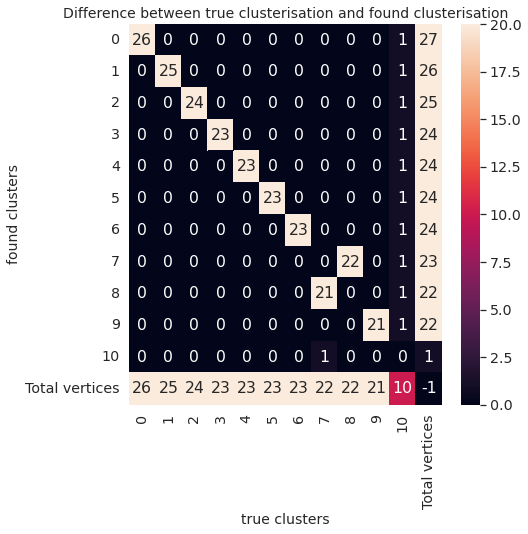

In [ ]:
visualize_cluster_formation_top_k_string(true_clusters_primary, labelss_primary[-1], figsize=(7, 7), k_prev=15)

In [ ]:
'''

with open("/gdrive/MyDrive/community_detection/datasets/NDC-classes/contact_primary_school_labelss", "wb") as fp:   #Pickling
    pickle.dump(labelss, fp)'''

'\n\nwith open("/gdrive/MyDrive/community_detection/datasets/NDC-classes/contact_primary_school_labelss", "wb") as fp:   #Pickling\n    pickle.dump(labelss, fp)'

Распределение размеров кластеров при различных ограничениях на количество ребер.

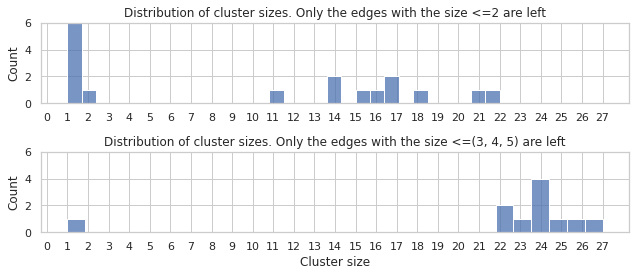

In [ ]:
sns.set_style("whitegrid")
plt.figure(figsize=(9, 4))
cluster_distr = get_cluster_sz_distribution(labelss_primary)

ax1 = plt.subplot(2, 1, 1)
plt.title('Distribution of cluster sizes. Only the edges with the size <= ' + str(sz_primary[0]) + ' are left')
sns.histplot(cluster_distr[0], bins=30)
plt.ylim(0, 6)
#plt.xticks(np.arange(0, 30, 1))

plt.subplot(2, 1, 2,  sharex=ax1)
plt.title('Distribution of cluster sizes. Only the edges with the size <=(3, 4, 5) are left')
sns.histplot(cluster_distr[1], bins=30)
plt.ylim(0, 6)

plt.xlabel('Cluster size')
plt.xticks(np.arange(0, 28, 1))
plt.tight_layout()

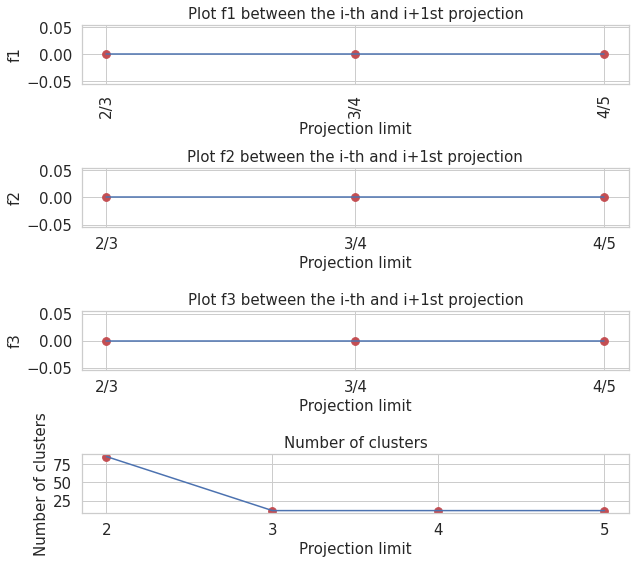

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs(labelss_primary, get_unique_edge_sizes(H_primary))

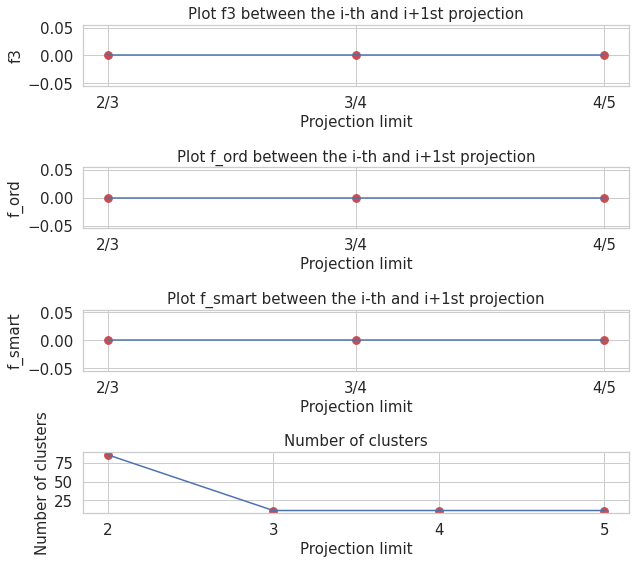

In [ ]:
sns.set_theme(style='whitegrid')

plot_horizontal_diffs_smooth(labelss_primary, get_unique_edge_sizes(H_primary))

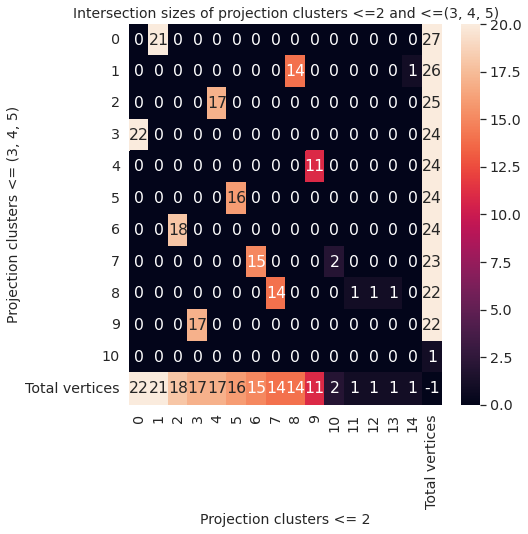

In [ ]:
visualize_cluster_formation_top_k(labelss_primary[0], labelss_primary[1], "2", "(3, 4, 5)", (7, 7), k_prev=15)

То же самое для его проектирования, кластеризуем Лувенским алгоритмом.

Проекция - по формуле $\Delta w = \frac{e.weight}{|e|}$

In [ ]:
projection_labelss_primary = get_step_by_step_clusterisation_proj(H_primary, lambda e, i, j: e.weight / len(e))
cluster_distr = get_cluster_sz_distribution(projection_labelss_primary)
cluster_distr

[array([71, 71, 49, 27, 24]),
 array([51, 48, 47, 46, 26, 24]),
 array([51, 48, 47, 46, 26, 24]),
 array([51, 48, 47, 46, 26, 24])]

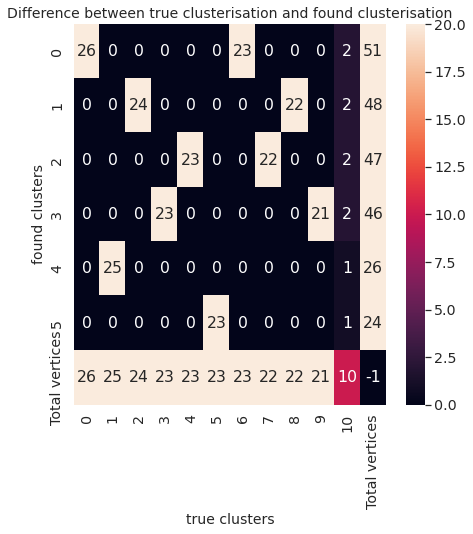

In [ ]:
visualize_cluster_formation_top_k_string(true_clusters_primary, projection_labelss_primary[-1], figsize=(7, 7), k_prev=15)

In [ ]:
alphas = np.linspace(0, 5, 20)

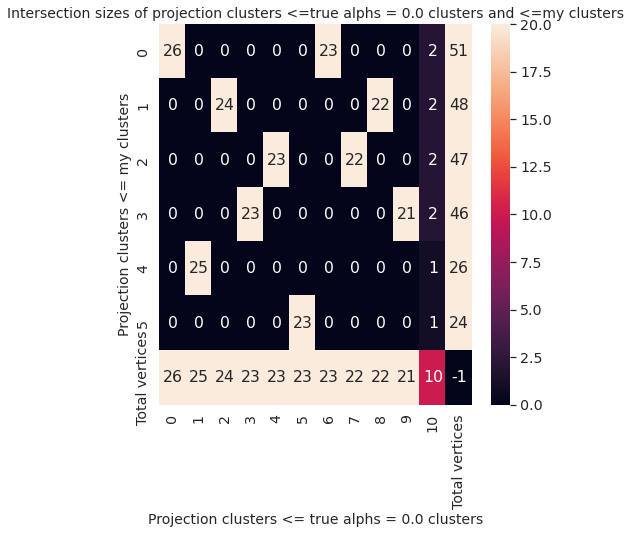

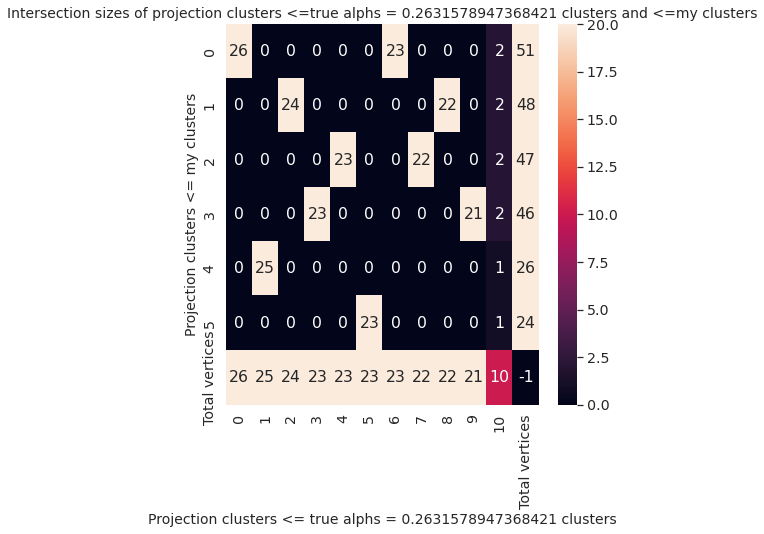

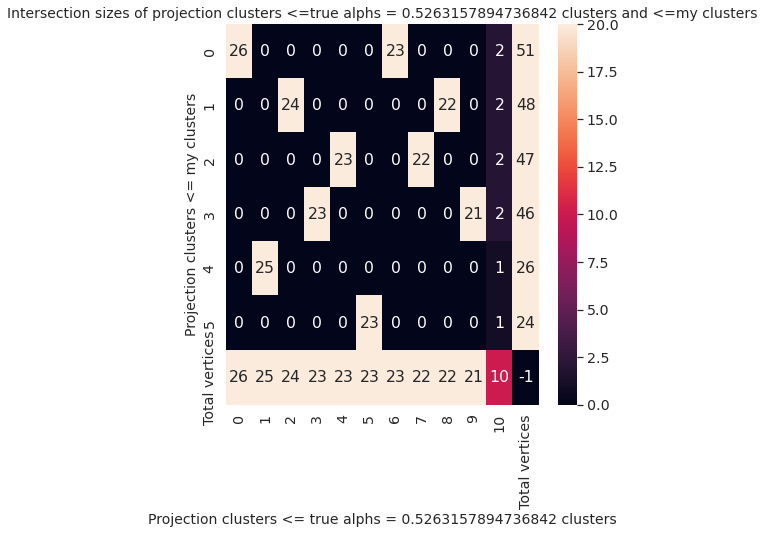

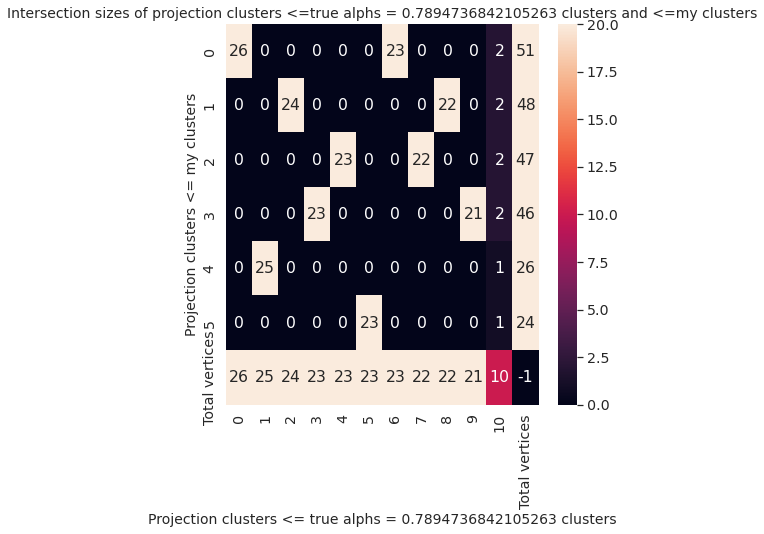

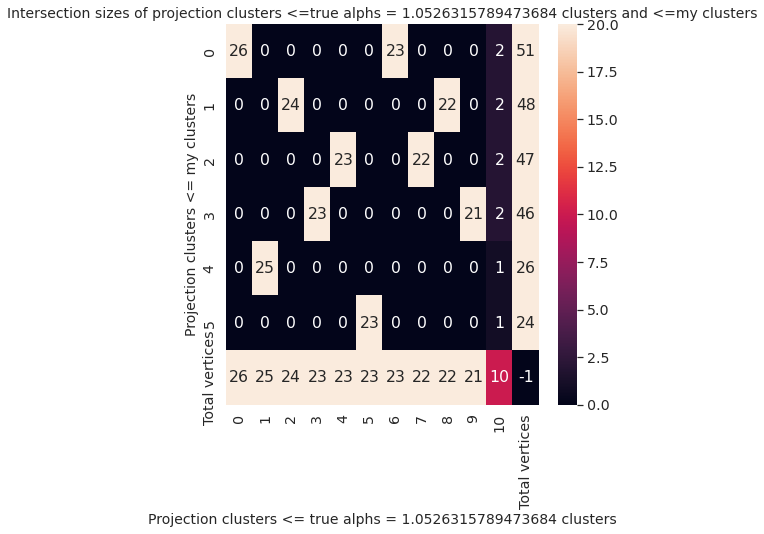

...

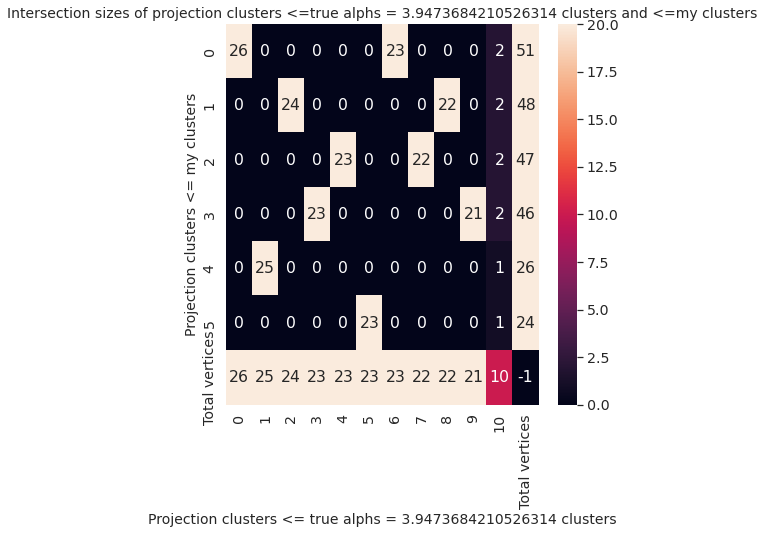

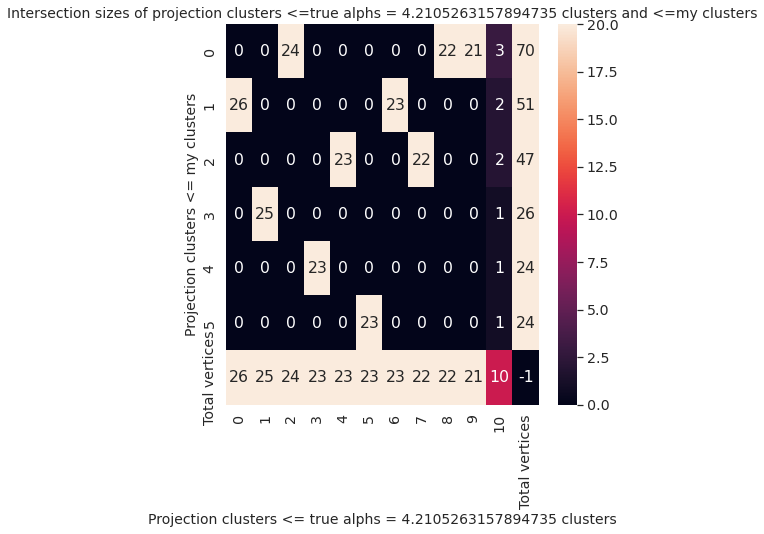

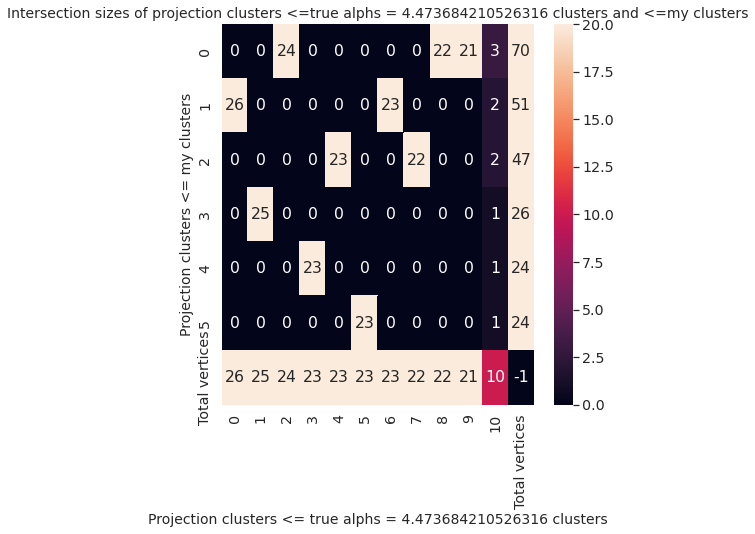

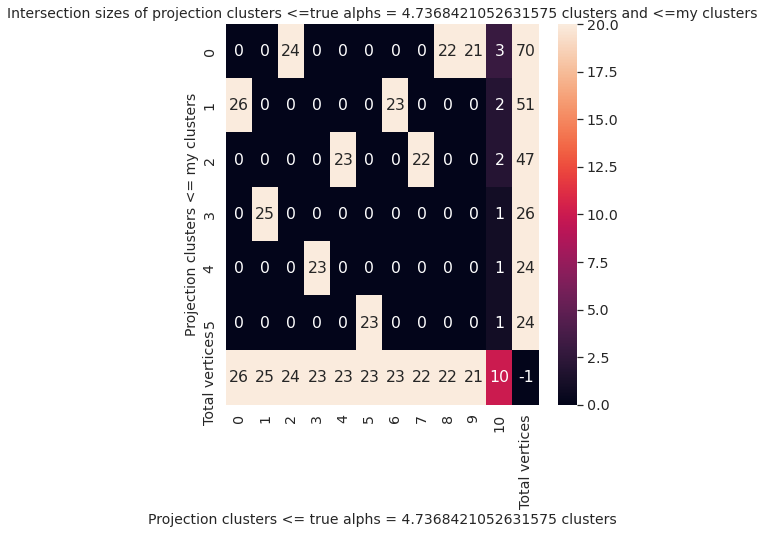

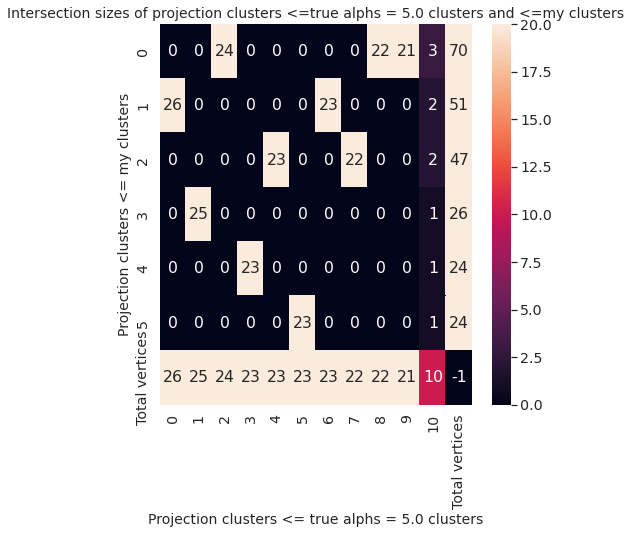

In [ ]:
for alpha in alphas:
    H_proj = remain_k(H_primary, 10000)
    G_proj, adj, z = get_projection_adj_z(H_proj, lambda e, i, j: e.weight / (len(e) ** alpha))

    visualize_cluster_formation_top_k(true_clusters_primary, z, f"true alphs = {alpha} clusters", "my clusters", figsize=(7, 7), k_prev=15)

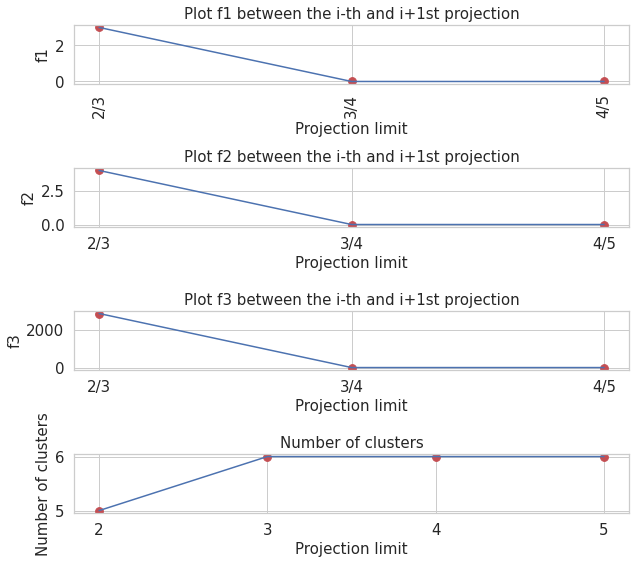

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs(projection_labelss_primary, get_unique_edge_sizes(H_primary))

In [ ]:
cluster_distr[0]

array([71, 71, 49, 27, 24])

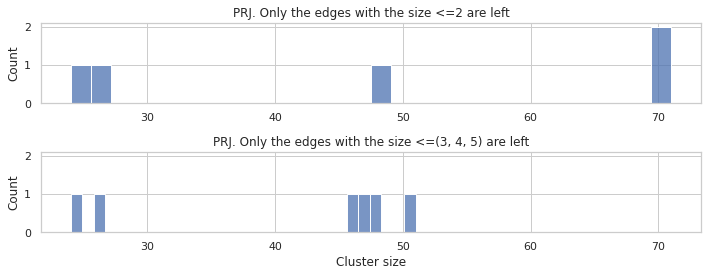

In [ ]:
sns.set_style("whitegrid")
# sns.set_style("ticks")
plt.figure(figsize=(10, 4))

ax = plt.subplot(2, 1, 1)
sz_primary = get_unique_edge_sizes(H_primary)

plt.title('PRJ. Only the edges with the size <=' + str(sz_primary[0]) + " are left")
sns.histplot(cluster_distr[0], bins=30)
plt.yticks([0, 1, 2])

plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
plt.title('PRJ. Only the edges with the size <=(3, 4, 5)' + " are left")
sns.histplot(cluster_distr[1], bins=30)
plt.xlabel('Cluster size')
#plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

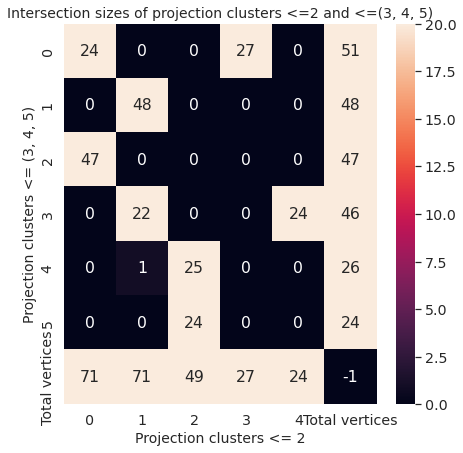

In [ ]:
visualize_cluster_formation_top_k(projection_labelss_primary[0], projection_labelss_primary[1], "2", "(3, 4, 5)", (7, 7), k_prev=15)

### Граф contact-high-school

##### Надо переопределить эти функции, чтобы кластеризация была успешной(совпадала с реальной).

In [ ]:
def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - парамет
        ры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * 4)
    return β, γ


def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * 4) # А здесь не m_k_collapsed?????
    return β, γ

def Q_for_all_ar_nothing_faster(H: Hypergraph, z, Ω, d, graph_volume, k, label_volumes, m_ks):
    '''
        k - максимальный размер гиперребра
        d - степени вершин
        label_volumes - объемы лейблов, соответствующие текущей кластеризации
    '''
    unique_labels = list(np.unique(z))

    β = 1
    ans = 0.0
    # k = 0 # k - vаксимальный размер гиперребра гиперграфа H
    # for edge in H.hyperedges:
    #    k = max(k, edge.vertexes.shape[0])

    # print('k = ', k)
    # graph_volume = vol_of_graph(H)

    # d[vertex] - cуммарный вес ребер, накрывающий вершину vertex
    # label_volumes = get_all_volumes(H, z, d)
    cut_ks = get_all_cut_ks(H, z, k, m_ks) # !!! Это очень долго!!!
    # print('Start')

    for i in range(1, k + 1):
        # print('i = ', i)
        γ = m_ks[i] / (graph_volume ** i) * 4
        sum_vol = 0
        for label in unique_labels: # квадратичная скорость
            sum_vol += γ * (label_volumes[label] ** i)
        ans -= β * (cut_ks[i] + sum_vol)
    return ans

##### А это переопределять не надо

In [ ]:
H_high, true_high_clusters = get_high_school_hypergraph()
# labelss_high, sz_high = get_step_by_step_clusterisation(H_high)
with open("/gdrive/MyDrive/community_detection/datasets/NDC-classes/contact_high_school_labelss", "rb") as fp:   # Unpickling
    labelss_high = pickle.load(fp)

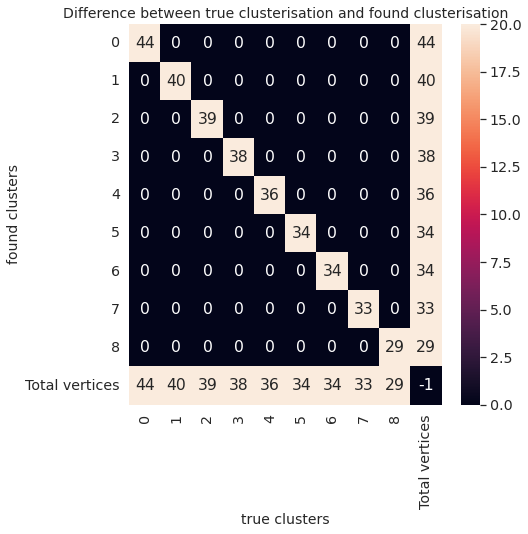

In [ ]:
visualize_cluster_formation_top_k_string(true_high_clusters, labelss_high[-1], figsize=(7, 7), k_prev=15)

Распределение размеров кластеров при различных ограничениях на количество ребер.

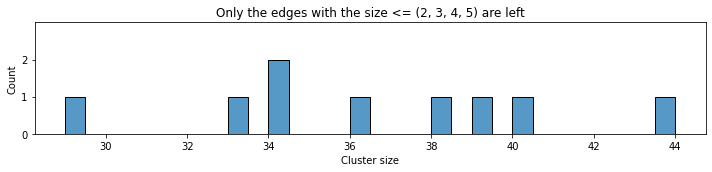

In [ ]:
plt.figure(figsize=(10, 2.5))
cluster_distr = get_cluster_sz_distribution(labelss_high)
sz_high = get_unique_edge_sizes(H_high)
plt.title('Only the edges with the size <= (2, 3, 4, 5) are left')
sns.histplot(cluster_distr[0], bins=30)
plt.ylim(0, 3)
plt.yticks([0, 1, 2])
plt.xlabel('Cluster size')

# plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

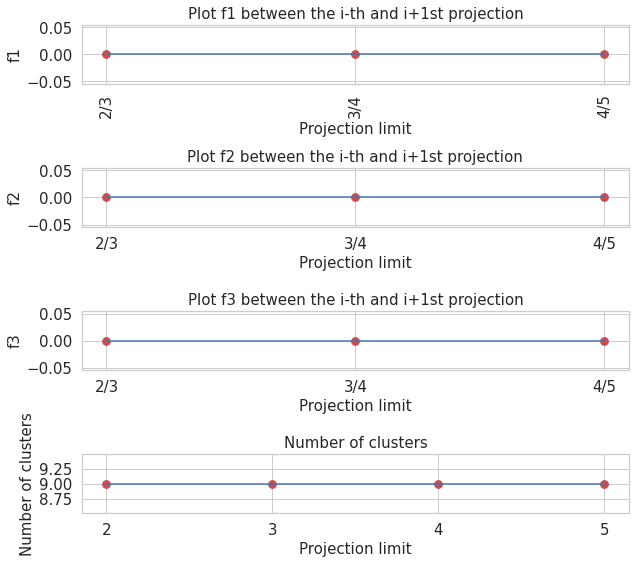

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs(labelss_high, get_unique_edge_sizes(H_high))

In [ ]:
def visualize_cluster_formation(z0, z1, figsize, vmin=0, vmax=20, percent=False):
    '''

    '''
    clusters_0 = get_clusters(z0)
    clusters_1 = get_clusters(z1)

    a = np.zeros(shape=(len(clusters_1), len(clusters_0)))

    for i, cluster1 in enumerate(clusters_1):
        for j, cluster0 in enumerate(clusters_0):
            a[i][j] = len(list(set(cluster1) & set(cluster0)))
    
    cluster_split = pd.DataFrame(a)
    cluster_split['Total vertices'] = cluster_split.sum(axis=1)
    cluster_split.loc['Total vertices'] = cluster_split.sum(axis=0)

    plt.figure(figsize=figsize)
    plt.title("Intersection size of projection clusters <=2 и <=(3, 4, 5)", fontsize=14)
    sns.set(font_scale=1.3)
    if percent:
        sns.heatmap(cluster_split / cluster_split.loc['Total vertices'], annot=True)
    else:
        sns.heatmap(cluster_split, annot=True, vmin=vmin, vmax=vmax)
    plt.xlabel('Projection clusters <=2', fontsize=14)
    plt.ylabel('Projection clusters <=(3, 4, 5)', fontsize=14)

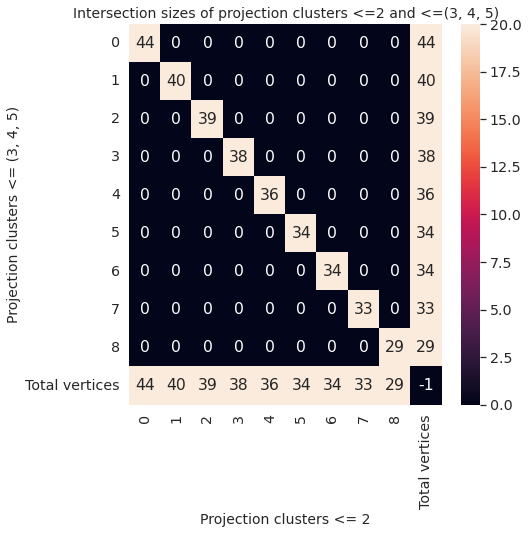

In [ ]:
visualize_cluster_formation_top_k(labelss_high[0], labelss_high[1], "2", "(3, 4, 5)", (7, 7), k_prev=15)

То же самое для его проектирования, кластеризуем Лувенским алгоритмом.

Проекция - по формуле $\Delta w = \frac{e.weight}{|e|}$

In [ ]:
projection_labelss_high = get_step_by_step_clusterisation_proj(H_high, lambda e, i, j: e.weight / len(e))
cluster_distr = get_cluster_sz_distribution(projection_labelss_high)
cluster_distr

[array([67, 44, 40, 39, 36, 34, 34, 33]),
 array([56, 44, 44, 40, 39, 36, 34, 34]),
 array([56, 44, 44, 40, 39, 37, 34, 33]),
 array([56, 44, 44, 40, 39, 37, 34, 33])]

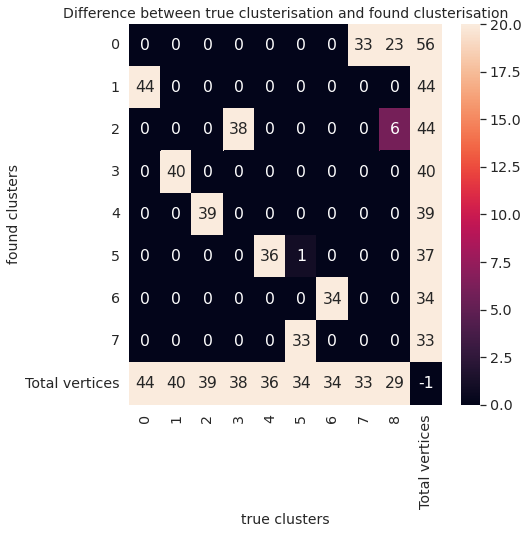

In [ ]:
visualize_cluster_formation_top_k_string(true_high_clusters, projection_labelss_high[-1], figsize=(7, 7), k_prev=15)

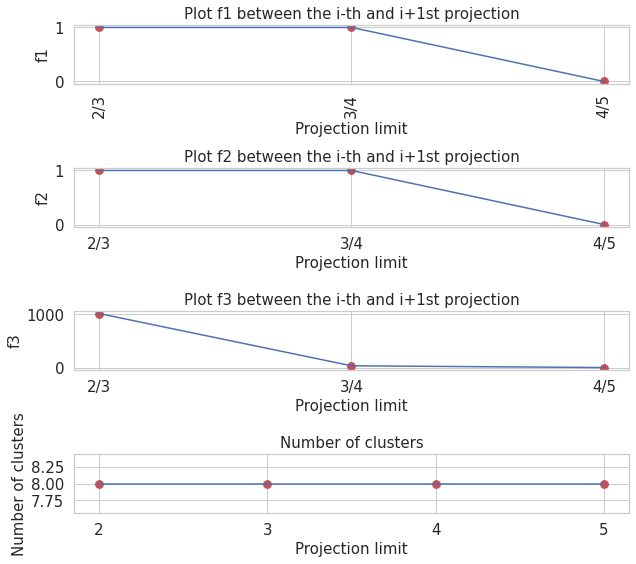

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs(projection_labelss_high, get_unique_edge_sizes(H_high))

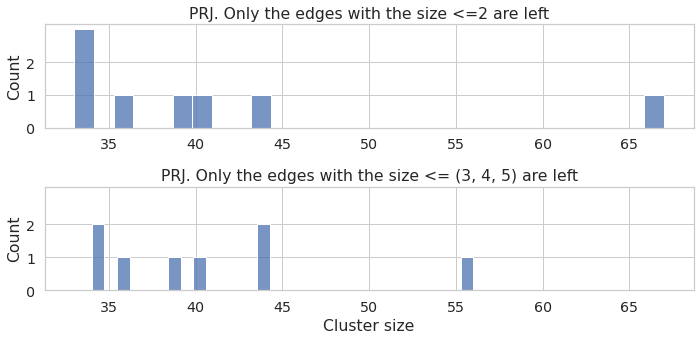

In [ ]:
sns.set_style("whitegrid")
#sns.set_style("ticks")
plt.figure(figsize=(10, 5))

ax = plt.subplot(2, 1, 1)
sz_high = get_unique_edge_sizes(H_high)

plt.title('PRJ. Only the edges with the size <=' + str(sz_high[0]) + " are left")
sns.histplot(cluster_distr[0], bins=30)
plt.yticks([0, 1, 2])

plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
plt.title(f'PRJ. Only the edges with the size <= {sz_high[1], sz_high[2], sz_high[3]} are left')
sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

plt.xlabel('Cluster size')
plt.tight_layout()

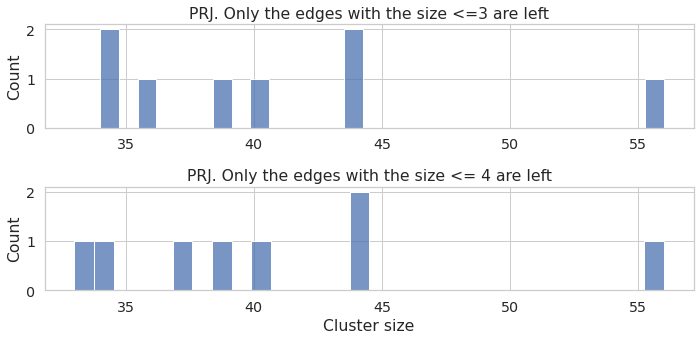

In [ ]:
sns.set_style("whitegrid")
#sns.set_style("ticks")
plt.figure(figsize=(10, 5))

ax = plt.subplot(2, 1, 1)
sz_high = get_unique_edge_sizes(H_high)

plt.title('PRJ. Only the edges with the size <=' + str(sz_high[1]) + " are left")
sns.histplot(cluster_distr[1], bins=30)
plt.yticks([0, 1, 2])

plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
plt.title(f'PRJ. Only the edges with the size <= {sz_high[2]} are left')
sns.histplot(cluster_distr[2], bins=30)
#plt.xticks(np.arange(0, 30, 1))

plt.xlabel('Cluster size')
plt.tight_layout()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

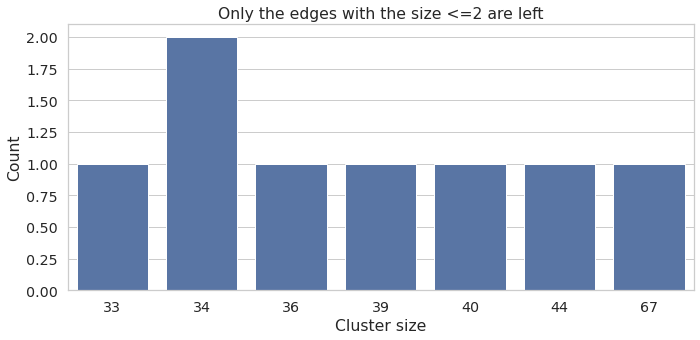

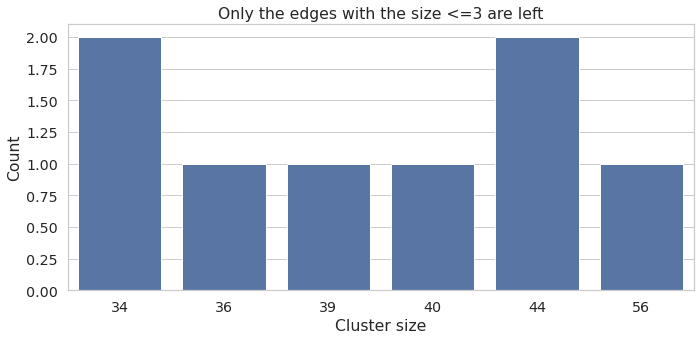

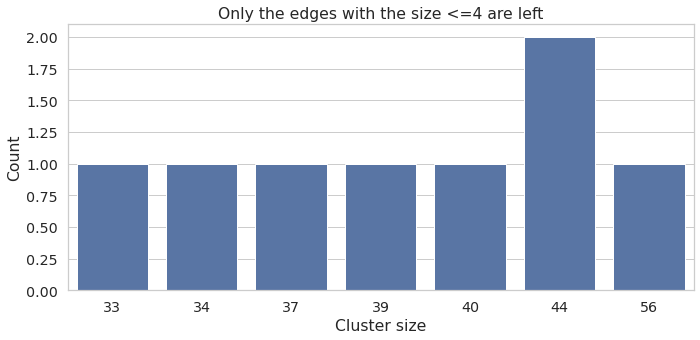

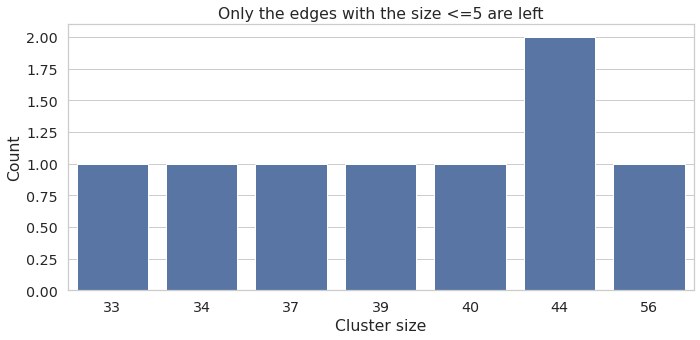

In [ ]:
prev_sz, prev_distr = None, None
for sz, clust_dist in zip(sz_high, cluster_distr):
    if sz == prev_sz and clust_dist == prev_distr:
        continue
    prev_sz = sz
    prev_distr = clust_dist
    clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
    plt.figure(figsize=(10, 5))

    plt.title('Only the edges with the size <=' + str(sz) + " are left")
    sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

    #plt.xticks(np.arange(0, 130, 5))
    #plt.yticks([0, 1, 2])

    #plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
    #plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
    #sns.histplot(cluster_distr[1], bins=30)
    #plt.xticks(np.arange(0, 30, 1))

    #plt.xticks(clust_distr)
    plt.ylabel('Count')

    plt.xlabel('Cluster size')
    plt.tight_layout()

In [ ]:
sz_high

[2, 3, 4, 5]

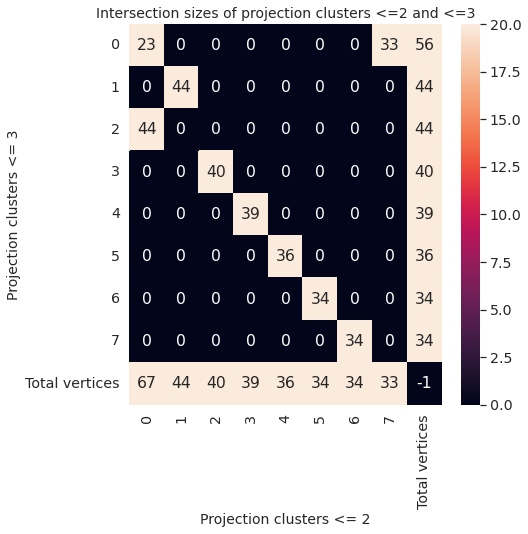

In [ ]:
visualize_cluster_formation_top_k(projection_labelss_high[0], projection_labelss_high[1], "2", "3", (7, 7), k_prev=15)

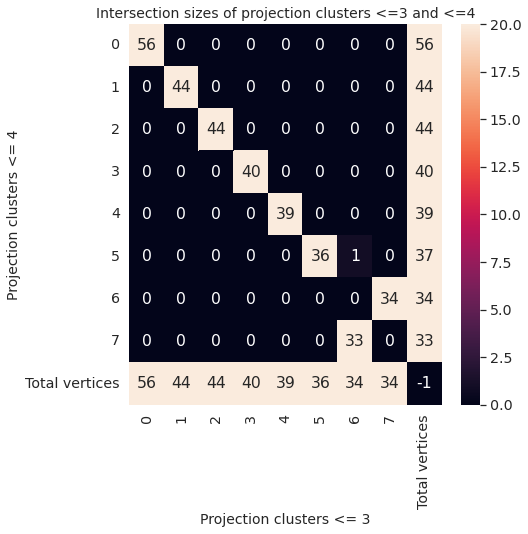

In [ ]:
visualize_cluster_formation_top_k(projection_labelss_high[1], projection_labelss_high[2], "3", "4", (7, 7), k_prev=15)

In [ ]:
alphas = np.linspace(0, 5, 20)

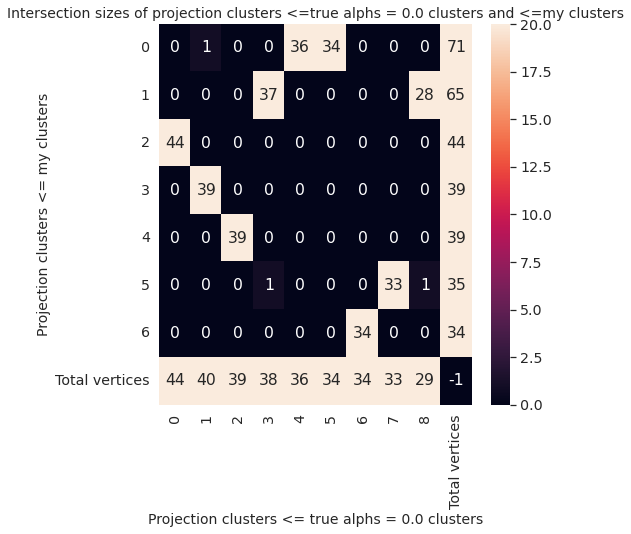

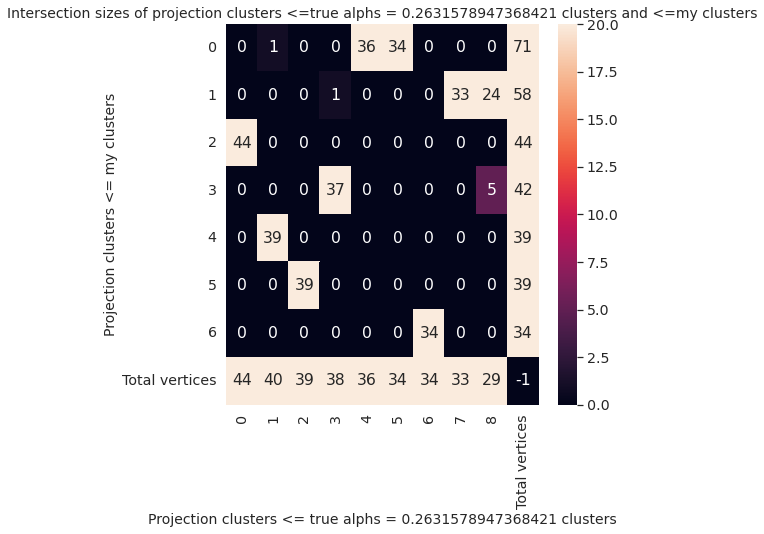

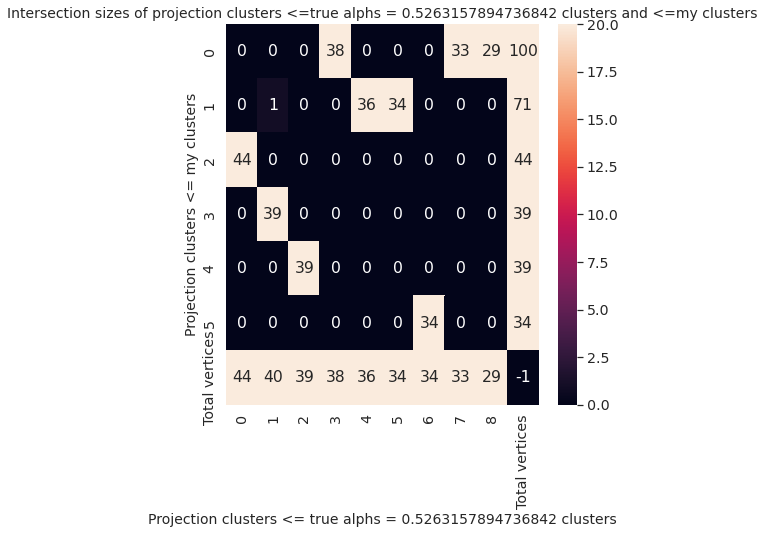

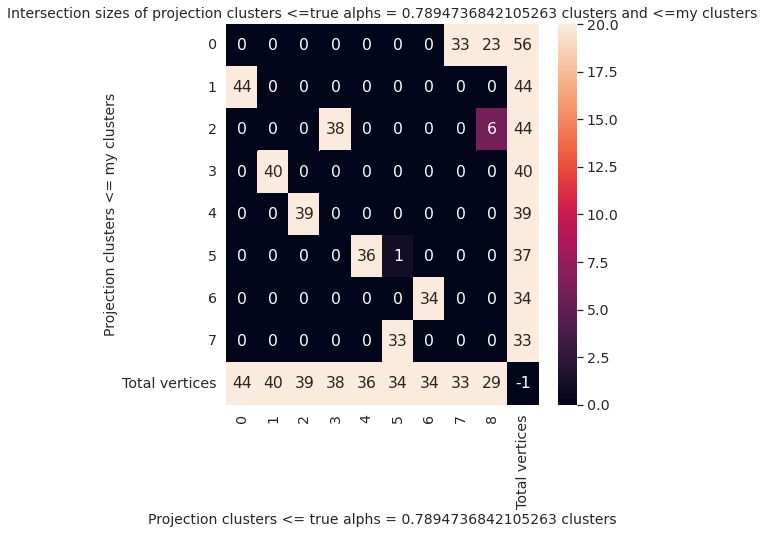

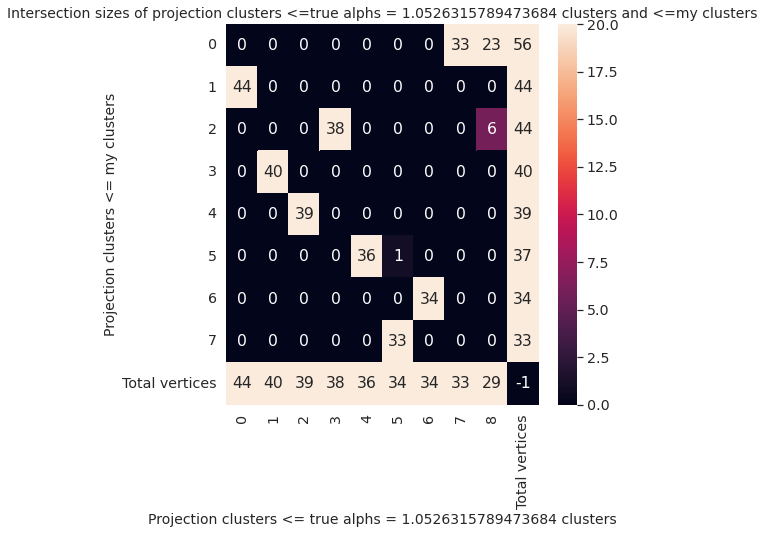

...

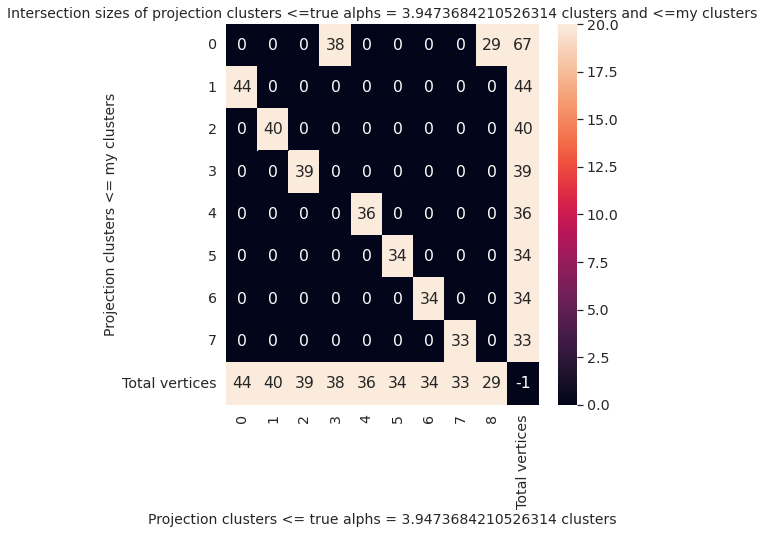

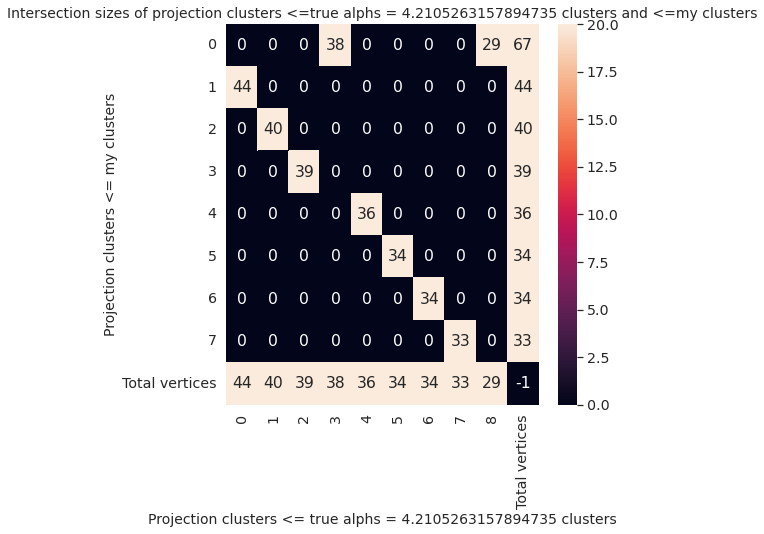

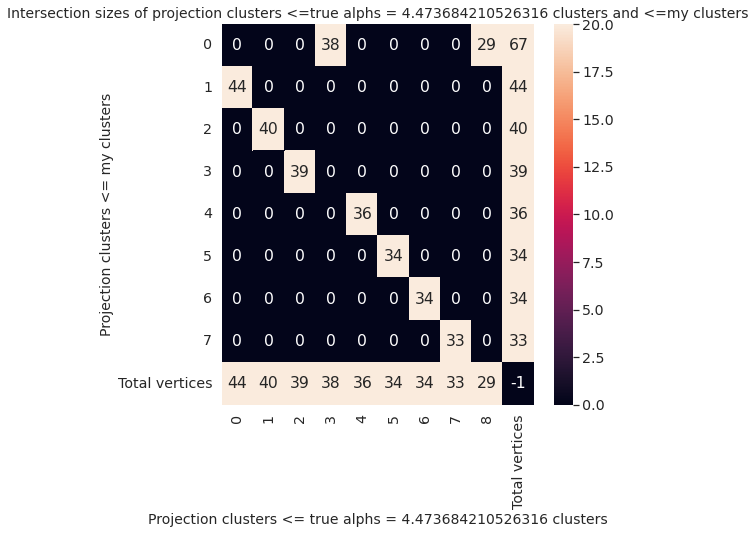

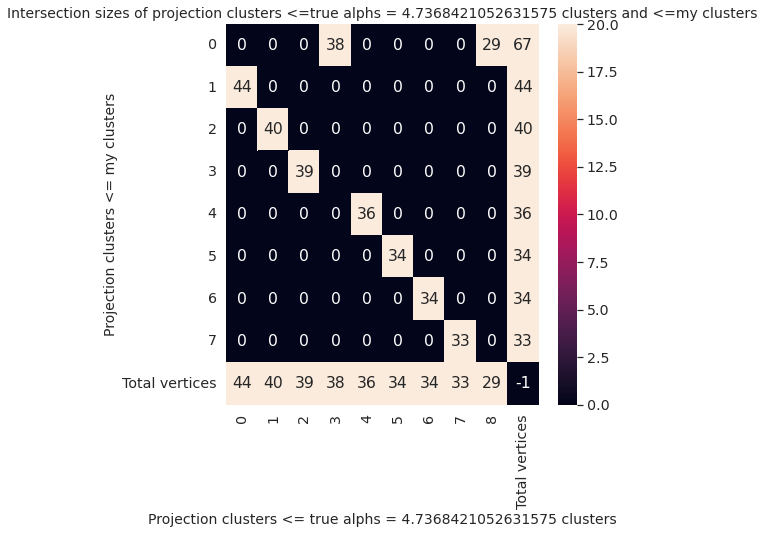

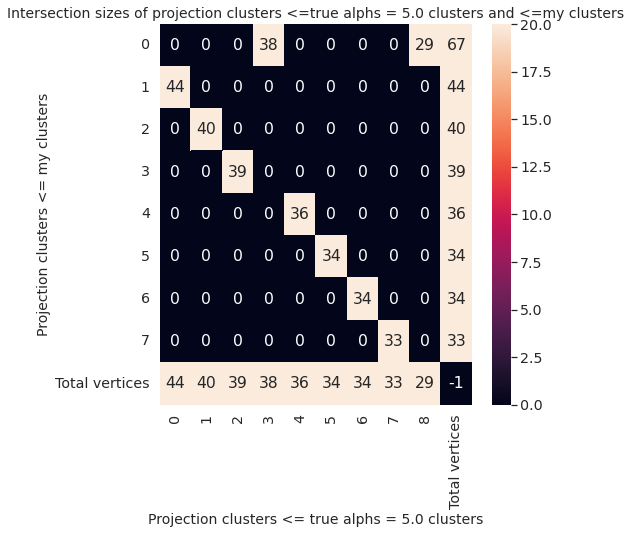

In [ ]:
for alpha in alphas:
    H_proj = remain_k(H_high, 10000)
    G_proj, adj, z = get_projection_adj_z(H_proj, lambda e, i, j: e.weight / (len(e) ** alpha))

    visualize_cluster_formation_top_k(true_high_clusters, z, f"true alphs = {alpha} clusters", "my clusters", figsize=(7, 7), k_prev=15)

### Граф NDC-classes

##### Надо переопределить эти функции, чтобы кластеризация была успешной(совпадала с реальной).

In [ ]:
def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - парамет
        ры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * np.exp(k / 3))
        β[k] = k * (k - 1) / 2
    return β, γ


def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        # γ.append(m_ks[k] / (H_vol ** k) * 4) # А здесь не m_k_collapsed?????
        γ.append(m_ks[k] / (H_vol ** k) * np.exp(k / 3))
        β[k] = k * (k - 1) / 2
    return β, γ

##### А эти не надо.

Оставим только гигантскую компоненту. И сначала кластеризуем с помощью HSBM.

In [ ]:
NDC = get_NDC_classes_hypergraph()
G = get_projection_graph(NDC, lambda v1, v2, w: w)
conn_comp = sorted(list(nx.connected_components(G)), key=lambda x: -len(x))
comp_sz = [len(x) for x in conn_comp]
print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))

NDC_big = NDC.pruning(list(conn_comp[0]))
NDC_big_sz = get_unique_edge_sizes(NDC_big)

top-10 components:  [628, 60, 26, 18, 8, 8, 7, 7, 7, 6] 
number components:  183


In [ ]:
NDC_big.number_of_vertexes

628

In [ ]:
len(NDC_big.hyperedges)

816

In [ ]:
degs = []
for v in range(NDC_big.number_of_vertexes):
    degs.append(NDC_big.degree(v))

degs = np.array(degs)

In [ ]:
degs.mean()

9.05732484076433

In [ ]:
hed = []
for e in NDC_big.hyperedges:
    hed.append(len(e))

hed = np.array(hed)

In [ ]:
hed.mean()

6.970588235294118

In [ ]:
np.unique(hed)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])

In [ ]:
with open("/gdrive/MyDrive/community_detection/datasets/NDC-classes/NDC_labelss", "rb") as fp:   # Unpickling
    NDC_big_labelss = pickle.load(fp)

In [ ]:
np.unique(NDC_big_labelss).shape

(528,)

In [ ]:
sz, cnt_sz = get_unique_edge_sizes(NDC_big, return_counts=True)

In [ ]:
len(sz), len(cnt_sz)

(24, 24)

Text(0.5, 1.0, 'Edge sizes distrubution')

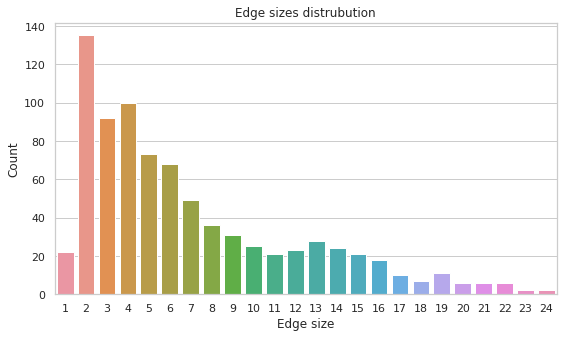

In [ ]:
plt.figure(figsize=(9, 5))
sns.barplot(x=sz, y = cnt_sz)
plt.xlabel("Edge size")
plt.ylabel("Count")
plt.title("Edge sizes distrubution")

In [ ]:
cluster_distr = get_cluster_sz_distribution(NDC_big_labelss)
sz_ndc_big = get_unique_edge_sizes(NDC_big)
if len(sz_ndc_big) != len(NDC_big_labelss):
    sz_ndc_big = sz_ndc_big[1:]

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


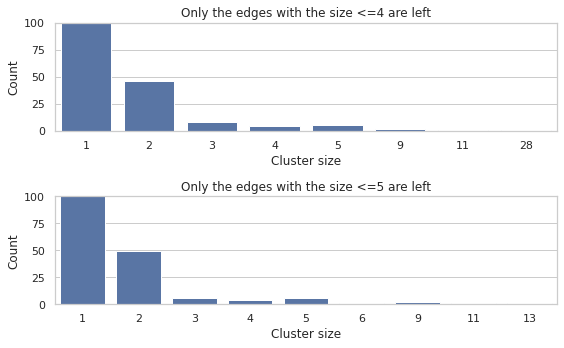

In [ ]:
plt.figure(figsize=(8, 5))

i = 2
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)

plt.subplot(2, 1, 1)

plt.ylim([0, 100])

plt.title('Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')

plt.subplot(2, 1, 2)
plt.ylim([0, 100])

i = 3
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
plt.title('Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')



plt.tight_layout()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


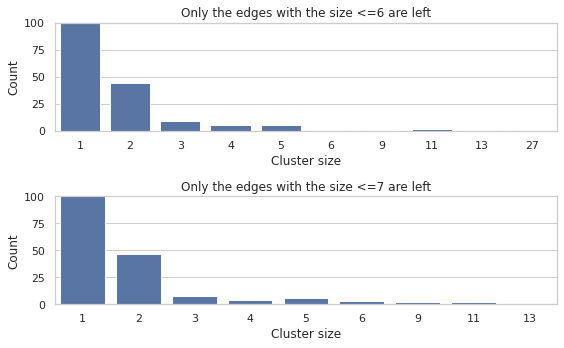

In [ ]:
plt.figure(figsize=(8, 5))

i = 4
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)

ax = plt.subplot(2, 1, 1)

plt.ylim([0, 100])

plt.title('Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')

plt.subplot(2, 1, 2)
plt.ylim([0, 100])

i = 5
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
plt.title('Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')



plt.tight_layout()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


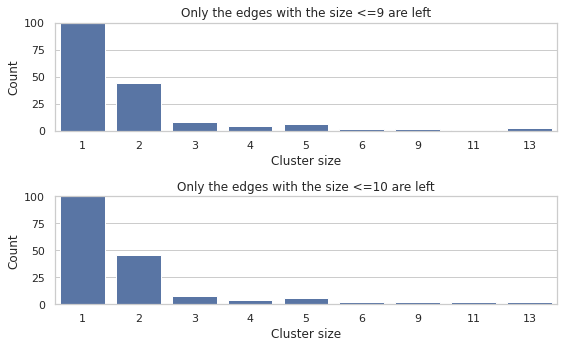

In [ ]:
plt.figure(figsize=(8, 5))

i = 7
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)

ax = plt.subplot(2, 1, 1)

plt.ylim([0, 100])

plt.title('Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')

plt.subplot(2, 1, 2)
plt.ylim([0, 100])

i = 8
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
plt.title('Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')



plt.tight_layout()

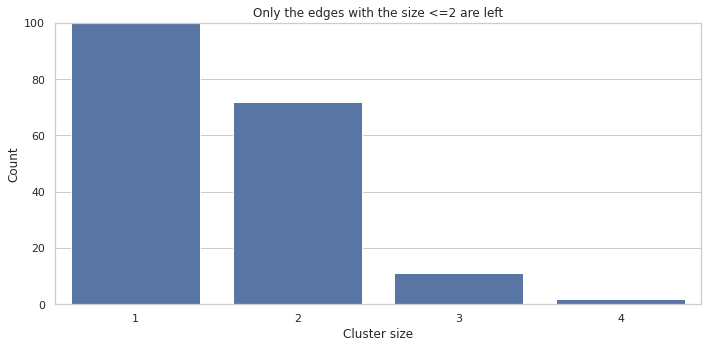

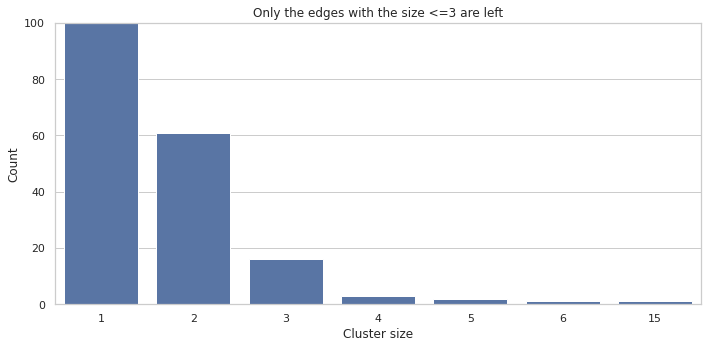

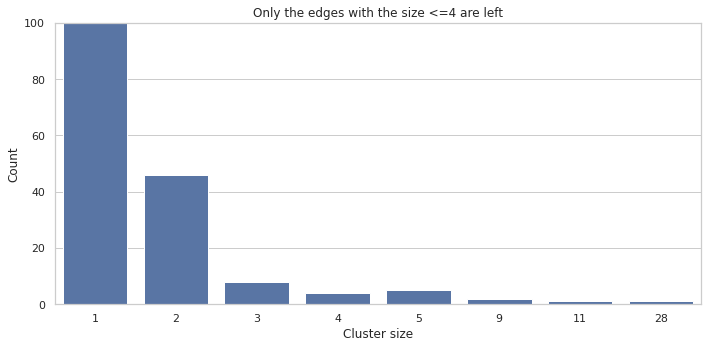

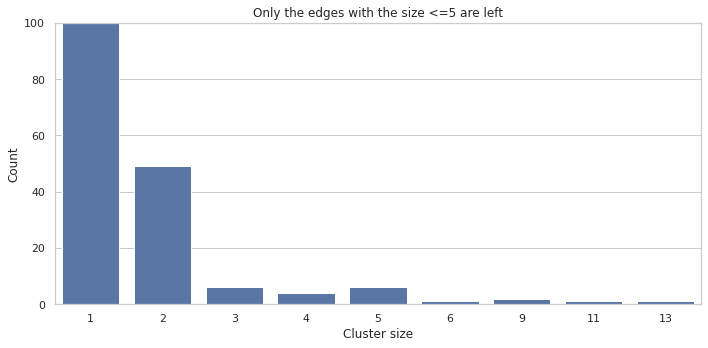

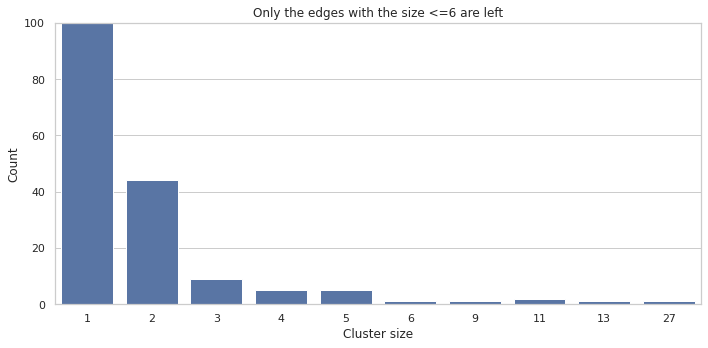

...

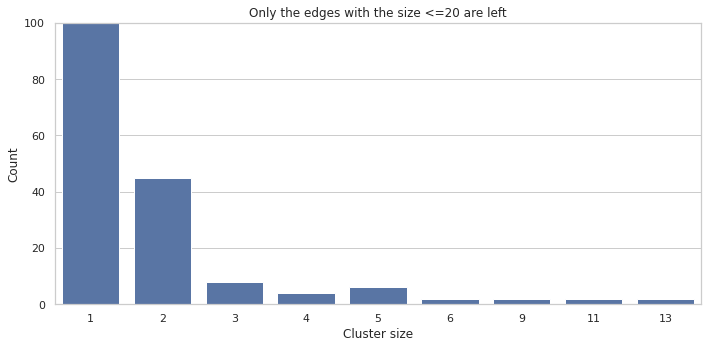

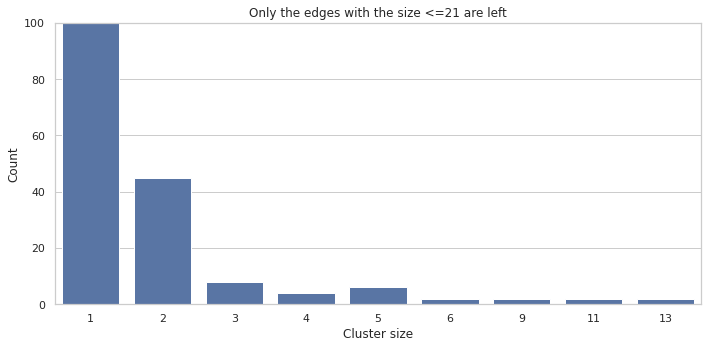

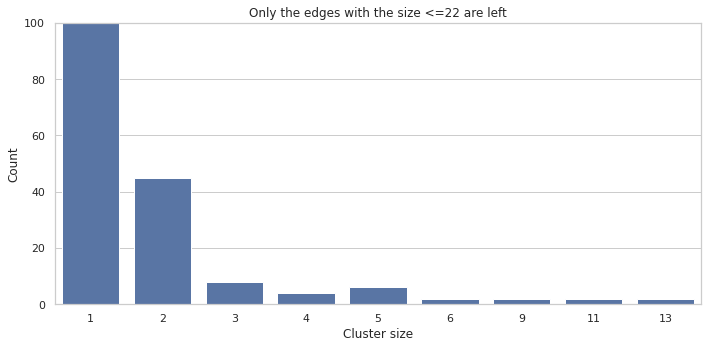

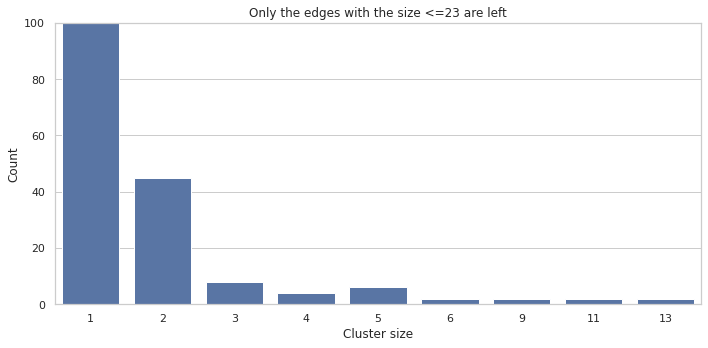

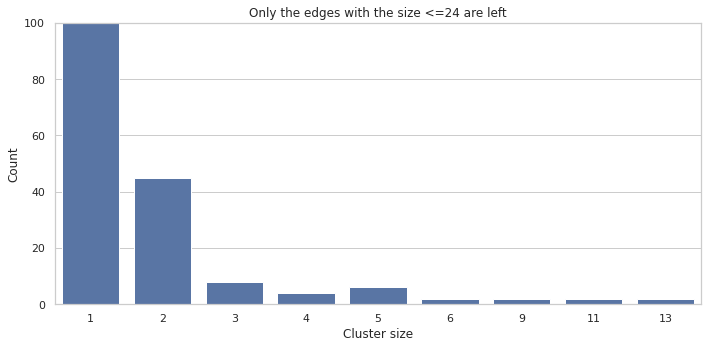

In [ ]:
prev_sz, prev_distr = None, None
for sz, clust_dist in zip(sz_ndc_big, cluster_distr):
    if sz == prev_sz and clust_dist == prev_distr:
        continue
    prev_sz = sz
    prev_distr = clust_dist
    clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
    plt.figure(figsize=(10, 5))

    plt.title('Only the edges with the size <=' + str(sz) + " are left")
    sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

    #plt.xticks(np.arange(0, 130, 5))
    #plt.yticks([0, 1, 2])

    #plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
    #plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
    #sns.histplot(cluster_distr[1], bins=30)
    #plt.xticks(np.arange(0, 30, 1))

    #plt.xticks(clust_distr)
    plt.ylim([0, 100])
    plt.ylabel('Count')

    plt.xlabel('Cluster size')
    plt.tight_layout()

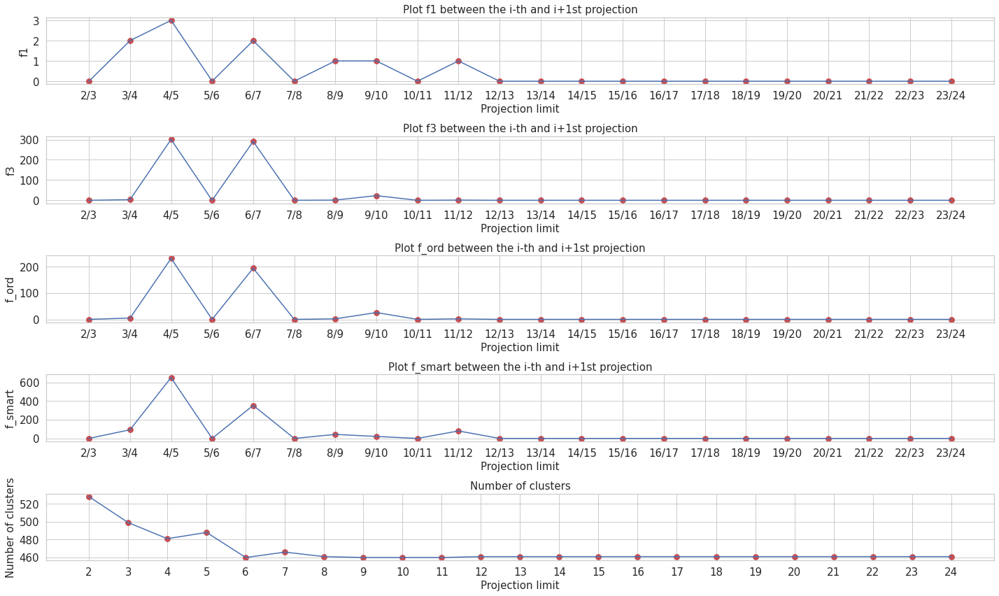

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs_all(NDC_big_labelss, sz_ndc_big, figsize=(20, 12))

Как видим, кластеризации почти нет. Кроме того, преимущественно кластеры размера 1.

##### Теперь кластеризуем проекциями.

In [ ]:
NDC_big.number_of_vertexes

628

In [ ]:
projection_labelss_ndc_big = get_step_by_step_clusterisation_proj(NDC_big, lambda e, i, j: e.weight / len(e))
cluster_distr = get_cluster_sz_distribution(projection_labelss_ndc_big)

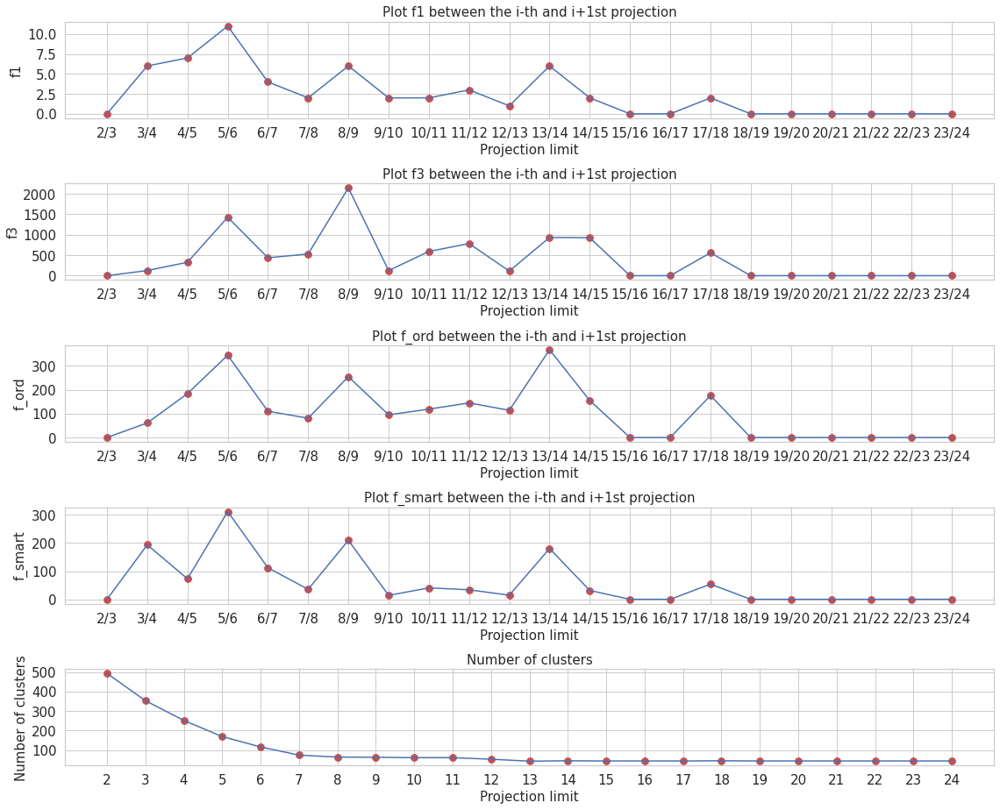

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs_all(projection_labelss_ndc_big, sz_ndc_big, figsize=(16, 13))

In [ ]:
def visualize_cluster_formation_top_k(z0, z1, k0, k1, figsize, k_prev=10, k_curr=None, vmin=0, vmax=20, percent=False):
    '''
        k - топ-k кластеров с предыдущего слоя на top-k (по размеру) следующего будут изображаться 
    '''
    if k_curr is None:
        k_curr = k_prev
    clusters_0 = get_clusters(z0)[:k_prev]
    clusters_1 = get_clusters(z1)[:k_curr]

    a = np.zeros(shape=(len(clusters_1), len(clusters_0)))

    for i, cluster1 in enumerate(clusters_1):
        for j, cluster0 in enumerate(clusters_0):
            a[i][j] = len(list(set(cluster1) & set(cluster0)))
    
    cluster_split = pd.DataFrame(a)
    # cluster_split['Total vertices'] = cluster_split.sum(axis=1)
    cluster_split['Total vertices'] = [len(clus) for clus in clusters_1]
    # cluster_split.loc['Total vertices'] = cluster_split.sum(axis=0)

    lst =  [len(clus) for clus in clusters_0]

    # if not percent:
    lst.append(-1)
    cluster_split.loc['Total vertices'] = lst

    plt.figure(figsize=figsize)
    plt.title(f"Intersection sizes of projection clusters <={k0} and <={k1}", fontsize=14)
    sns.set(font_scale=1.3)
    if percent:
        sns.heatmap(cluster_split / cluster_split.loc['Total vertices'], annot=True, fmt='.2f', vmin=0, vmax=1)
    else:
        sns.heatmap(cluster_split, annot=True, vmin=vmin, vmax=vmax)
    plt.xlabel(f'Projection clusters <= {k0}', fontsize=14)
    plt.ylabel(f'Projection clusters <= {k1}', fontsize=14)

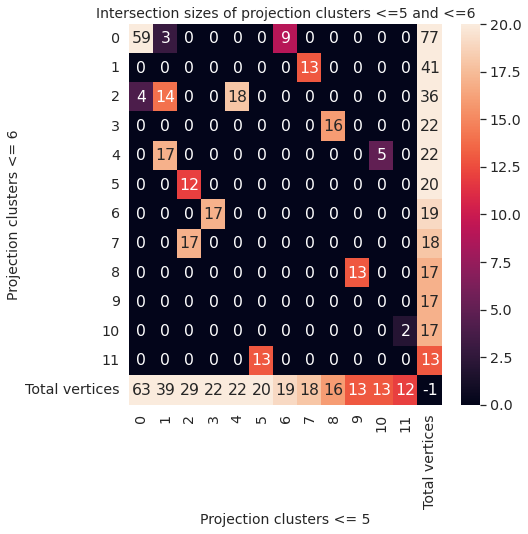

In [ ]:
i0 = 3
i1 = 4
visualize_cluster_formation_top_k(projection_labelss_ndc_big[i0], projection_labelss_ndc_big[i1], sz_ndc_big[i0], sz_ndc_big[i1], (7, 7), k_prev=12)

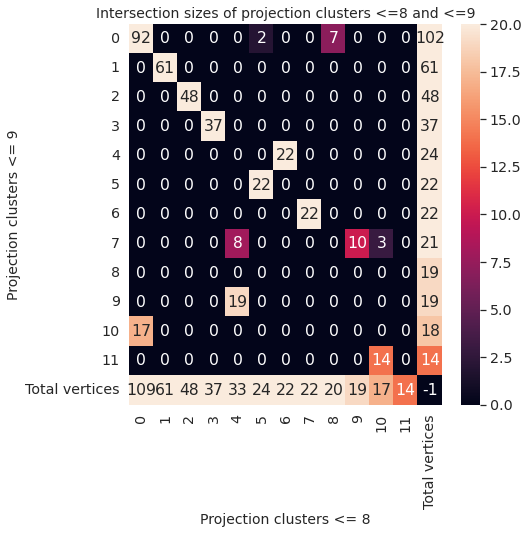

In [ ]:
i0 = 6
i1 = 7
visualize_cluster_formation_top_k(projection_labelss_ndc_big[i0], projection_labelss_ndc_big[i1], sz_ndc_big[i0], sz_ndc_big[i1], (7, 7), k_prev=12)

In [ ]:
alphas = np.linspace(-20, 5, 60)

In [ ]:
for alpha in alphas:
    H_proj = remain_k(NDC_big, 10000)
    G_proj, adj, z = get_projection_adj_z(H_proj, lambda e, i, j: e.weight / (len(e) ** alpha))
    print('alpha=', alpha, " nclust = ", np.unique(z).shape)
    #visualize_cluster_formation_top_k(true_high_clusters, z, f"true alphs = {alpha} clusters", "my clusters", figsize=(7, 7), k_prev=15)

In [ ]:
alpha=-5

In [ ]:
projection_labelss_ndc_big = get_step_by_step_clusterisation_proj(NDC_big, lambda e, i, j: e.weight / (len(e) ** alpha))
cluster_distr = get_cluster_sz_distribution(projection_labelss_ndc_big)

In [ ]:
def plot_different_diff_alpha(labelss, sz, alpha_ords, figsize=(30, 8)):
    '''
        labelss - это список кластеризаций
    '''
    assert sz[0] != 1

    diffs_ord = []
    for alpha in alpha_ords:
        diffs_ord.append([get_smooth_difference(labelss[i - 1], labelss[i], alpha=alpha) for i in range(1, len(labelss))])

    # diffs3 = [difference3(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
    # diffs_ord = [get_smooth_difference(labelss[i - 1], labelss[i], alpha=alpha_ord) for i in range(1, len(labelss))]
    # diffs_smart = [get_smooth_smart_diff(labelss[i - 1], labelss[i], alpha=alpha_smart, beta=beta) for i in range(1, len(labelss))]
    
    plt.figure(figsize=(figsize[0], 2.3 * len(alpha_ords)))

    xx = np.arange(len(diffs_ord[0]))

    for j in range(len(alpha_ords)):
        
        plt.subplot(len(alpha_ords), 1, j + 1)
        diffs3 = diffs_ord[j]
        plt.plot(xx, diffs3)

        xx_to = []
        for i in range(1, len(sz)):
            prev = sz[i - 1]
            cur = sz[i]
            xx_to.append(str(prev) + "/" + str(cur))

        plt.xticks(xx, xx_to, fontsize=15)
        plt.scatter(x=xx, y=diffs3, c='r', s=60)
        plt.title(f'Plot f_ord between the i-th and i+1st projection; alpha={alpha_ords[j]}', fontsize=15)
        plt.xlabel('Projection limit', fontsize=15)
        plt.yticks(fontsize=15)
        plt.ylabel('f_ord', fontsize=15)
        # plt.xticks(rotation=90)

    plt.tight_layout()

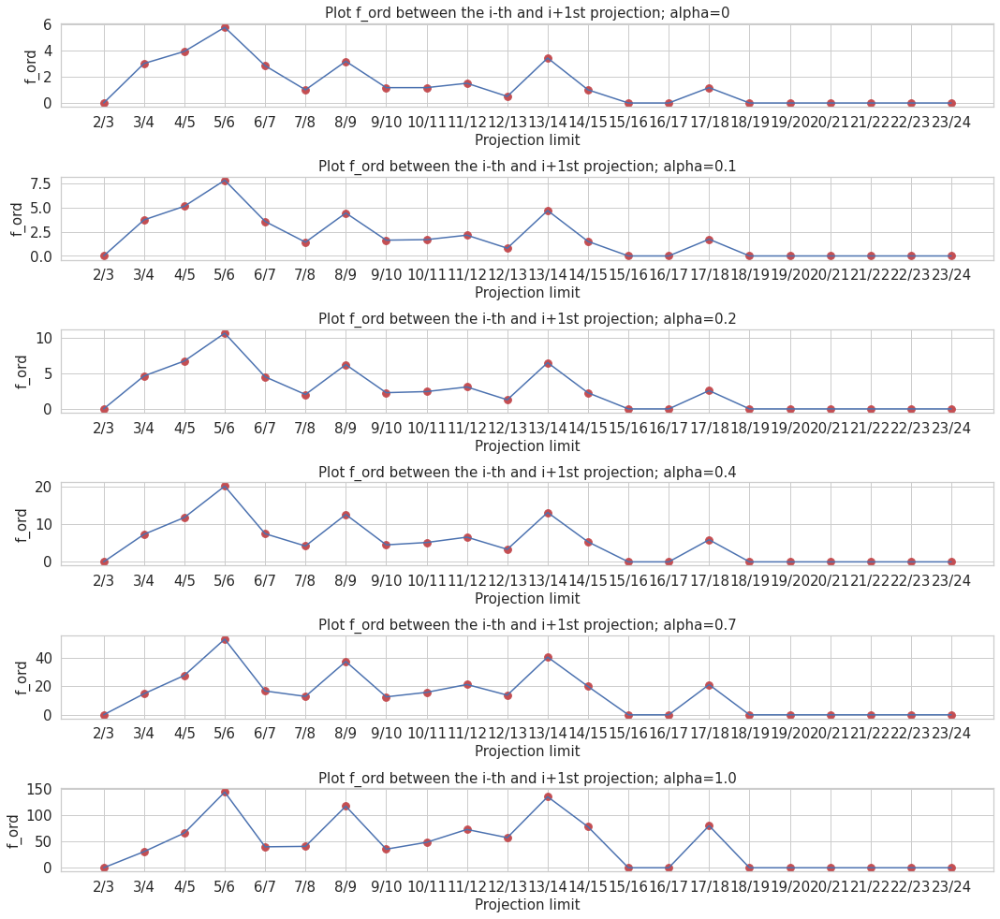

In [ ]:
sns.set_theme(style='whitegrid')
plot_different_diff_alpha(projection_labelss_ndc_big, sz_ndc_big, alpha_ords=[0, 0.1, 0.2, 0.4, 0.7, 1.0], figsize=(16, 12))

In [ ]:
sz_ndc_big.index(5)

3

In [ ]:
def get_n_components(H: Hypergraph):
    G = get_projection_graph(H, lambda v1, v2, w: w)
    conn_comp = sorted(list(nx.connected_components(G)), key=lambda x: -len(x))
    return len(conn_comp)

In [ ]:
sz_ndc_big

In [ ]:
n_comp = []

for k in sz_ndc_big:
    G = remain_k(NDC_big, k)
    n_comp.append(get_n_components(G))

Text(0, 0.5, 'Number of components')

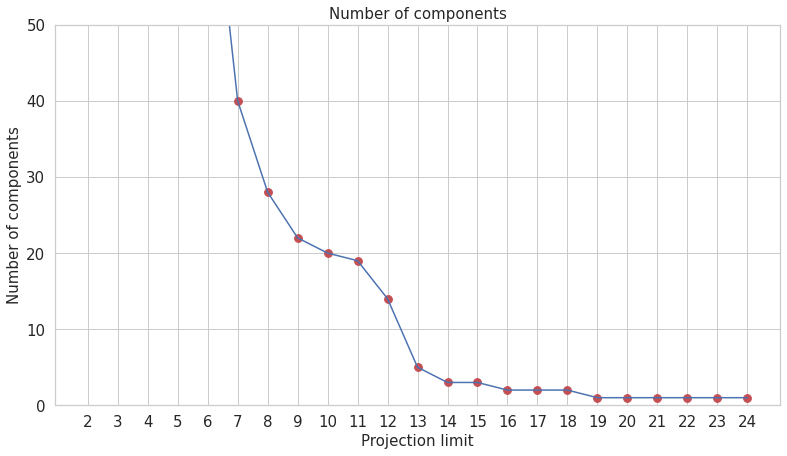

In [ ]:
sns.set_theme(style='whitegrid')

plt.figure(figsize=(13, 7))
xx = np.arange(len(sz_ndc_big))
plt.plot(xx, n_comp)
plt.yticks(fontsize=15)
plt.ylim([0, 50])
plt.xticks(np.array(xx), sz_ndc_big, fontsize=15)
plt.scatter(x=np.array(xx), y=n_comp, c='r', s=60)
plt.title('Number of components', fontsize=15)
plt.xlabel('Projection limit', fontsize=15)
plt.ylabel('Number of components', fontsize=15)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


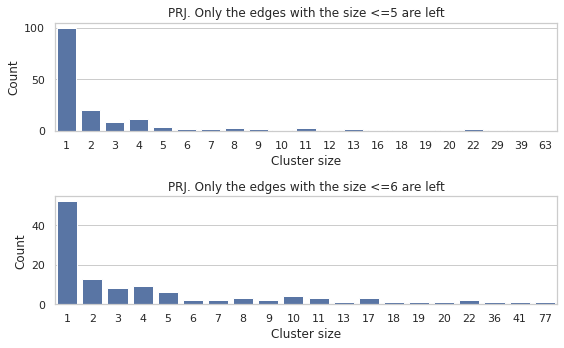

In [ ]:
plt.figure(figsize=(8, 5))

i = 3
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)

ax = plt.subplot(2, 1, 1)

plt.title('PRJ. Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')

plt.subplot(2, 1, 2)

i += 1
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
plt.title('PRJ. Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')



plt.tight_layout()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


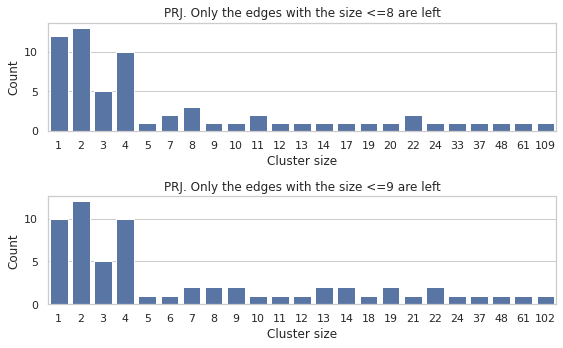

In [ ]:
plt.figure(figsize=(8, 5))

i = 6
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)

ax = plt.subplot(2, 1, 1)

plt.title('PRJ. Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')

plt.subplot(2, 1, 2)

i += 1
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
plt.title('PRJ. Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')



plt.tight_layout()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


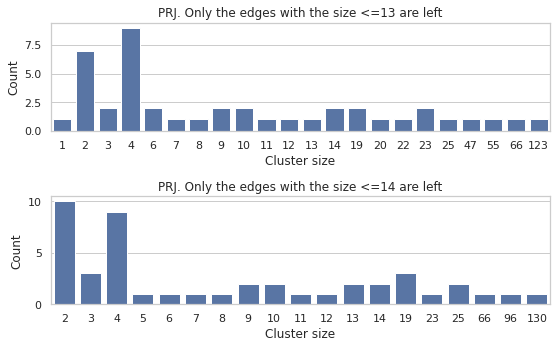

In [ ]:
plt.figure(figsize=(8, 5))

i = 11
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)

ax = plt.subplot(2, 1, 1)

plt.title('PRJ. Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')

plt.subplot(2, 1, 2)

i += 1
sz = sz_ndc_big[i]
clust_dist = cluster_distr[i]

clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
plt.title('PRJ. Only the edges with the size <=' + str(sz) + " are left")
sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

#plt.xticks(np.arange(0, 130, 5))
#plt.yticks([0, 1, 2])

#plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
#plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
#sns.histplot(cluster_distr[1], bins=30)
#plt.xticks(np.arange(0, 30, 1))

#plt.xticks(clust_distr)
plt.ylabel('Count')

plt.xlabel('Cluster size')



plt.tight_layout()

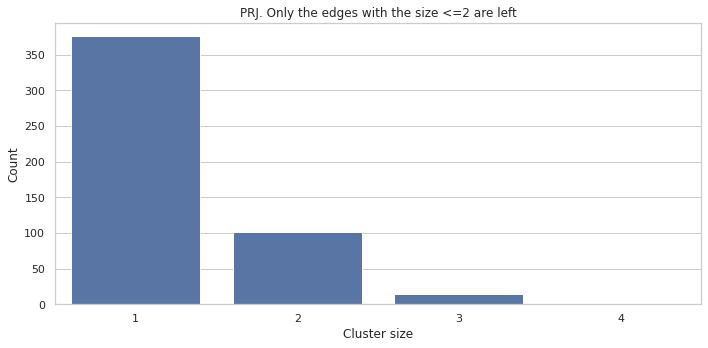

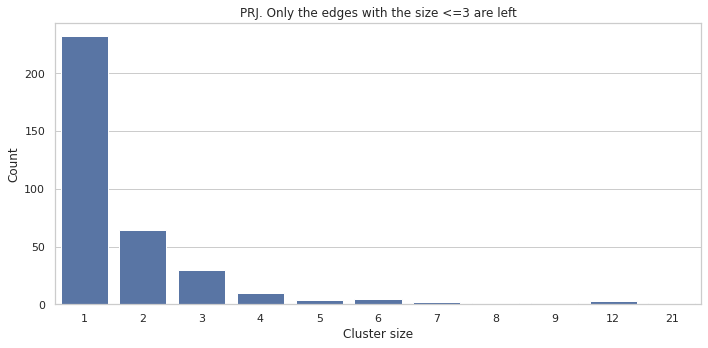

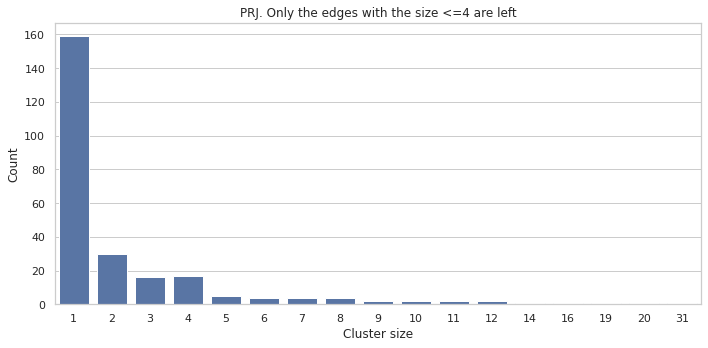

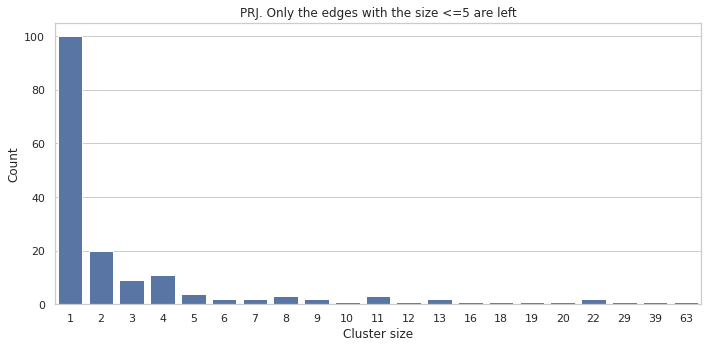

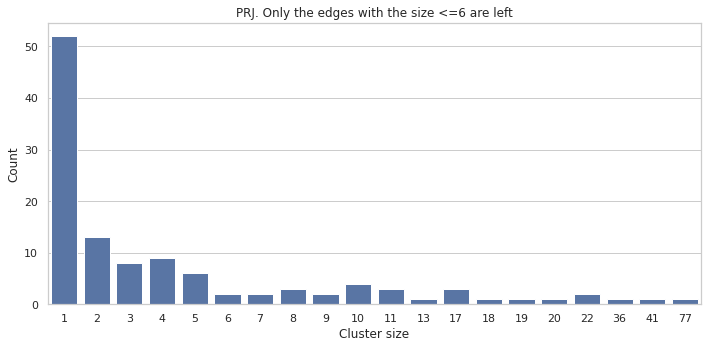

...

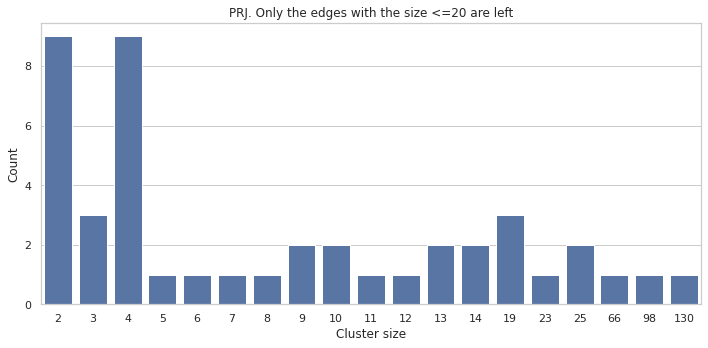

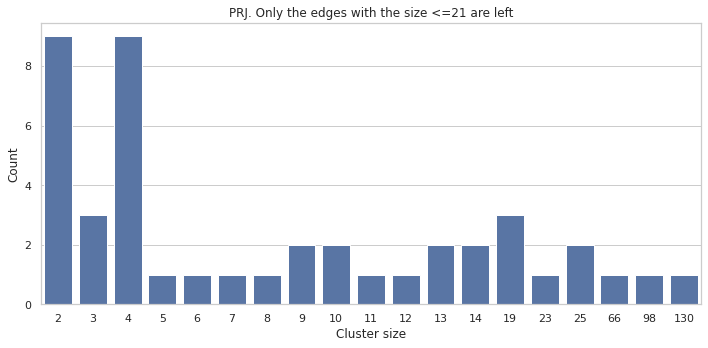

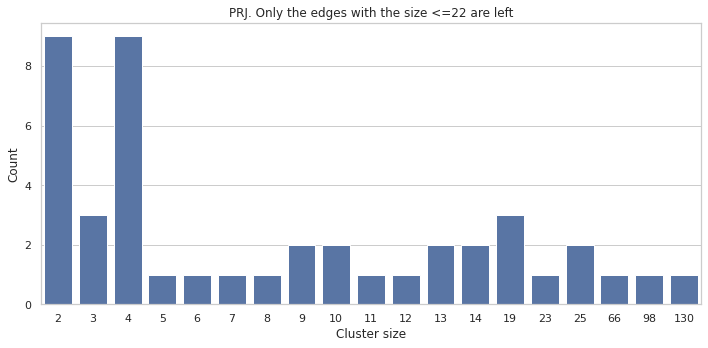

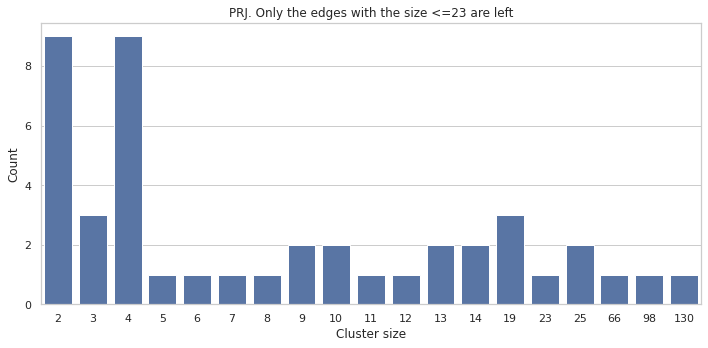

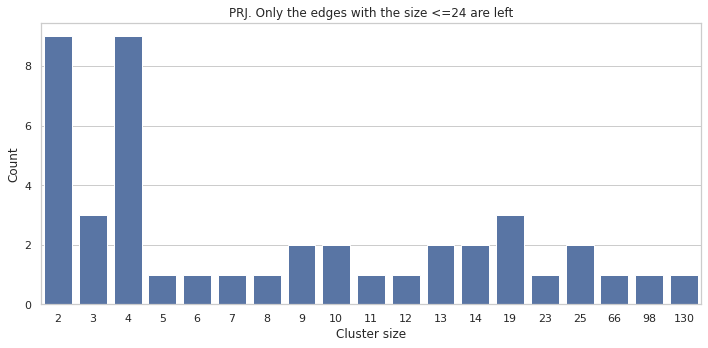

In [ ]:
sns.set_style("whitegrid")
# sns.set_style("ticks")
prev_sz, prev_distr = None, None
for sz, clust_distr in zip(sz_ndc_big, cluster_distr):
    if sz == prev_sz and clust_dist == prev_distr:
        continue
    prev_sz = sz
    prev_distr = clust_dist
    clust_dist_unic, clust_dist_cnt = np.unique(clust_distr, return_counts=True)
    plt.figure(figsize=(10, 5))

    plt.title('PRJ. Only the edges with the size <=' + str(sz) + " are left")
    sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

    #plt.xticks(np.arange(0, 130, 5))
    #plt.yticks([0, 1, 2])

    #plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
    #plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
    #sns.histplot(cluster_distr[1], bins=30)
    #plt.xticks(np.arange(0, 30, 1))

    #plt.xticks(clust_distr)
    plt.ylabel('Count')

    plt.xlabel('Cluster size')
    plt.tight_layout()

Другая формула

In [ ]:
projection_labelss_ndc_big = get_step_by_step_clusterisation_proj(NDC_big, lambda e, i, j: e.weight / (len(e)**2))
cluster_distr = get_cluster_sz_distribution(projection_labelss_ndc_big)

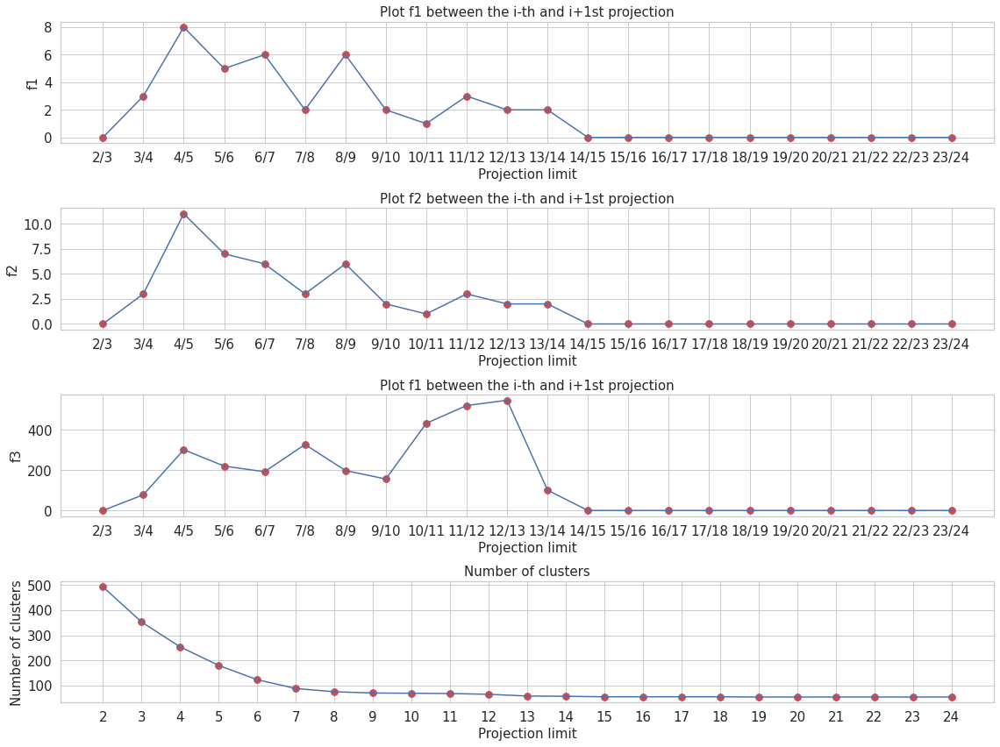

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs(projection_labelss_ndc_big, sz_ndc_big, figsize=(16, 12))

In [ ]:
clust_dist_unic, clust_dist_cnt = np.unique(clust_distr, return_counts=True)

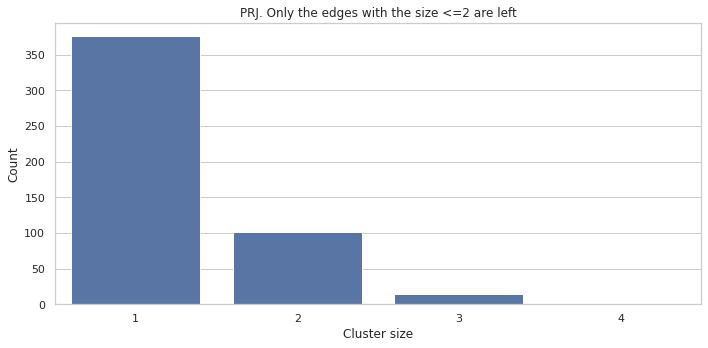

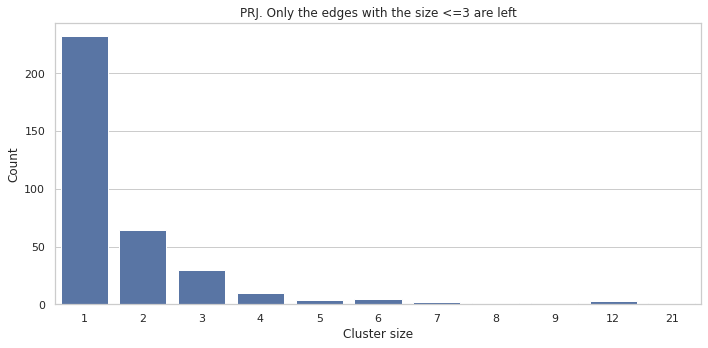

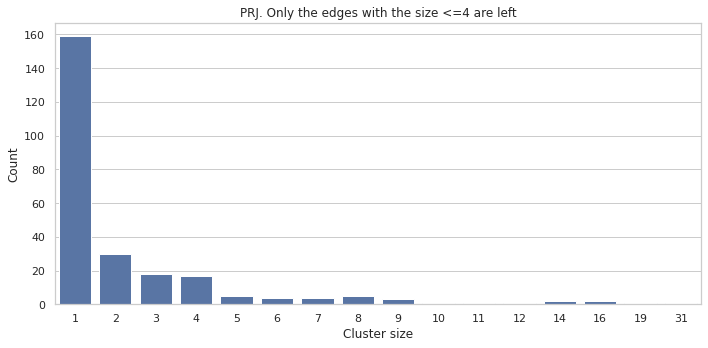

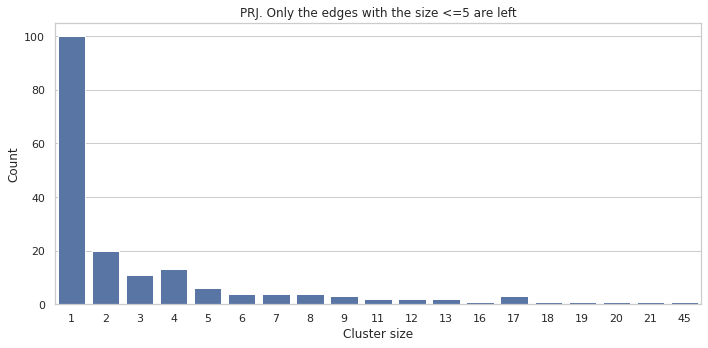

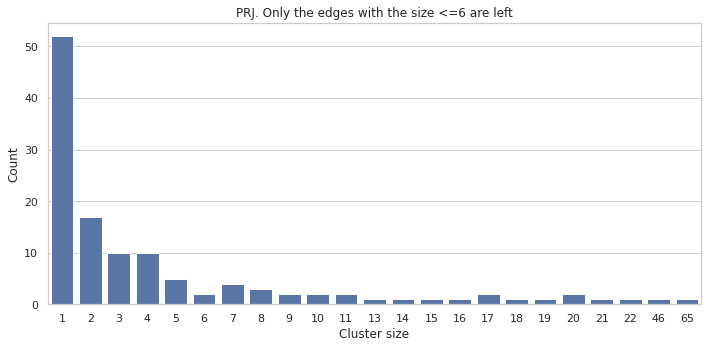

...

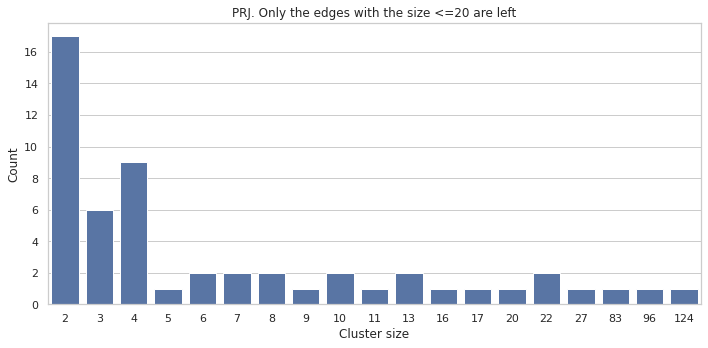

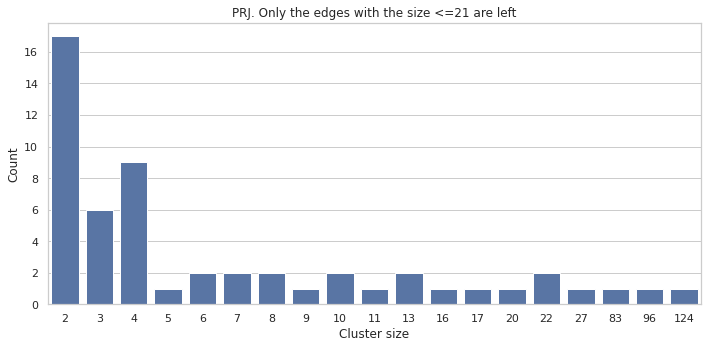

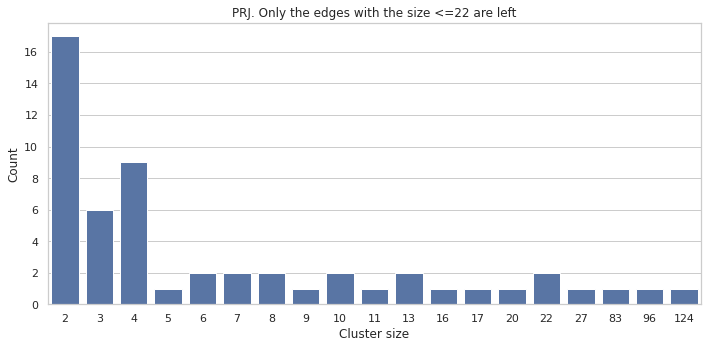

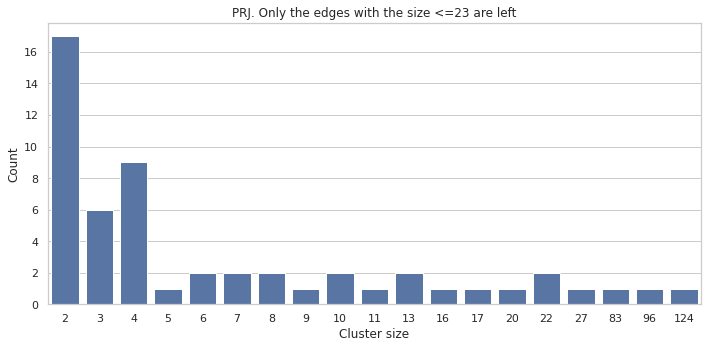

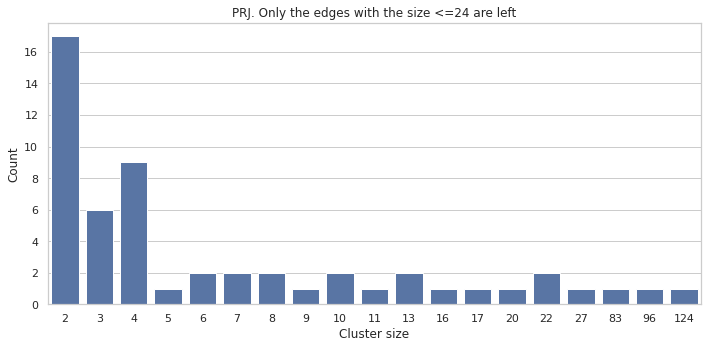

In [ ]:
sns.set_style("whitegrid")
# sns.set_style("ticks")
prev_sz, prev_distr = None, None
for sz, clust_distr in zip(sz_ndc_big, cluster_distr):
    if sz == prev_sz and clust_dist == prev_distr:
        continue
    prev_sz = sz
    prev_distr = clust_dist
    clust_dist_unic, clust_dist_cnt = np.unique(clust_distr, return_counts=True)
    plt.figure(figsize=(10, 5))

    plt.title('PRJ. Only the edges with the size <=' + str(sz) + " are left")
    sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

    #plt.xticks(np.arange(0, 130, 5))
    #plt.yticks([0, 1, 2])

    #plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
    #plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
    #sns.histplot(cluster_distr[1], bins=30)
    #plt.xticks(np.arange(0, 30, 1))

    #plt.xticks(clust_distr)
    plt.ylabel('Count')

    plt.xlabel('Cluster size')
    plt.tight_layout()

##### Кластеризуем проекциями. Перебираем несколько alpha, смотрим на результат

In [ ]:
alphas = np.linspace(0, 3, 30)

In [ ]:
projs = []
clust_dists = []

In [ ]:
for alpha in tqdm_notebook(alphas):
    projection_labelss_ndc_big = get_step_by_step_clusterisation_proj(NDC_big, lambda e, i, j: e.weight / (len(e) ** alpha))
    cluster_distr = get_cluster_sz_distribution(projection_labelss_ndc_big)


    #mod_s.append(get_simple_modularity(NDC_big, ))
    projs.append(projection_labelss_ndc_big)
    clust_dists.append(cluster_distr)

In [ ]:
mod_s = []

In [ ]:
for cd in tqdm_notebook(projs):
    z = list(cd[-1])
    mod_s.append(get_simple_modularity(NDC_big, z))

In [ ]:
alphas = np.linspace(0, 3, 50)
mod_s = []
n_clusters = []
cluster_sizes = []

In [ ]:
for alpha in tqdm_notebook(alphas):
    H_proj = remain_k(NDC_big, 10000000)
    G_proj, adj, z = get_projection_adj_z(H_proj, lambda e, i, j: e.weight / (len(e) ** alpha))
    mod_s.append(get_simple_modularity(NDC_big, z))  
    n_clusters.append(np.unique(z).shape[0])
    cluster_sizes.append(get_cluster_sz_distribution([z])[0]);

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """Entry point for launching an IPython kernel.


  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
cluster_sizes = np.array(cluster_sizes)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


In [ ]:
cluster_sizes.shape

(50,)

In [ ]:
mean_sz = [sum(x) / x.shape[0] for x in cluster_sizes]
max_sz = [max(x) for x in cluster_sizes]
min_sz = [min(x) for x in cluster_sizes]

Text(0, 0.5, 'cluster sz')

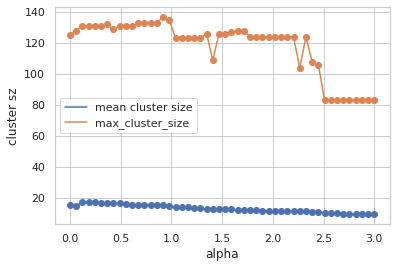

In [ ]:
plt.plot(alphas, mean_sz, label='mean cluster size')
plt.plot(alphas, max_sz, label='max_cluster_size')

plt.scatter(alphas, mean_sz)
plt.scatter(alphas, max_sz)
plt.legend()
plt.xlabel('alpha')
plt.ylabel('cluster sz')

In [ ]:
n_bigger_10 = [(x > 5).sum() for x in cluster_sizes]

Text(0, 0.5, 'n_clusters')

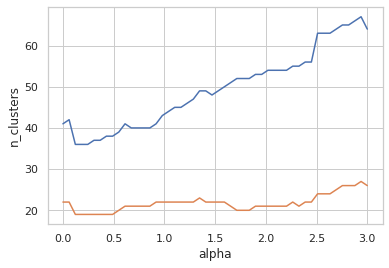

In [ ]:
plt.plot(alphas, n_clusters)
#plt.scatter(alphas, n_clusters)

plt.plot(alphas, n_bigger_10)
#plt.scatter(alphas, n_bigger_10)


plt.xlabel('alpha')
plt.ylabel('n_clusters')

Text(0, 0.5, 'modularity')

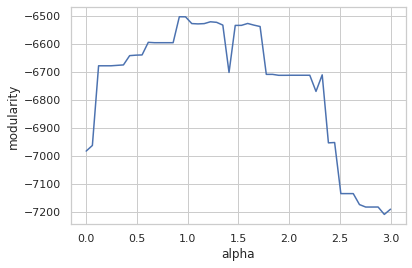

In [ ]:
plt.plot(alphas, mod_s)
plt.xlabel('alpha')
plt.ylabel('modularity')

In [ ]:
projection_labelss_ndc_big = get_step_by_step_clusterisation_proj(NDC_big, lambda e, i, j: e.weight / len(e))
cluster_distr = get_cluster_sz_distribution(projection_labelss_ndc_big)

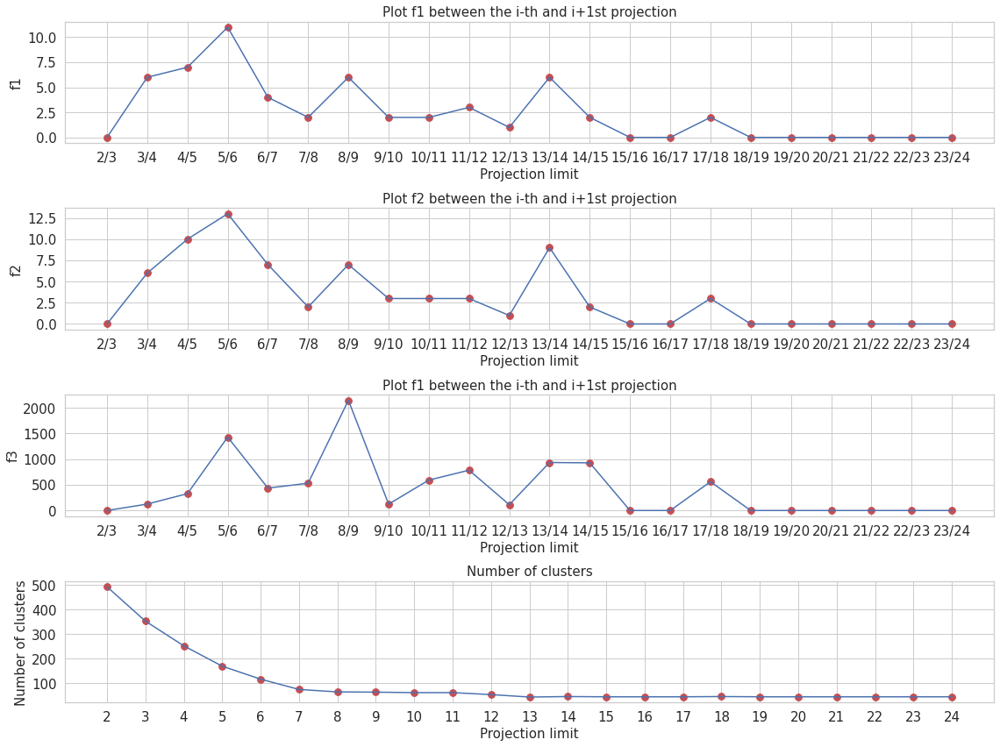

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs(projection_labelss_ndc_big, sz_ndc_big, figsize=(16, 12))

### Граф house_committess

In [ ]:
H_house, labels_house = get_house_committees_hypergraph()

##### Надо переопределить эти функции, чтобы кластеризация была успешной(совпадала с реальной).

In [ ]:
def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - парамет
        ры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * 4)
    return β, γ


def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * 4) # А здесь не m_k_collapsed?????
    return β, γ

def Q_for_all_ar_nothing_faster(H: Hypergraph, z, Ω, d, graph_volume, k, label_volumes, m_ks):
    '''
        k - максимальный размер гиперребра
        d - степени вершин
        label_volumes - объемы лейблов, соответствующие текущей кластеризации
    '''
    unique_labels = list(np.unique(z))

    β = 1
    ans = 0.0
    # k = 0 # k - vаксимальный размер гиперребра гиперграфа H
    # for edge in H.hyperedges:
    #    k = max(k, edge.vertexes.shape[0])

    # print('k = ', k)
    # graph_volume = vol_of_graph(H)

    # d[vertex] - cуммарный вес ребер, накрывающий вершину vertex
    # label_volumes = get_all_volumes(H, z, d)
    cut_ks = get_all_cut_ks(H, z, k, m_ks) # !!! Это очень долго!!!
    # print('Start')

    for i in range(1, k + 1):
        # print('i = ', i)
        γ = m_ks[i] / (graph_volume ** i) * 4
        sum_vol = 0
        for label in unique_labels: # квадратичная скорость
            sum_vol += γ * (label_volumes[label] ** i)
        ans -= β * (cut_ks[i] + sum_vol)
    return ans

##### А эти не надо

In [ ]:
H_house, labels_house = get_house_committees_hypergraph()

In [ ]:
z = get_hard_clusterisation(H_house)

##### Для проекций

In [ ]:
projection_labelss_house = get_step_by_step_clusterisation_proj(H_house, lambda e, i, j: e.weight / len(e))
cluster_distr = get_cluster_sz_distribution(projection_labelss_house)

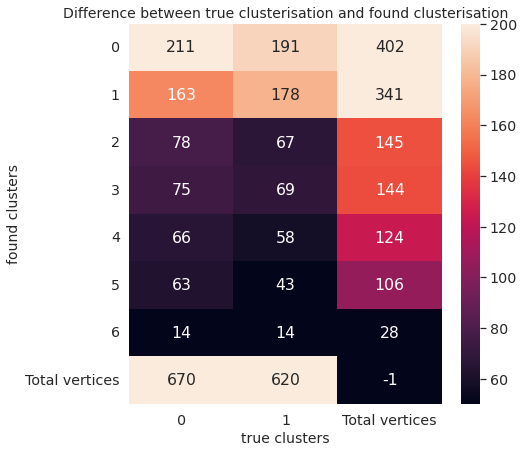

In [ ]:
visualize_cluster_formation_top_k_string(labels_house, projection_labelss_house[-1], figsize=(7, 7), k_prev=15, vmin=50, vmax=200)

In [ ]:
n_clusters = [np.unique(z_).shape[0] for z_ in projection_labelss_house]
n_clusters

In [ ]:
sz_house = get_unique_edge_sizes(H_house)
if sz_house[0] == 1:
    sz_house = sz_house[1:]

In [ ]:
sz_house

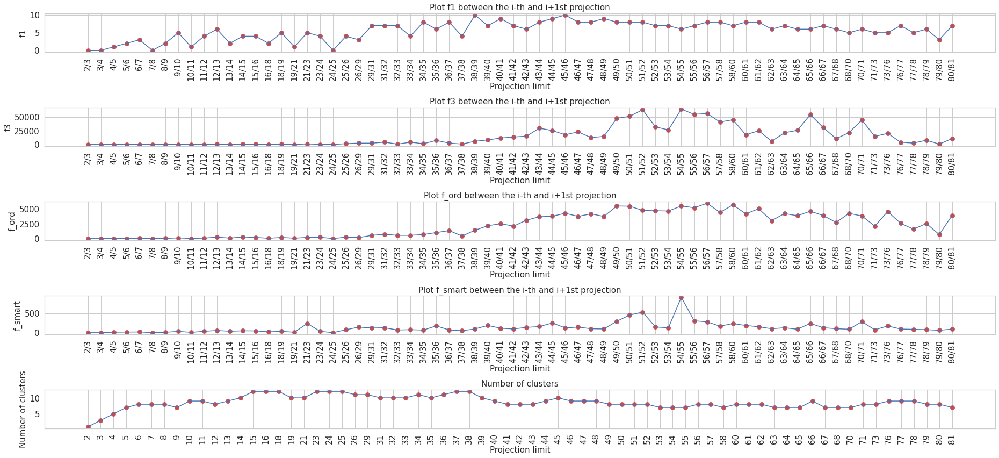

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs_all(projection_labelss_house, sz_house, figsize=(26, 12), min_v_in_clu=2)

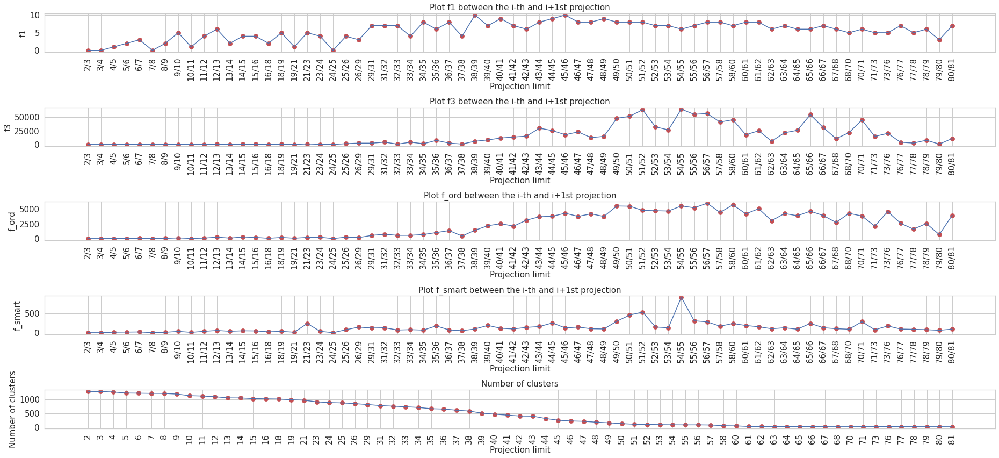

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs_all(projection_labelss_house, sz_house, figsize=(26, 12))

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

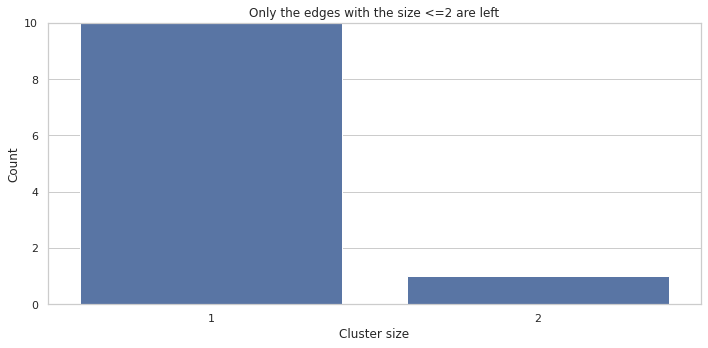

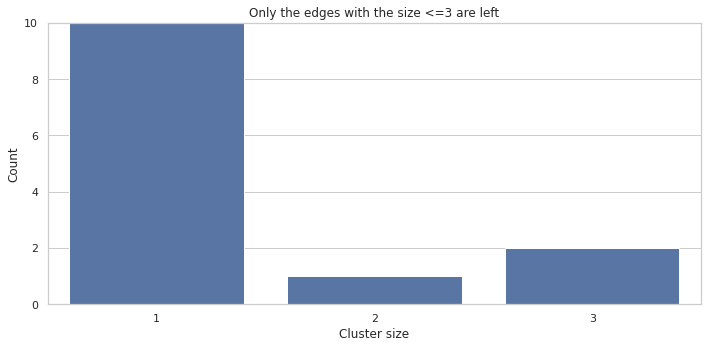

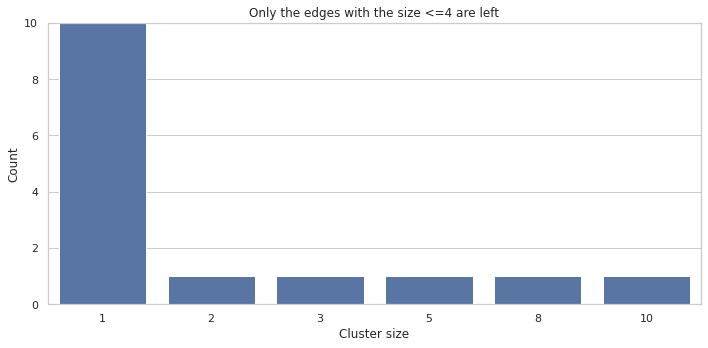

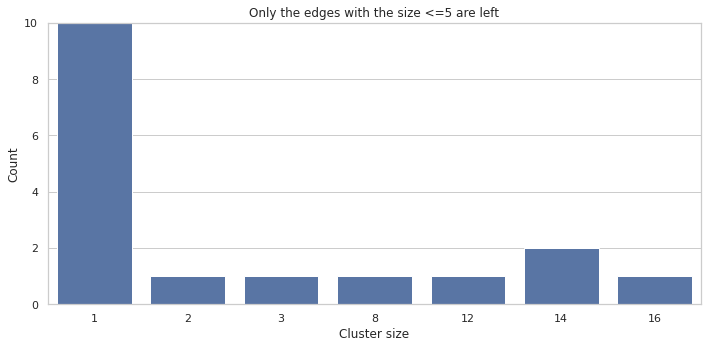

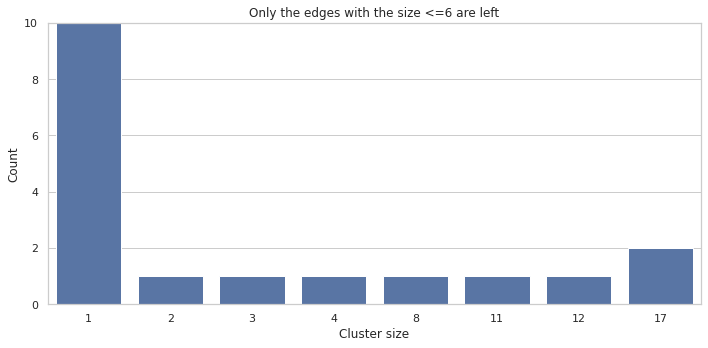

...

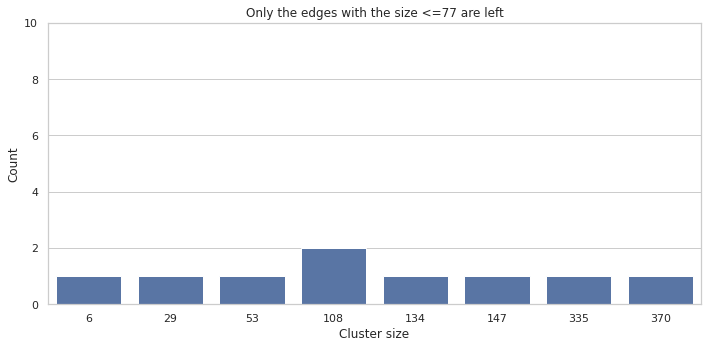

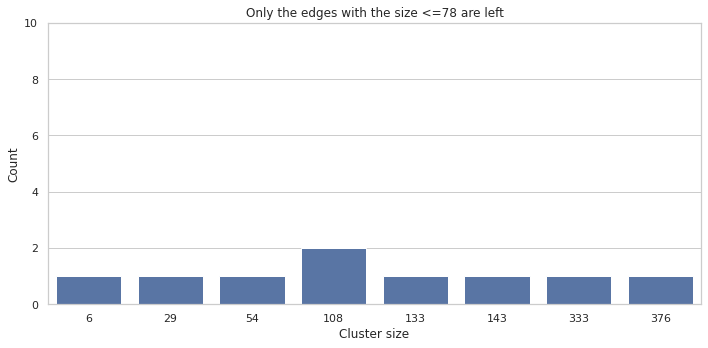

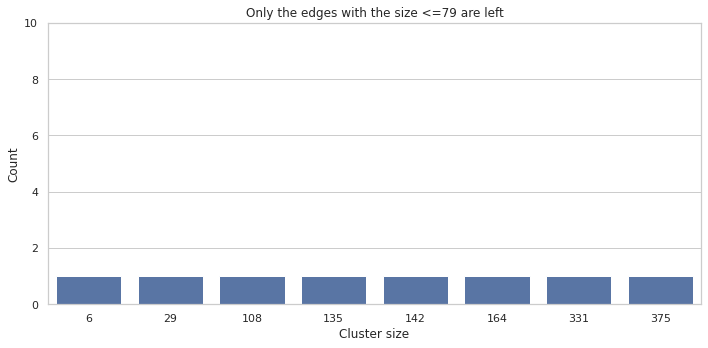

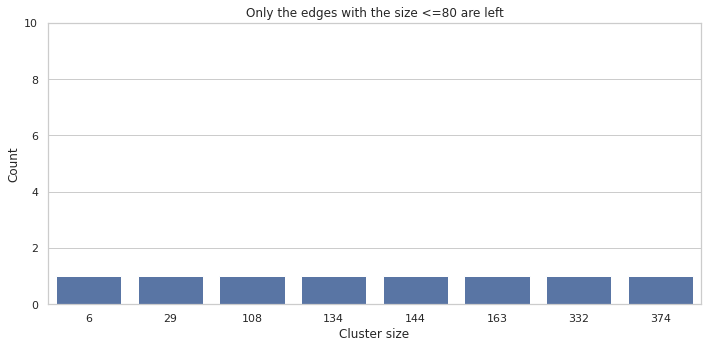

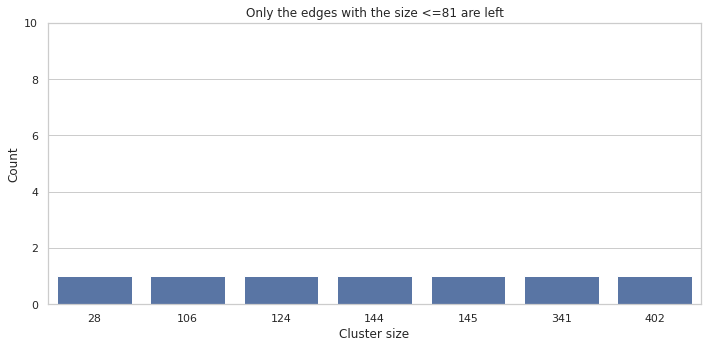

In [ ]:
sns.set_theme(style='whitegrid')

prev_sz, prev_distr = None, None
for sz, clust_dist in zip(sz_house, cluster_distr):
    if sz == prev_sz and clust_dist == prev_distr:
        continue
    prev_sz = sz
    prev_distr = clust_dist
    clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
    plt.figure(figsize=(10, 5))

    plt.title('Only the edges with the size <=' + str(sz) + " are left")
    sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

    #plt.xticks(np.arange(0, 130, 5))
    #plt.yticks([0, 1, 2])

    #plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
    #plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
    #sns.histplot(cluster_distr[1], bins=30)
    #plt.xticks(np.arange(0, 30, 1))

    #plt.xticks(clust_distr)
    plt.ylim([0, 10])
    plt.ylabel('Count')

    plt.xlabel('Cluster size')
    plt.tight_layout()

In [ ]:
alphas = np.linspace(0, 3, 50)
mod_s = []
n_clusters = []
cluster_sizes = []

In [ ]:
for alpha in tqdm_notebook(alphas):
    H_proj = remain_k(H_house, 10000000)
    G_proj, adj, z = get_projection_adj_z(H_proj, lambda e, i, j: e.weight / (len(e) ** alpha))
    mod_s.append(get_simple_modularity(H_house, z))  
    n_clusters.append(np.unique(z).shape[0])
    cluster_sizes.append(get_cluster_sz_distribution([z])[0]);

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """Entry point for launching an IPython kernel.


  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
cluster_sizes = np.array(cluster_sizes)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


In [ ]:
n_clusters = [np.unique(z_).shape[0] for z_ in cluster_sizes]
n_clusters

In [ ]:
cluster_sizes.shape

(50,)

In [ ]:
mean_sz = [sum(x) / x.shape[0] for x in cluster_sizes]
max_sz = [max(x) for x in cluster_sizes]
min_sz = [min(x) for x in cluster_sizes]

Text(0, 0.5, 'cluster sz')

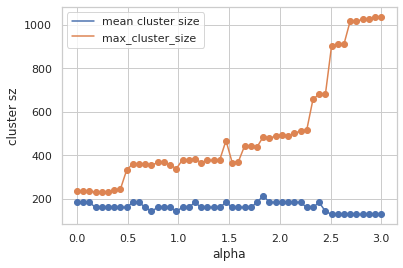

In [ ]:
plt.plot(alphas, mean_sz, label='mean cluster size')
plt.plot(alphas, max_sz, label='max_cluster_size')

plt.scatter(alphas, mean_sz)
plt.scatter(alphas, max_sz)
plt.legend()
plt.xlabel('alpha')
plt.ylabel('cluster sz')

In [ ]:
n_bigger_10 = [(x > 5).sum() for x in cluster_sizes]

Text(0, 0.5, 'n_clusters')

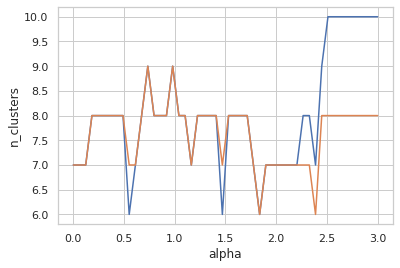

In [ ]:
plt.plot(alphas, n_clusters)
#plt.scatter(alphas, n_clusters)

plt.plot(alphas, n_bigger_10)
#plt.scatter(alphas, n_bigger_10)


plt.xlabel('alpha')
plt.ylabel('n_clusters')

Text(0, 0.5, 'modularity')

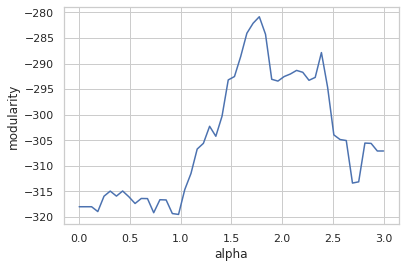

In [ ]:
plt.plot(alphas, mod_s)
plt.xlabel('alpha')
plt.ylabel('modularity')

##### Отразим формирование топ-10 кластеров

In [ ]:
def visualize_cluster_formation_top_k(z0, z1, k0, k1, figsize, k_prev=10, k_curr=None, vmin=0, vmax=20, percent=False):
    '''
        k - топ-k кластеров с предыдущего слоя на top-k (по размеру) следующего будут изображаться 
    '''
    if k_curr is None:
        k_curr = k_prev
    clusters_0 = get_clusters(z0)[:k_prev]
    clusters_1 = get_clusters(z1)[:k_curr]

    a = np.zeros(shape=(len(clusters_1), len(clusters_0)))

    for i, cluster1 in enumerate(clusters_1):
        for j, cluster0 in enumerate(clusters_0):
            a[i][j] = len(list(set(cluster1) & set(cluster0)))
    
    cluster_split = pd.DataFrame(a)
    # cluster_split['Total vertices'] = cluster_split.sum(axis=1)
    cluster_split['Total vertices'] = [len(clus) for clus in clusters_1]
    # cluster_split.loc['Total vertices'] = cluster_split.sum(axis=0)

    lst =  [len(clus) for clus in clusters_0]

    # if not percent:
    lst.append(-1)
    cluster_split.loc['Total vertices'] = lst

    plt.figure(figsize=figsize)
    plt.title(f"Intersection sizes of projection clusters <={k0} and <={k1}", fontsize=14)
    sns.set(font_scale=1.3)
    if percent:
        sns.heatmap(cluster_split / cluster_split.loc['Total vertices'], annot=True, fmt='.2f', vmin=0, vmax=1)
    else:
        sns.heatmap(cluster_split, annot=True, vmin=vmin, vmax=vmax, fmt='g')
    plt.xlabel(f'Projection clusters <= {k0}', fontsize=14)
    plt.ylabel(f'Projection clusters <= {k1}', fontsize=14)

In [ ]:
sz_house.index(9)

7

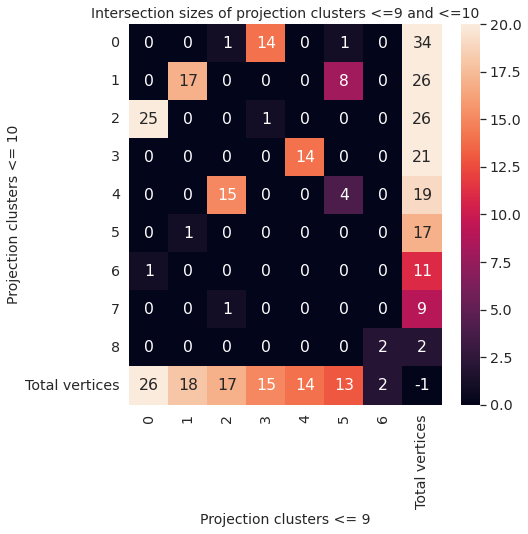

In [ ]:
i0 = 7
i1 = 8

visualize_cluster_formation_top_k(projection_labelss_house[i0], projection_labelss_house[i1], sz_house[i0], sz_house[i1], figsize=(7, 7), k_prev=7, k_curr=9)

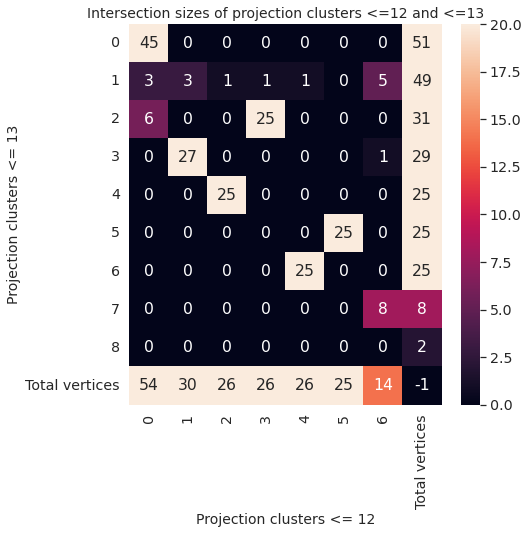

In [ ]:
i0 = 10
i1 = 11

visualize_cluster_formation_top_k(projection_labelss_house[i0], projection_labelss_house[i1], sz_house[i0], sz_house[i1], figsize=(7, 7), k_prev=7, k_curr=9)

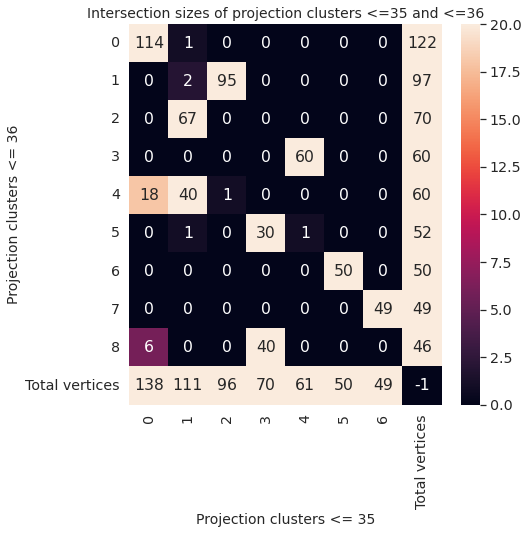

In [ ]:
i0 = 27
i1 = 28

visualize_cluster_formation_top_k(projection_labelss_house[i0], projection_labelss_house[i1], sz_house[i0], sz_house[i1], figsize=(7, 7), k_prev=7, k_curr=9)

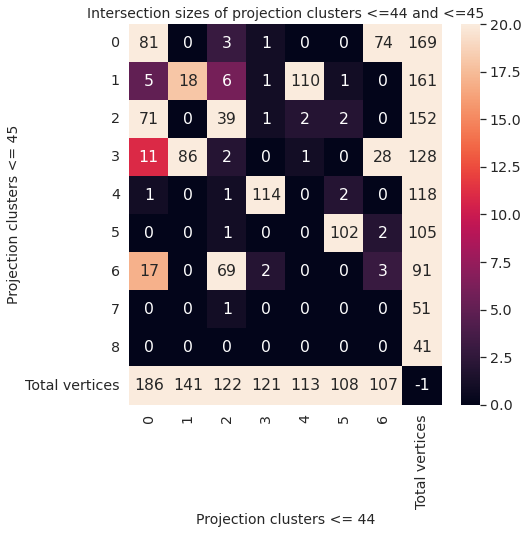

In [ ]:
i0 = 36
i1 = 37

visualize_cluster_formation_top_k(projection_labelss_house[i0], projection_labelss_house[i1], sz_house[i0], sz_house[i1], figsize=(7, 7), k_prev=7, k_curr=9)

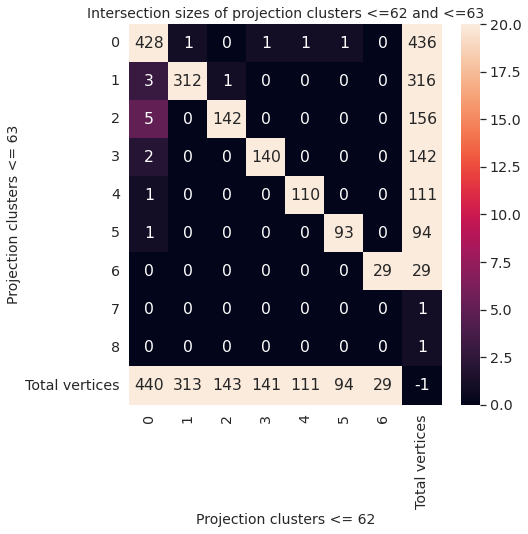

In [ ]:
i0 = 53
i1 = 54

visualize_cluster_formation_top_k(projection_labelss_house[i0], projection_labelss_house[i1], sz_house[i0], sz_house[i1], figsize=(7, 7), k_prev=7, k_curr=9)

In [ ]:
sz_house.index(70)

60

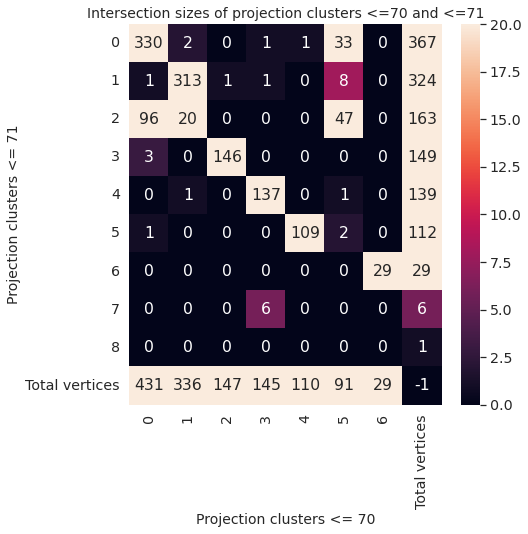

In [ ]:
i0 = 60
i1 = 61

visualize_cluster_formation_top_k(projection_labelss_house[i0], projection_labelss_house[i1], sz_house[i0], sz_house[i1], figsize=(7, 7), k_prev=7, k_curr=9)

### Граф senate_committess

In [ ]:
H_senate, labels_senate = get_senate_committees_hypergraph()

##### Надо переопределить эти функции, чтобы кластеризация была успешной(совпадала с реальной).

In [ ]:
def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - парамет
        ры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * 4)
    return β, γ


def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * 4) # А здесь не m_k_collapsed?????
    return β, γ

def Q_for_all_ar_nothing_faster(H: Hypergraph, z, Ω, d, graph_volume, k, label_volumes, m_ks):
    '''
        k - максимальный размер гиперребра
        d - степени вершин
        label_volumes - объемы лейблов, соответствующие текущей кластеризации
    '''
    unique_labels = list(np.unique(z))

    β = 1
    ans = 0.0
    # k = 0 # k - vаксимальный размер гиперребра гиперграфа H
    # for edge in H.hyperedges:
    #    k = max(k, edge.vertexes.shape[0])

    # print('k = ', k)
    # graph_volume = vol_of_graph(H)

    # d[vertex] - cуммарный вес ребер, накрывающий вершину vertex
    # label_volumes = get_all_volumes(H, z, d)
    cut_ks = get_all_cut_ks(H, z, k, m_ks) # !!! Это очень долго!!!
    # print('Start')

    for i in range(1, k + 1):
        # print('i = ', i)
        γ = m_ks[i] / (graph_volume ** i) * 4
        sum_vol = 0
        for label in unique_labels: # квадратичная скорость
            sum_vol += γ * (label_volumes[label] ** i)
        ans -= β * (cut_ks[i] + sum_vol)
    return ans

##### А эти не надо

In [ ]:
H_senate, labels_senate = get_senate_committees_hypergraph()

##### Для проекций

In [ ]:
projection_labelss_senate = get_step_by_step_clusterisation_proj(H_senate, lambda e, i, j: e.weight / len(e))
cluster_distr = get_cluster_sz_distribution(projection_labelss_senate)

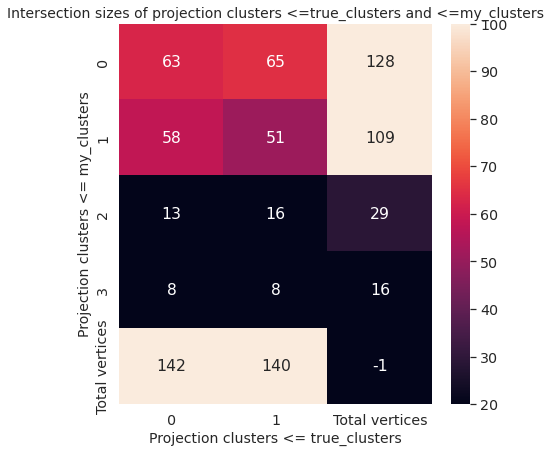

In [ ]:
visualize_cluster_formation_top_k(labels_senate, projection_labelss_senate[-1], "true_clusters", "my_clusters", figsize=(7, 7), k_prev=15, vmin=20, vmax=100)

In [ ]:
n_clusters = [np.unique(z_).shape[0] for z_ in projection_labelss_senate]
n_clusters

In [ ]:
sz_senate = get_unique_edge_sizes(H_senate)
if sz_senate[0] == 1:
    sz_senate = sz_senate[1:]

In [ ]:
sz_senate

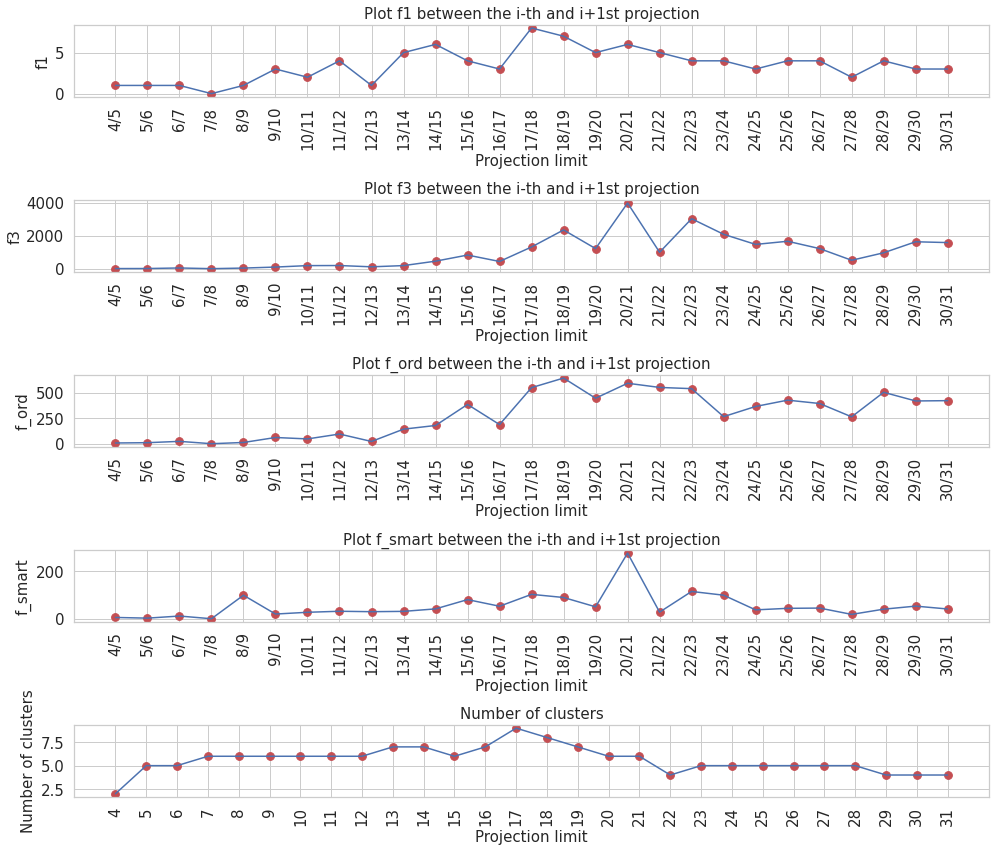

In [ ]:
sns.set_theme(style='whitegrid')
plot_horizontal_diffs_all(projection_labelss_senate, sz_senate, figsize=(14, 12), min_v_in_clu=2)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

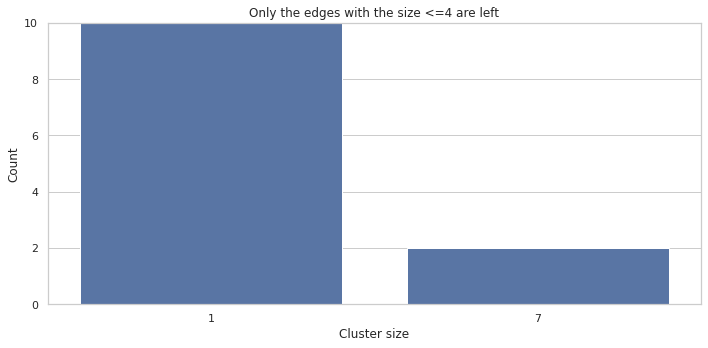

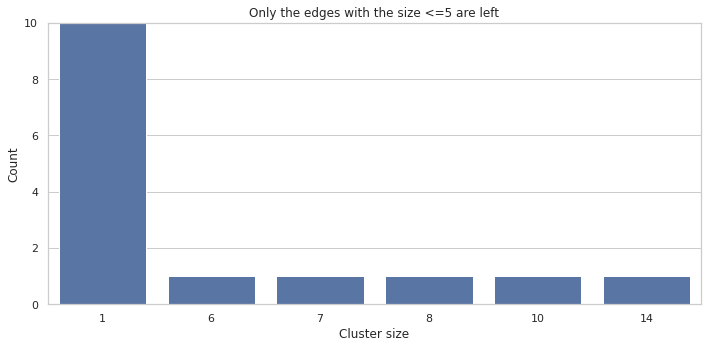

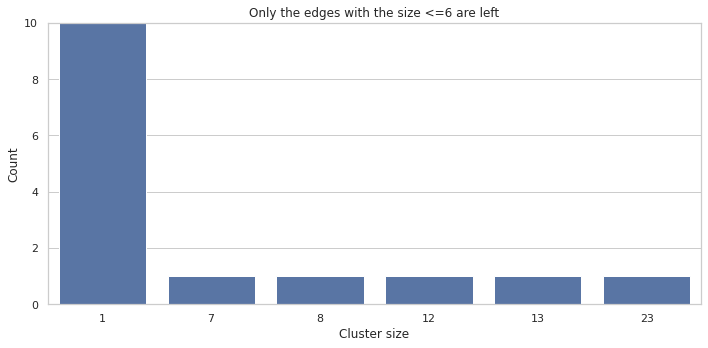

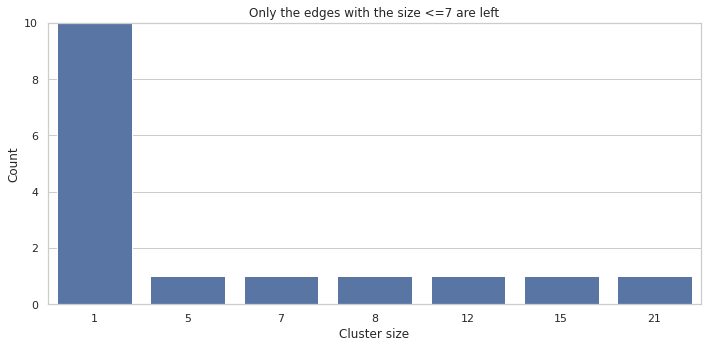

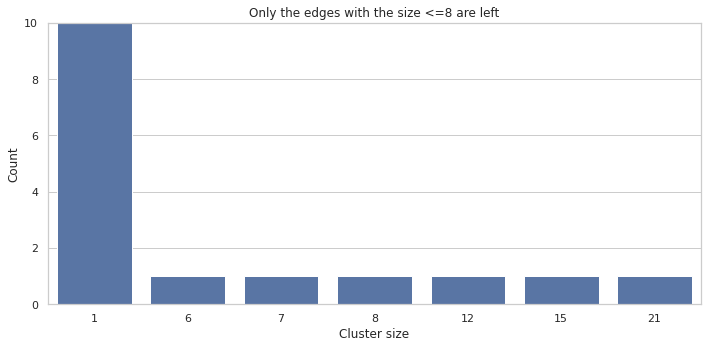

...

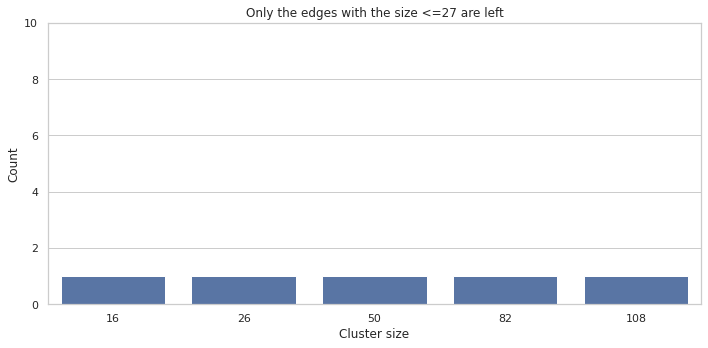

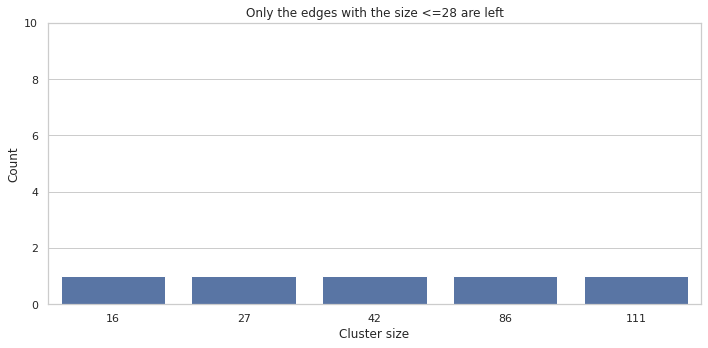

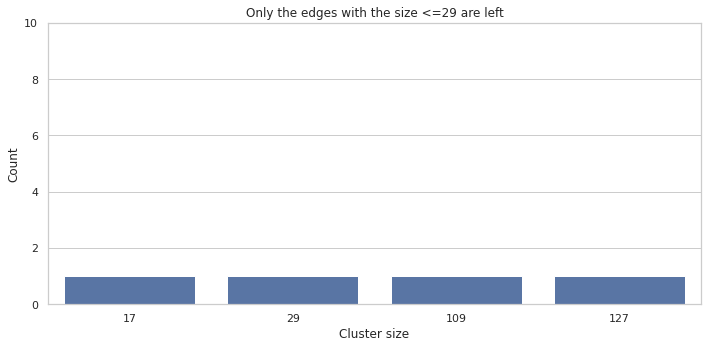

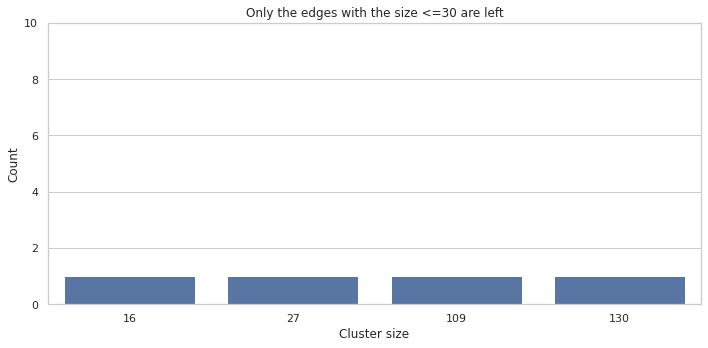

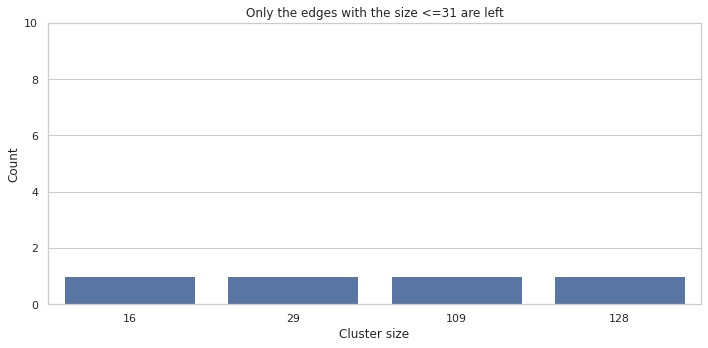

In [ ]:
sns.set_theme(style='whitegrid')

prev_sz, prev_distr = None, None
for sz, clust_dist in zip(sz_senate, cluster_distr):
    if sz == prev_sz and clust_dist == prev_distr:
        continue
    prev_sz = sz
    prev_distr = clust_dist
    clust_dist_unic, clust_dist_cnt = np.unique(clust_dist, return_counts=True)
    plt.figure(figsize=(10, 5))

    plt.title('Only the edges with the size <=' + str(sz) + " are left")
    sns.barplot(clust_dist_unic, clust_dist_cnt, color='b')

    #plt.xticks(np.arange(0, 130, 5))
    #plt.yticks([0, 1, 2])

    #plt.subplot(2, 1, 2, sharex=ax, sharey=ax)
    #plt.title('PRJ. Only the edges with the size <=(3, 4, 5) are left')
    #sns.histplot(cluster_distr[1], bins=30)
    #plt.xticks(np.arange(0, 30, 1))

    #plt.xticks(clust_distr)
    plt.ylim([0, 10])
    plt.ylabel('Count')

    plt.xlabel('Cluster size')
    plt.tight_layout()

In [ ]:
sz_senate.index(8)

4

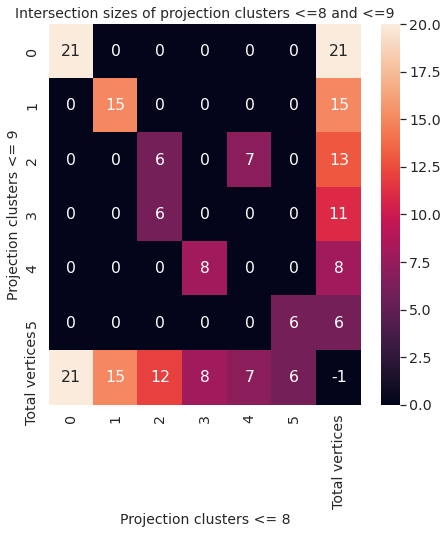

In [ ]:
i0 = 4
i1 = 5

visualize_cluster_formation_top_k(projection_labelss_senate[i0], projection_labelss_senate[i1], sz_senate[i0], sz_senate[i1], figsize=(7, 7), k_prev=6)

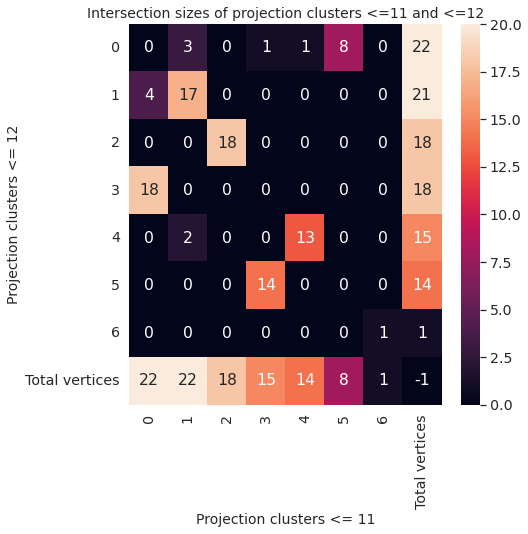

In [ ]:
i0 = sz_senate.index(11)
i1 = i0 + 1

visualize_cluster_formation_top_k(projection_labelss_senate[i0], projection_labelss_senate[i1], sz_senate[i0], sz_senate[i1], figsize=(7, 7), k_prev=7)

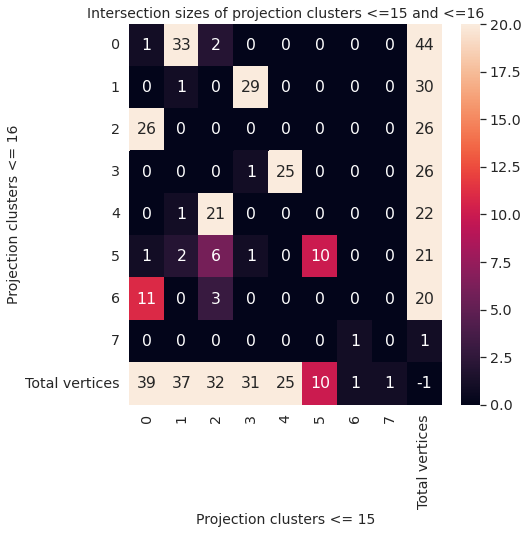

In [ ]:
i0 = sz_senate.index(15)
i1 = i0 + 1

visualize_cluster_formation_top_k(projection_labelss_senate[i0], projection_labelss_senate[i1], sz_senate[i0], sz_senate[i1], figsize=(7, 7), k_prev=8)

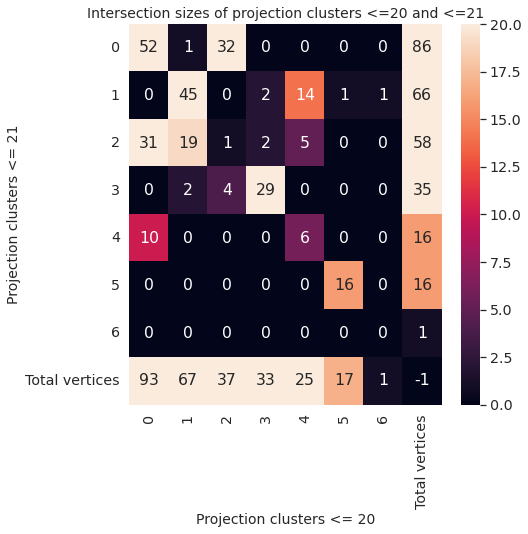

In [ ]:
i0 = sz_senate.index(20)
i1 = i0 + 1

visualize_cluster_formation_top_k(projection_labelss_senate[i0], projection_labelss_senate[i1], sz_senate[i0], sz_senate[i1], figsize=(7, 7), k_prev=7)

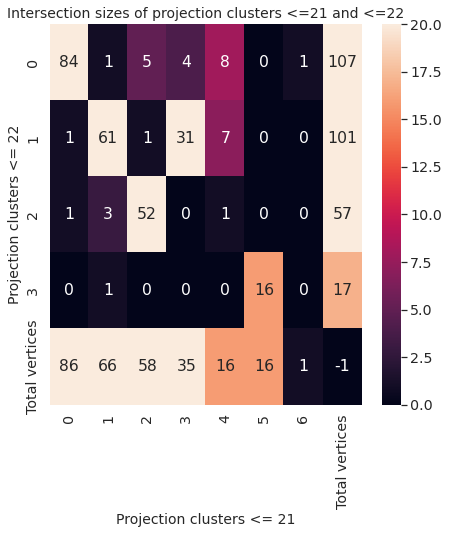

In [ ]:
i0 = sz_senate.index(21)
i1 = i0 + 1

visualize_cluster_formation_top_k(projection_labelss_senate[i0], projection_labelss_senate[i1], sz_senate[i0], sz_senate[i1], figsize=(7, 7), k_prev=7)

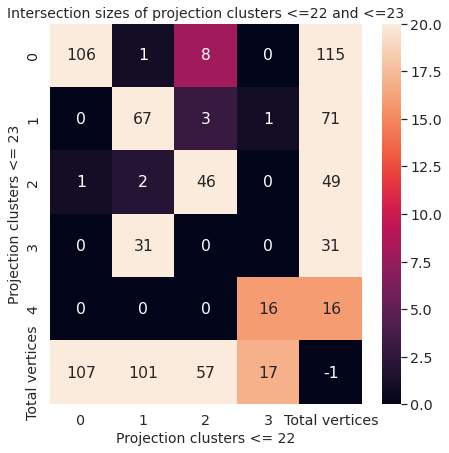

In [ ]:
i0 = sz_senate.index(22)
i1 = i0 + 1

visualize_cluster_formation_top_k(projection_labelss_senate[i0], projection_labelss_senate[i1], sz_senate[i0], sz_senate[i1], figsize=(7, 7), k_prev=7)

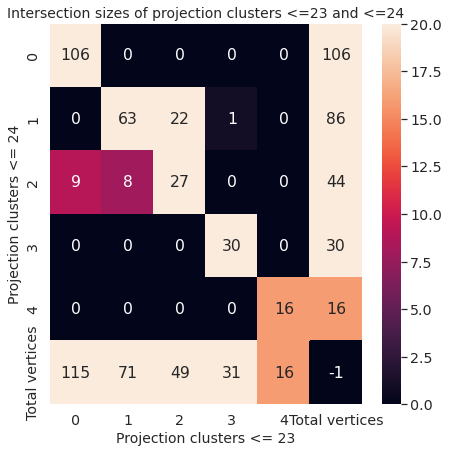

In [ ]:
i0 = sz_senate.index(23)
i1 = i0 + 1

visualize_cluster_formation_top_k(projection_labelss_senate[i0], projection_labelss_senate[i1], sz_senate[i0], sz_senate[i1], figsize=(7, 7), k_prev=7)

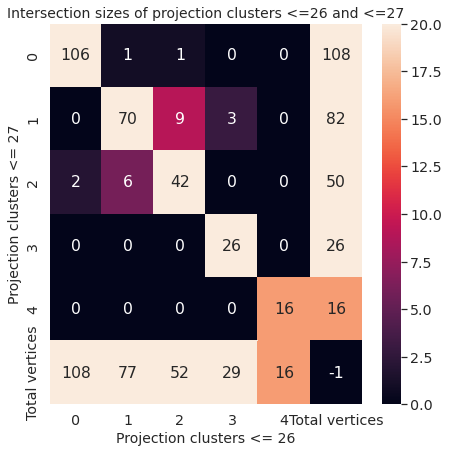

In [ ]:
i0 = sz_senate.index(26)
i1 = i0 + 1

visualize_cluster_formation_top_k(projection_labelss_senate[i0], projection_labelss_senate[i1], sz_senate[i0], sz_senate[i1], figsize=(7, 7), k_prev=7)

In [ ]:
i0 = sz_senate.index(20)
i1 = i0 + 1

visualize_cluster_formation_top_k(projection_labelss_senate[i0], projection_labelss_senate[i1], sz_senate[i0], sz_senate[i1], figsize=(7, 7), k_prev=7)

Подберу alpha, чтобы кластеризация была нормальной

In [ ]:
projection_labelss_senate = get_step_by_step_clusterisation_proj(H_senate, lambda e, i, j: e.weight / len(e))


In [ ]:
alphas = np.linspace(0, 5, 20)

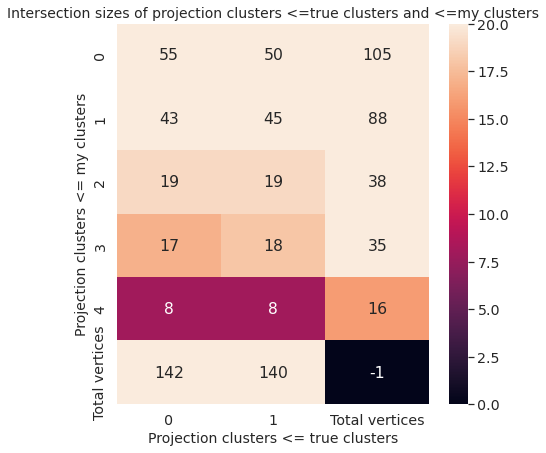

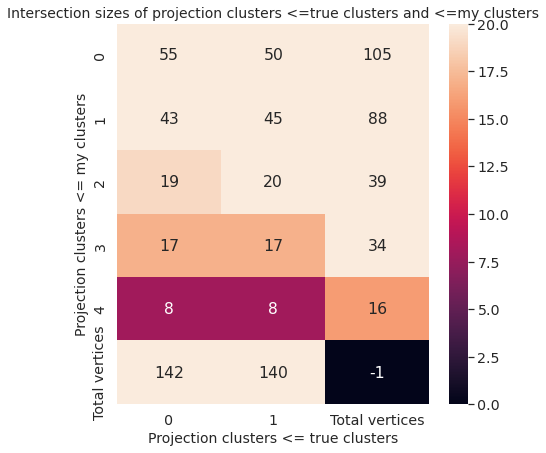

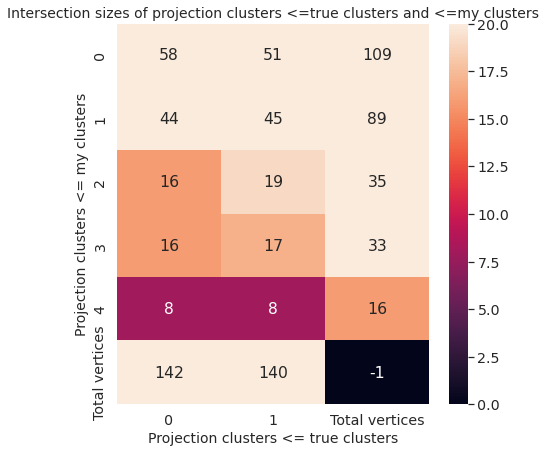

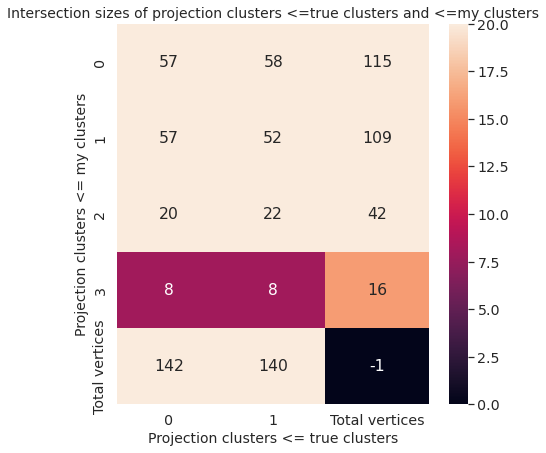

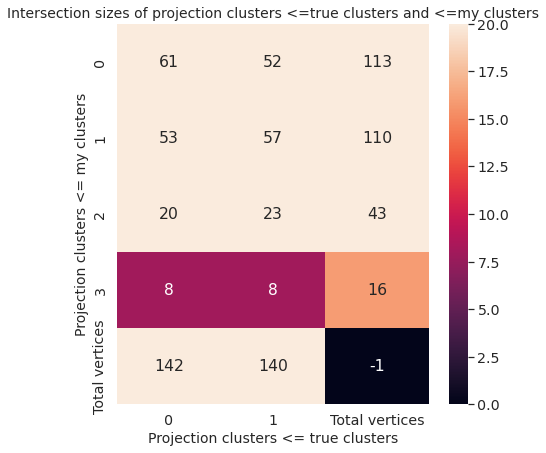

...

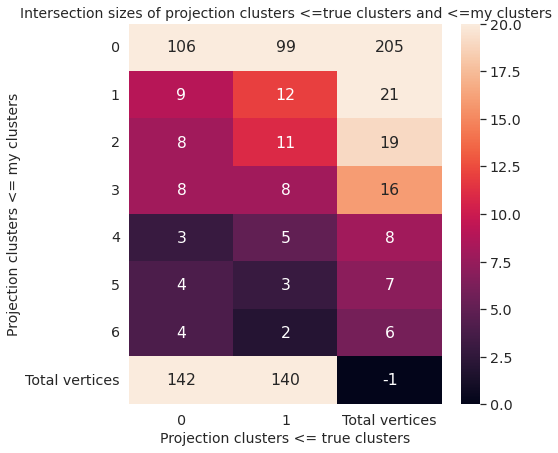

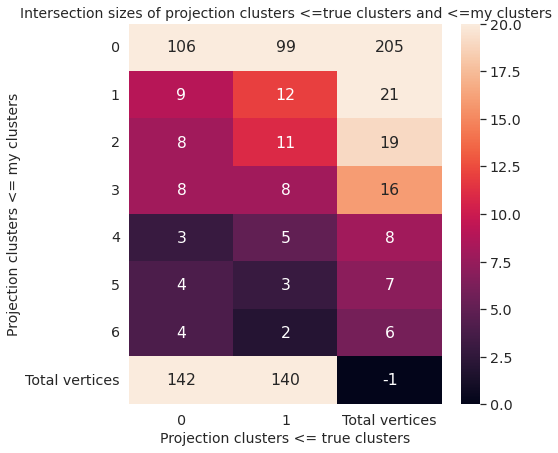

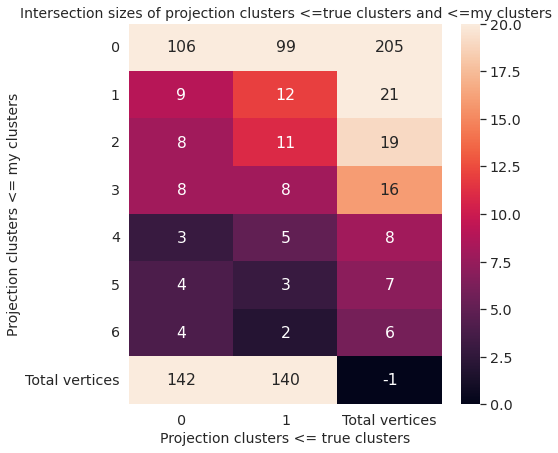

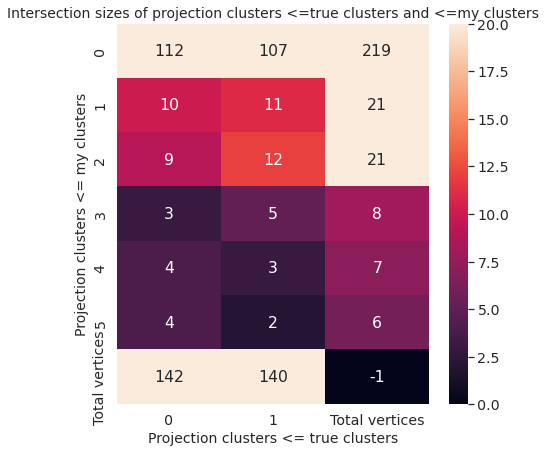

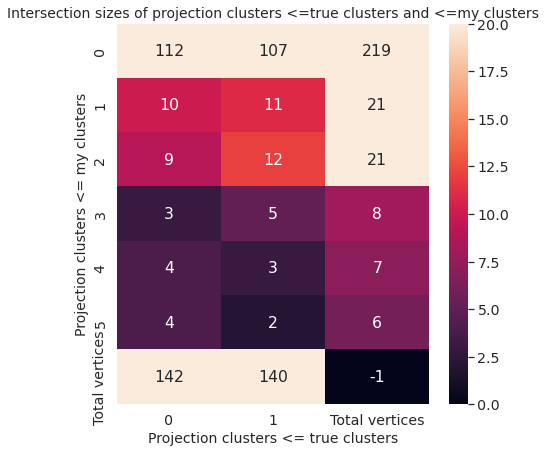

In [ ]:
for alpha in alphas:
    H_proj = remain_k(H_senate, 10000)
    G_proj, adj, z = get_projection_adj_z(H_proj, lambda e, i, j: e.weight / (len(e) ** alpha))

    visualize_cluster_formation_top_k(labels_senate, z, "true clusters", "my clusters", figsize=(7, 7), k_prev=15)

## Площадка будущих экспериментов.

### Будем подбирать весовую функцию так, чтобы максимизировать модулярность графа-проекции в Лувенском алгоритме.



#### Работаем со всем графом NDC (несколько компонент). Сейчас 2 вершины соединены ребром веса = количество гиперребер, в которых они обе содержутся.

**Модулярность:** -7349. Намного лучше, чем в случае с кластеризацией гиперграфа.

In [ ]:
H = get_NDC_classes_hypergraph()
G = get_projection_graph(H, lambda v1, v2, w: w)
conn_comp = sorted(list(nx.connected_components(G)), key=lambda x: -len(x))
comp_sz = [len(x) for x in conn_comp]
print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))

top-10 components:  [628, 60, 26, 18, 8, 8, 7, 7, 7, 6] 
number components:  183


In [ ]:
NDC_big = H.pruning(list(conn_comp[0]))

In [ ]:
adj_matrix = get_weighted_adjacency(G)
labels = get_louvain_labels(adj_matrix)
# visualize_sci_graph_clusterisation_with_weights(adj_matrix, labels)
print("modulrity: ", get_simple_modularity(H, labels))

modulrity:  -7349.195331443966


In [ ]:
G_ = get_projection_graph(H, lambda v1, v2, w: w)
adj_matrix_ = get_weighted_adjacency(G_)
labels_ = get_louvain_labels(adj_matrix_)
# visualize_sci_graph_clusterisation_with_weights(adj_matrix, labels)
print("modulrity: ", get_simple_modularity(H, labels_))

modulrity:  -7349.195331443966


In [ ]:
edge_weights = []

In [ ]:
for edge in H.hyperedges:
    edge_weights.append(edge.weight)

### Эксперимент на случайном гипреграфе. Замеры времени кластеризации и количества кластеров.

Код генерации слуайного гиперграфа. 

In [ ]:
def get_random_hyper(n, vertex_in_cluster):
    assert n % vertex_in_cluster == 0

    H = Hypergraph(number_of_vertexes=n)

    L = n // vertex_in_cluster # number of clusters
    m = 10 * n # number of hyperedges
    p = dict()
    p[2] = 0.6
    p[3] = 1 / (n ** 3)
    p[4] = 1 / (n ** 4)

    k_s = np.random.randint(low=2, high=5, size=(m,)) # hyperedge sizes

    # clusters: 0 ... 49, 50 ... 99, ..., (L - 1) * 50 ... L * 50 - 1: groupped by 200 vertices
    # cluster nunms from 1
    
    z_optim = [i // vertex_in_cluster + 1 for i in range(n)]

    for k in k_s:
        if np.random.uniform() <= p[k]:
            # plasing within one cluster
            cluster = np.random.randint(low=1, high=L + 1)
            edge = np.random.choice(a=range((cluster - 1) * vertex_in_cluster, cluster * vertex_in_cluster), replace=False, size=(k, ))
        else:
            edge = np.random.choice(a=range(n), replace=False, size=(k, ))
        
        assert np.unique(edge).shape[0] == k 
        H.add_hyperedge(edge)
    return H

In [ ]:
n_experimnts = np.array([50, 100, 150, 210, 260, 300, 360, 420, 440, 520])
n_vertex_in_cluster = np.array([10, 10, 15, 15, 20, 20, 30, 30, 40, 40])

In [ ]:
runtimes = []

estimated_n_clusters = []
best_n_clusters = []

estimated_clusterisation = []
best_clusterisation = []

estimated_modularity = []
best_modularity = []

In [ ]:
for n, vertex_in_cluster in tqdm_notebook(zip(n_experimnts, n_vertex_in_cluster)):
    H_random = get_random_hyper(n, vertex_in_cluster)
    T0 = time.time()
    z = get_hard_clusterisation(H_random)
    T1 = time.time()
    
    runtimes.append(T1 - T0)
    estimated_n_clusters.append(np.unique(z).shape[0])
    best_n_clusters.append(n / vertex_in_cluster)

    estimated_clusterisation.append(z)

    z_best = []
    for i in range(n):
        z_best.append(i // vertex_in_cluster + 1)

    best_clusterisation.append(z_best)

    estimated_modularity.append(get_simple_modularity(H_random, z))
    best_modularity.append(get_simple_modularity(H_random, z_best))

Text(0.5, 1.0, 'Зависимость времени кластеризации от вершин в гиперграфе.')

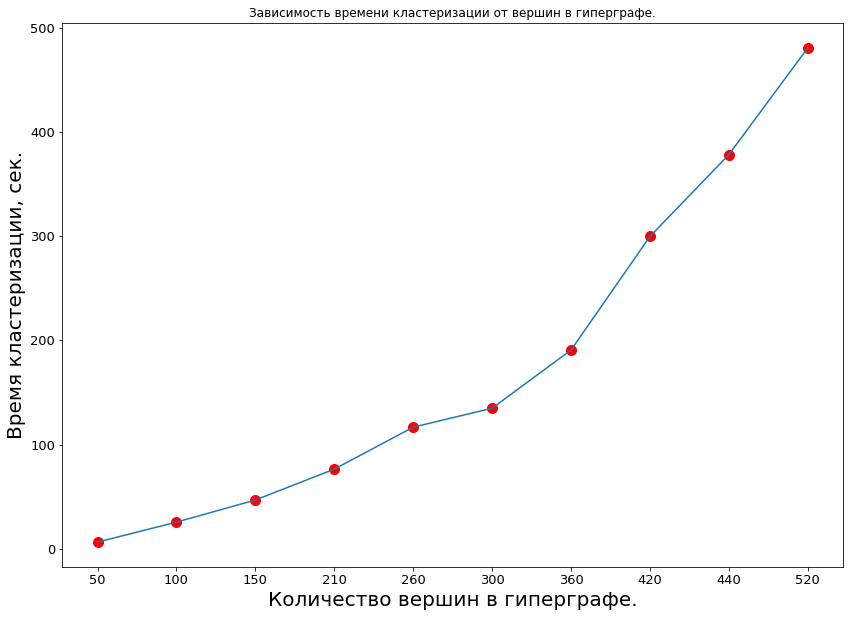

In [ ]:
plt.figure(figsize=(14, 10))
plt.plot(runtimes)
plt.scatter(range(len(n_experimnts)), y=runtimes, c='r', marker='o', s=100)
plt.xticks(range(len(n_experimnts)), n_experimnts, fontsize=13)
plt.xlabel("Количество вершин в гиперграфе.", fontsize=20)
plt.ylabel("Время кластеризации, сек.", fontsize=20)
plt.yticks(fontsize=13)
plt.title("Зависимость времени кластеризации от вершин в гиперграфе.")

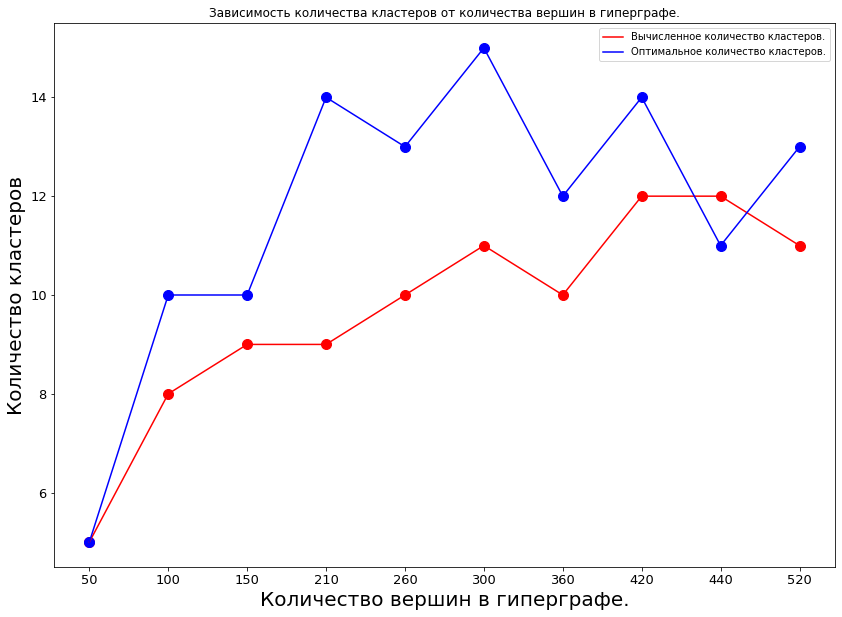

In [ ]:
plt.figure(figsize=(14, 10))
plt.plot(estimated_n_clusters, c='r', label='Вычисленное количество кластеров.')
plt.plot(best_n_clusters, c='b', label='Оптимальное количество кластеров.')

plt.scatter(range(len(n_experimnts)), y=estimated_n_clusters, c='r', marker='o', s=100)
plt.scatter(range(len(n_experimnts)), y=best_n_clusters, c='b', marker='o', s=100)


plt.xticks(range(len(n_experimnts)), n_experimnts, fontsize=13)
plt.xlabel("Количество вершин в гиперграфе.", fontsize=20)
plt.ylabel("Количество кластеров", fontsize=20)
plt.yticks(fontsize=13)
plt.title("Зависимость количества кластеров от количества вершин в гиперграфе.")
plt.legend()

#### Пробуем невзвешенную версию: в графе-проекции каждая пара вершин из 1 кластера соединена ребром веса 1.

**Модулярность:** -12172. Хуже, чем в предыдущем случае.

In [ ]:
G_unweight = G.copy()

for edge in G_unweight.edges:
    G_unweight.edges[edge]['weight'] = 1

In [ ]:
adj_matrix_unweight = get_weighted_adjacency(G_unweight)
labels_unweight = get_louvain_labels(adj_matrix_unweight)
# visualize_sci_graph_clusterisation_with_weights(adj_matrix, labels)
print("modulrity: ", get_simple_modularity(H, labels_unweight))

modulrity:  -12172.720772493845


#### Обобщаю эксперимент: пробую обратную степенную функцию от количества вершин в гиперребре.

**Лучшая модулярность:** -6853. При alpha = 1.354.

In [ ]:
def get_projection_graph_invdeg_alpha(H: Hypergraph, alpha):
    G = nx.Graph()
    G.add_nodes_from(range(H.number_of_vertexes))
    for edge in H.hyperedges:
        vertexes = edge.vertexes
        for i in range(len(vertexes)):
            for j in range(i + 1, len(vertexes)):
                v1 = vertexes[i]
                v2 = vertexes[j]

                w = edge.weight / (len(edge) ** alpha)
                prev_weight = 0
                if (v1, v2) in G.edges: # (v2, v1) ???
                    prev_weight = G.edges[v1, v2]['weight']
                prev_weight += w
                # print(v1, v2)
                G.add_edge(v1, v2, weight=prev_weight)
    return G

In [ ]:
def get_modularity(H: Hypergraph, alpha):
    G_local = get_projection_graph_invdeg_alpha(H, alpha)

    '''    conn_comp = sorted(list(nx.connected_components(G_local)), key=lambda x: -len(x))
        comp_sz = [len(x) for x in conn_comp]
        # print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))
        G_local = G_local.subgraph(conn_comp[0])
    '''    
    adj_matrix_local = get_weighted_adjacency(G_local)

    labels_local = get_louvain_labels(adj_matrix_local)

    simple_modularity = get_simple_modularity(H, labels_local)
    return simple_modularity

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/300 [00:00<?, ?it/s]

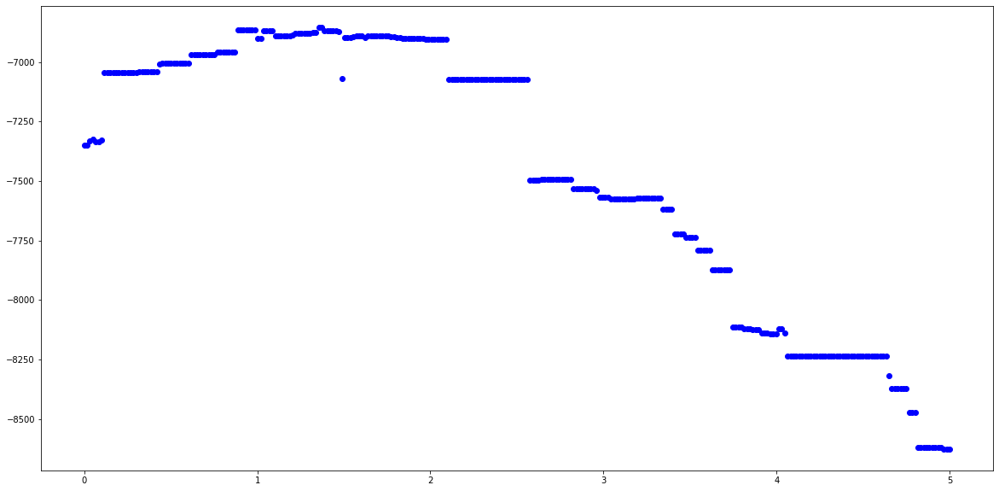

In [ ]:
alphas = np.linspace(0, 5, 300)
modulatities = []
for alpha in tqdm_notebook(alphas):
    modulatities.append(get_modularity(H, alpha))

plt.figure(figsize=(20, 10))
plt.scatter(x=alphas, y=modulatities, c='b')


In [ ]:
alpha_best = alphas[np.argmax(modulatities)]
print('best alpha = ', alpha_best, '\nbest_modularity = ', max(modulatities))

best alpha =  1.354515050167224 
best_modularity =  -6853.825830206154


#### Еще один эксперимент с центральностью.

In [ ]:
def get_projection_graph_centr(H: Hypergraph, alpha, data: pd.DataFrame):
    G = nx.Graph()
    G.add_nodes_from(range(H.number_of_vertexes))
    for edge in H.hyperedges:
        vertexes = edge.vertexes
        for i in range(len(vertexes)):
            for j in range(i + 1, len(vertexes)):
                v1 = vertexes[i]
                v2 = vertexes[j]

                # w = edge.weight / (len(edge) ** alpha)
                # w = edge.weight * np.sqrt(data['degree_centrality'][v1] * data['degree_centrality'][v2]) / (data['degree'][v1] + data['degree'][v2])
                w = edge.weight / (len(edge) ** alpha) * np.log(data['degree'][v1] + data['degree'][v2])
                w = (w ** alpha)
                prev_weight = 0
                if (v1, v2) in G.edges: # (v2, v1) ???
                    prev_weight = G.edges[v1, v2]['weight']
                prev_weight += w
                # print(v1, v2)
                G.add_edge(v1, v2, weight=prev_weight)
    return G

In [ ]:
G_ = get_projection_graph_centr(H, 2, data)
adj_matrix_ = get_weighted_adjacency(G_)
labels_ = get_louvain_labels(adj_matrix_)
# visualize_sci_graph_clusterisation_with_weights(adj_matrix, labels)
print("modulrity: ", get_simple_modularity(H, labels_))

modulrity:  -8220.606551704106


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/50 [00:00<?, ?it/s]

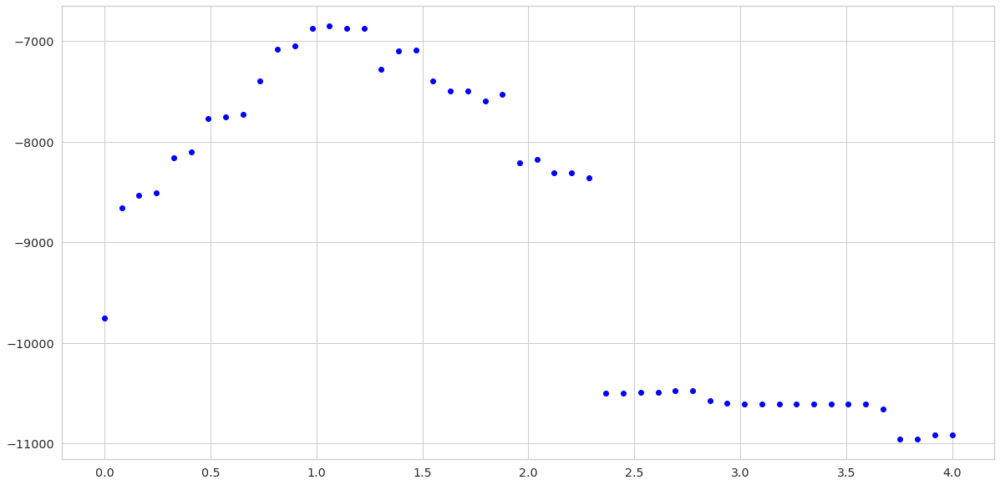

In [ ]:
alphas = np.linspace(0, 4, 50)
modulatities = []
for alpha in tqdm_notebook(alphas):
    G_ = get_projection_graph_centr(H, alpha, data)
    adj_matrix_ = get_weighted_adjacency(G_)
    labels_ = get_louvain_labels(adj_matrix_)
    modulatities.append(get_simple_modularity(H, labels_))

plt.figure(figsize=(20, 10))
plt.scatter(x=alphas, y=modulatities, c='b')

In [ ]:
alpha_best = alphas[np.argmax(modulatities)]
print('best alpha = ', alpha_best, '\nbest_modularity = ', max(modulatities))

best alpha =  1.0612244897959182 
best_modularity =  -6851.9238956755835


#### Пробуем вес ребра - обратно пропорциональный количеству вершин в гиперребре.

Перепишем функцию проекции гиперграфа с учетом размеров гиперребер.

**Модулярность:** 0.622.

In [ ]:
def get_projection_graph_inv_prop(H: Hypergraph):
    G = nx.Graph()
    for edge in H.hyperedges:
        vertexes = edge.vertexes
        for i in range(len(vertexes)):
            for j in range(i + 1, len(vertexes)):
                v1 = vertexes[i]
                v2 = vertexes[j]

                w = 1.0 / len(edge)
                prev_weight = 0
                if (v1, v2) in G.edges: # (v2, v1) ???
                    prev_weight = G.edges[v1, v2]['weight']
                prev_weight += w
                # print(v1, v2)
                G.add_edge(v1, v2, weight=prev_weight)
    return G

Делаю новую проекцию и беру в ней гигантскую компоненту.

In [ ]:
G_inv_prop = get_projection_graph_inv_prop(H)

conn_comp = sorted(list(nx.connected_components(G_inv_prop)), key=lambda x: -len(x))
comp_sz = [len(x) for x in conn_comp]
print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))

G_inv_prop = G_inv_prop.subgraph(conn_comp[0])

top-10 components:  [628, 60, 26, 18, 8, 8, 7, 7, 7, 6] 
number components:  171


In [ ]:
adj_matrix_inv_prop = get_weighted_adjacency(G_inv_prop)
labels_inv_prop = get_louvain_labels(adj_matrix_inv_prop)

simple_modularity = modularity(adj_matrix_inv_prop, labels_inv_prop)
random_modularity = modularity(adj_matrix_inv_prop, np.random.random_integers(low=1, high=2, size = (628,)))
print("modulrity: ", simple_modularity, "\nrandom_modularity = ", random_modularity)

modulrity:  0.6227962339449666 
random_modularity =  -0.006708864571028816


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: This function is deprecated. Please call randint(1, 2 + 1) instead
  """


#### Теперь попробуем вес ребра ~ $\frac{1}{n^2}$, где n - количество вершин гиперребра (чтобы суммарный вес спроецированных ребер с 1 гиперребра был ~ 1.

**Модулярность:** 0.737

In [ ]:
def get_projection_graph_inv_square(H: Hypergraph):
    G = nx.Graph()
    for edge in H.hyperedges:
        vertexes = edge.vertexes
        for i in range(len(vertexes)):
            for j in range(i + 1, len(vertexes)):
                v1 = vertexes[i]
                v2 = vertexes[j]

                w = 1.0 / (len(edge) ** 2)
                prev_weight = 0
                if (v1, v2) in G.edges: # (v2, v1) ???
                    prev_weight = G.edges[v1, v2]['weight']
                prev_weight += w
                # print(v1, v2)
                G.add_edge(v1, v2, weight=prev_weight)
    return G

Делаю новую проекцию и беру в ней гигантскую компоненту.

In [ ]:
G_inv_square = get_projection_graph_inv_square(H)

conn_comp = sorted(list(nx.connected_components(G_inv_square)), key=lambda x: -len(x))
comp_sz = [len(x) for x in conn_comp]
print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))

G_inv_square = G_inv_square.subgraph(conn_comp[0])

top-10 components:  [628, 60, 26, 18, 8, 8, 7, 7, 7, 6] 
number components:  171


In [ ]:
adj_matrix_inv_square = get_weighted_adjacency(G_inv_square)
labels_inv_square = get_louvain_labels(adj_matrix_inv_square)

simple_modularity = modularity(adj_matrix_inv_square, labels_inv_square)
random_modularity = modularity(adj_matrix_inv_square, np.random.random_integers(low=1, high=2, size = (628,)))
print("modulrity: ", simple_modularity, "\nrandom_modularity = ", random_modularity)

modulrity:  0.7375017707919783 
random_modularity =  -0.019635595474597645


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: This function is deprecated. Please call randint(1, 2 + 1) instead
  """


#### Обобщаю эксперимент: пробую обратную степенную функцию от количества вершин в гиперребре.

In [ ]:
def get_projection_graph_invdeg_alpha(H: Hypergraph, alpha):
    G = nx.Graph()
    for edge in H.hyperedges:
        vertexes = edge.vertexes
        for i in range(len(vertexes)):
            for j in range(i + 1, len(vertexes)):
                v1 = vertexes[i]
                v2 = vertexes[j]

                w = 1.0 / (len(edge) ** alpha)
                prev_weight = 0
                if (v1, v2) in G.edges: # (v2, v1) ???
                    prev_weight = G.edges[v1, v2]['weight']
                prev_weight += w
                # print(v1, v2)
                G.add_edge(v1, v2, weight=prev_weight)
    return G

In [ ]:
def get_modularity(H: Hypergraph, alpha):
    G_local = get_projection_graph_invdeg_alpha(H, alpha)

    conn_comp = sorted(list(nx.connected_components(G_local)), key=lambda x: -len(x))
    comp_sz = [len(x) for x in conn_comp]
    # print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))
    G_local = G_local.subgraph(conn_comp[0])
    adj_matrix_local = get_weighted_adjacency(G_local)

    labels_local = get_louvain_labels(adj_matrix_local)

    simple_modularity = modularity(adj_matrix_local, labels_local)
    return simple_modularity

In [ ]:
alphas = np.linspace(0, 1, 100)
modulatities = []
for alpha in tqdm_notebook(alphas):
    modulatities.append(get_modularity(H, alpha))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/100 [00:00<?, ?it/s]

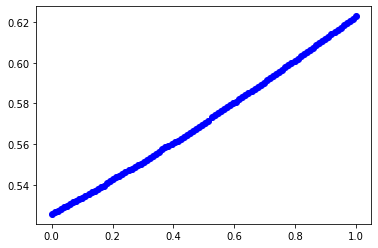

In [ ]:
plt.scatter(x=alphas, y=modulatities, c='b')

In [ ]:
alphas = np.linspace(0, 10, 5000)
modulatities = []
for alpha in tqdm_notebook(alphas):
    modulatities.append(get_modularity(H, alpha))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/5000 [00:00<?, ?it/s]

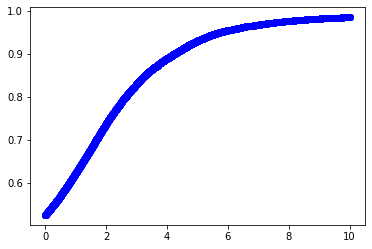

In [ ]:
plt.scatter(x=alphas, y=modulatities, c='b')

In [ ]:
def get_modularity_(H: Hypergraph, alpha):
    G_local = get_projection_graph_invdeg_alpha(H, alpha)

    conn_comp = sorted(list(nx.connected_components(G_local)), key=lambda x: -len(x))
    comp_sz = [len(x) for x in conn_comp]
    # print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))
    G_local = G_local.subgraph(conn_comp[0])
    adj_matrix_local = get_weighted_adjacency(G_local)

    labels_local = get_louvain_labels(adj_matrix_local)

    simple_modularity = modularity(adj_matrix_local, labels_local)
    return G_local, adj_matrix_local, labels_local, simple_modularity

In [ ]:
G_local, adj_matrix_local, labels_local, simple_modularity = get_modularity_(H, 10)
visualize_sci_graph_clusterisation_with_weights(adj_matrix_local, labels_local)

In [ ]:
visualize_nx_graph_clusterisation(G_local, labels_local, figsize=(20, 20))

## Реальные данные

#### Следующий гиперграф - лекарства. 

План:

1) Установить правильную $\lambda$ (не могу, так как нет истинных меток)

2) Исследовать схлопываемость

In [ ]:
H = get_NDC_classes_hypergraph()

In [ ]:
def get_projection_graph(H: Hypergraph, weighted_func):
    G = nx.Graph()
    G.add_nodes_from(range(H.number_of_vertexes))
    for edge in H.hyperedges:
        vertexes = edge.vertexes
        for i in range(len(vertexes)):
            for j in range(i + 1, len(vertexes)):
                v1 = vertexes[i]
                v2 = vertexes[j]
                w = weighted_func(v1, v2, edge.weight)
                if w != 0:
                    prev_weight = 0
                    if (v1, v2) in G.edges: # (v2, v1) ???
                        prev_weight = G.edges[v1, v2]['weight']
                    prev_weight += w
                    # print(v1, v2)
                    G.add_edge(v1, v2, weight=prev_weight)
    return G

In [ ]:
G = get_projection_graph(H, lambda v1, v2, w: w)
conn_comp = sorted(list(nx.connected_components(G)), key=lambda x: -len(x))
comp_sz = [len(x) for x in conn_comp]
print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))

top-10 components:  [628, 60, 26, 18, 8, 8, 7, 7, 7, 6] 
number components:  183


In [ ]:
H_big = H.pruning(list(conn_comp[0]))

In [ ]:
len(H_big.hyperedges)

816

In [ ]:
def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - парамет
        ры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * np.exp(k / 3))
        β[k] = k * (k - 1) / 2
    return β, γ


def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        # γ.append(m_ks[k] / (H_vol ** k) * 4) # А здесь не m_k_collapsed?????
        γ.append(m_ks[k] / (H_vol ** k) * np.exp(k / 3))
        β[k] = k * (k - 1) / 2
    return β, γ

In [ ]:
z = get_hard_clusterisation(H)

edge_sizes:  [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]
Start louvain step:

β.size =  25
preproc start
preproc end


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/1161 [00:00<?, ?it/s]

Δ =  0.9986441090690985


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: overflow encountered in long_scalars


Δ =  0.9992801211809429
Δ =  2.998781585594566
Δ =  0.9999616722923687
Δ =  0.7063655113180056
Δ =  0.9838716188094994
Δ =  0.9464422170566805
Δ =  0.8993568053527614
Δ =  0.837847982943436
Δ =  0.9984488885819598
Δ =  0.9886802587973735
Δ =  0.9784977827844122
Δ =  0.9999829658647221
Δ =  0.999893529127128
Δ =  0.9999744478938105
Δ =  0.9946258912629437
Δ =  0.941343865950917
Δ =  2.170286063993233
Δ =  0.9999446325362851
Δ =  0.9992843808188855
Δ =  0.9938497190715937
Δ =  0.9721673157749685
Δ =  0.9997913072525711
Δ =  0.9802778776895584
Δ =  2.8002314917673914
Δ =  0.999893529127128
Δ =  0.7994530906485737
Δ =  0.8406575764493025
Δ =  0.999995741566539
Δ =  0.9998126002224441
Δ =  0.9996592610862151
Δ =  0.9646610055321772
Δ =  0.9866282272978771
Δ =  0.997336973134829
Δ =  0.9809506382198366
Δ =  0.8412612661677116
Δ =  0.9999829658647221
Δ =  0.999893529127128
Δ =  0.46132876521884436
Δ =  0.8778919943882172
Δ =  0.9905829150325104
Δ =  0.9705475944605089
Δ =  0.9995570237517396


  0%|          | 0/1161 [00:00<?, ?it/s]

Δ =  5.557847992529228
Δ =  2.8457051096756225
Δ =  2.976580102714482
Δ =  0.9993866121296505
Δ =  2.9979871740996455
Δ =  2.943540231043545
Δ =  0.6753489573596749
Δ =  2.802470382166455
Δ =  0.31566888478397326
Δ =  3.0036887098389164
Δ =  1.7211271562370543
Δ =  0.7390469881835295
Δ =  0.9808583915082337
Δ =  2.99943771453169
Δ =  0.8219688463161785
Δ =  0.9568881813655397


  0%|          | 0/1161 [00:00<?, ?it/s]

z_new =  [1, 1, 2, 3, 4, 5, 5, 5, 6, 6, 7, 8, 9, 10, 11, 12, 12, 13, 14, 15, 15, 16, 16, 17, 18, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 25, 21, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 37, 37, 38, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 49, 50, 51, 52, 53, 54, 4, 4, 55, 56, 4, 57, 58, 59, 59, 60, 61, 62, 63, 41, 64, 65, 66, 66, 67, 67, 68, 69, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 86, 87, 87, 88, 88, 89, 90, 91, 91, 92, 93, 94, 95, 95, 96, 96, 97, 98, 99, 100, 101, 101, 102, 103, 104, 105, 106, 107, 107, 108, 109, 110, 111, 112, 112, 113, 113, 114, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 170, 171, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 183, 184, 184

  0%|          | 0/867 [00:00<?, ?it/s]

Δ =  0.9572783856027649
Δ =  4.28700006716329
Δ =  9.992656907587408
Δ =  5.0848195061319075
Δ =  5.851603402264903
Δ =  8.39321441443144
Δ =  5.743904321317383
Δ =  0.19171813366406507
Δ =  2.958337897745144
Δ =  1.789094745295035
Δ =  5.3772247419276376
Δ =  2.6656630614241763
Δ =  5.494278369892761
Δ =  15.57011299372959
Δ =  0.11804896550876964
Δ =  4.873755975038018
Δ =  5.99367990048147
Δ =  4.739768197714562
Δ =  5.9829138719896875
Δ =  9.848506301801422
Δ =  14.882150611875415
Δ =  0.2685154718593199
Δ =  5.899180943687569
Δ =  12.296934759433347
Δ =  5.878412416996902
Δ =  5.934135824131974
Δ =  2.3054060224179733
Δ =  5.844951167233805
Δ =  5.789226437709335
Δ =  3.1164724550608436
Δ =  5.999450077386717
Δ =  0.22833943173313953
Δ =  4.345752924119817


  0%|          | 0/867 [00:00<?, ?it/s]

Δ =  5.437055509344928
Δ =  2.972157395926936
Δ =  5.853110012002258


  0%|          | 0/867 [00:00<?, ?it/s]

z_new =  [1, 1, 2, 3, 4, 5, 5, 5, 6, 6, 7, 8, 9, 10, 11, 12, 12, 13, 14, 15, 15, 16, 16, 17, 18, 19, 20, 20, 5, 5, 21, 21, 22, 22, 23, 23, 24, 24, 5, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 4, 4, 4, 36, 36, 37, 37, 38, 20, 39, 40, 41, 42, 43, 44, 44, 45, 46, 47, 48, 49, 50, 51, 4, 4, 52, 53, 4, 4, 54, 55, 55, 56, 57, 58, 59, 20, 60, 61, 62, 62, 63, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 82, 83, 83, 26, 26, 84, 85, 86, 86, 87, 88, 89, 62, 62, 90, 90, 91, 92, 93, 94, 4, 4, 95, 96, 97, 98, 99, 100, 100, 101, 102, 103, 104, 105, 105, 106, 106, 107, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 163, 164, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 176, 177, 177, 178, 179, 180, 

  0%|          | 0/832 [00:00<?, ?it/s]

Δ =  0.11523560601476701
Δ =  0.05645499142897881
Δ =  0.06308900830754038
Δ =  2.720455886453206
Δ =  27.905664905641455
Δ =  4.773509683277039
Δ =  4.693192525964345
Δ =  7.8051820347368945
Δ =  3.216142154491351
Δ =  5.17815337829798
Δ =  5.153575600805256
Δ =  9.244985789834677
Δ =  2.7227473981156978
Δ =  5.932872855580856
Δ =  9.892448204230979


  0%|          | 0/832 [00:00<?, ?it/s]

Δ =  2.1845803795193266
Δ =  5.967437613331395


  0%|          | 0/832 [00:00<?, ?it/s]

Δ =  12.202536850486272
Δ =  2.817342153631687


  0%|          | 0/832 [00:00<?, ?it/s]

z_new =  [1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 14, 15, 16, 17, 18, 18, 3, 3, 19, 19, 20, 20, 21, 21, 22, 22, 3, 23, 2, 24, 25, 26, 27, 28, 29, 30, 31, 32, 2, 2, 2, 33, 33, 34, 34, 35, 18, 36, 37, 38, 39, 40, 41, 41, 42, 43, 44, 45, 46, 47, 48, 2, 2, 49, 50, 2, 2, 51, 52, 52, 53, 54, 55, 56, 18, 57, 58, 59, 59, 60, 60, 61, 62, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 79, 80, 80, 2, 2, 81, 81, 82, 82, 83, 84, 85, 59, 59, 86, 86, 87, 88, 89, 90, 2, 2, 91, 92, 93, 94, 95, 2, 2, 96, 97, 98, 99, 100, 100, 101, 101, 102, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 158, 159, 159, 160, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 170, 171, 171, 172, 173, 174, 168, 175, 175

  0%|          | 0/813 [00:00<?, ?it/s]

Δ =  0.4485346669716437


  0%|          | 0/813 [00:00<?, ?it/s]

z_new =  [1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 14, 15, 16, 17, 18, 18, 3, 3, 19, 19, 20, 20, 21, 21, 22, 22, 3, 23, 2, 24, 25, 26, 27, 28, 29, 30, 31, 32, 2, 2, 2, 33, 33, 34, 34, 35, 18, 36, 37, 38, 39, 40, 41, 41, 42, 43, 44, 45, 46, 47, 48, 2, 2, 49, 50, 2, 2, 51, 52, 52, 53, 54, 55, 56, 18, 57, 58, 59, 59, 60, 60, 61, 62, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 79, 80, 80, 2, 2, 81, 81, 82, 82, 83, 84, 85, 59, 59, 86, 86, 87, 88, 89, 90, 2, 2, 91, 92, 93, 94, 95, 2, 2, 96, 97, 98, 99, 100, 100, 101, 101, 102, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 158, 159, 159, 160, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 170, 171, 171, 172, 173, 174, 168, 175, 175

  0%|          | 0/812 [00:00<?, ?it/s]

z_new =  [1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 14, 15, 16, 17, 18, 18, 3, 3, 19, 19, 20, 20, 21, 21, 22, 22, 3, 23, 2, 24, 25, 26, 27, 28, 29, 30, 31, 32, 2, 2, 2, 33, 33, 34, 34, 35, 18, 36, 37, 38, 39, 40, 41, 41, 42, 43, 44, 45, 46, 47, 48, 2, 2, 49, 50, 2, 2, 51, 52, 52, 53, 54, 55, 56, 18, 57, 58, 59, 59, 60, 60, 61, 62, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 79, 80, 80, 2, 2, 81, 81, 82, 82, 83, 84, 85, 59, 59, 86, 86, 87, 88, 89, 90, 2, 2, 91, 92, 93, 94, 95, 2, 2, 96, 97, 98, 99, 100, 100, 101, 101, 102, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 158, 159, 159, 160, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 170, 171, 171, 172, 173, 174, 168, 175, 175

In [ ]:
clusters_ndc = get_clusters(z)

In [ ]:
cluster_sz = [len(x) for x in clusters_ndc]

In [ ]:
cluster_sz[:100]

(array([781.,   8.,   7.,   9.,   1.,   0.,   2.,   2.,   0.,   1.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([ 1.        ,  2.26666667,  3.53333333,  4.8       ,  6.06666667,
         7.33333333,  8.6       ,  9.86666667, 11.13333333, 12.4       ,
        13.66666667, 14.93333333, 16.2       , 17.46666667, 18.73333333,
        20.        , 21.26666667, 22.53333333, 23.8       , 25.06666667,
        26.33333333, 27.6       , 28.86666667, 30.13333333, 31.4       ,
        32.66666667, 33.93333333, 35.2       , 36.46666667, 37.73333333,
        39.        ]),
 <a list of 30 Patch objects>)

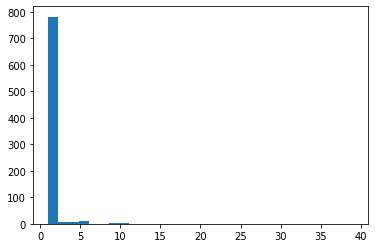

In [ ]:
plt.hist(cluster_sz, bins=30)

In [ ]:
labelss, sz = get_step_by_step_clusterisation(H)

In [ ]:
print(sz)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]


In [ ]:
print(len(labelss))

23


In [ ]:
diffs1 = [difference1(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
diffs2 = [difference2(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
diffs3 = [difference3(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]

In [ ]:
n_clusters = [np.unique(z_).shape[0] for z_ in labelss]

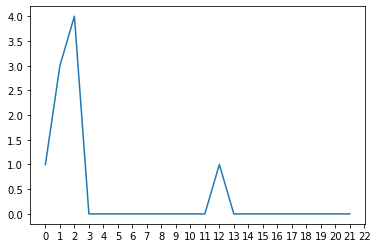

In [ ]:
plt.plot(diffs1)
plt.xticks(range(len(labelss)));

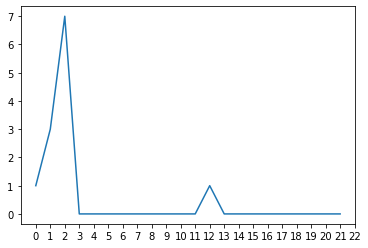

In [ ]:
plt.plot(diffs2)
plt.xticks(range(len(labelss)));

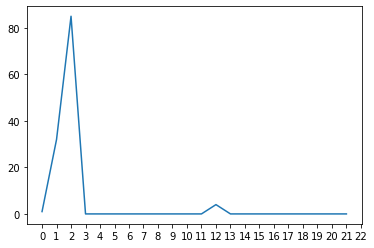

In [ ]:
plt.plot(diffs3)
plt.xticks(range(len(labelss)));

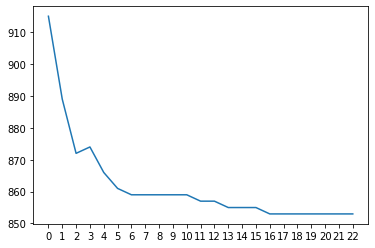

In [ ]:
plt.plot(n_clusters)
plt.xticks(range(len(labelss)));

In [ ]:
labelss, sz = get_step_by_step_clusterisation(H)

In [ ]:
get_hard

In [ ]:
diffs1 = [difference1(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
diffs2 = [difference2(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
diffs3 = [difference3(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]

In [ ]:
n_clusters = [np.unique(z_).shape[0] for z_ in labelss]

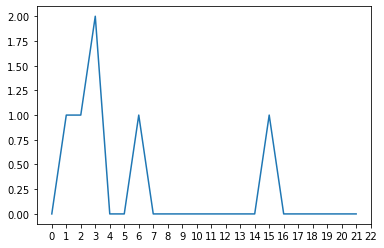

In [ ]:
plt.plot(diffs1)
plt.xticks(range(len(labelss)));

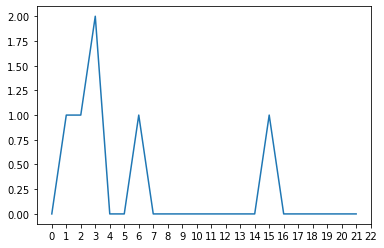

In [ ]:
plt.plot(diffs2)
plt.xticks(range(len(labelss)));

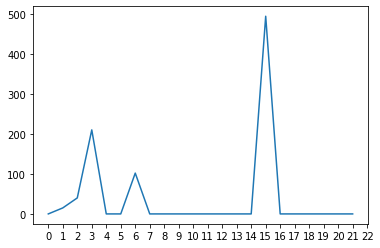

In [ ]:
plt.plot(diffs3)
plt.xticks(range(len(labelss)));

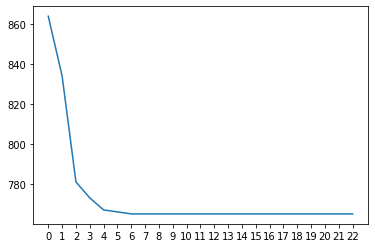

In [ ]:
plt.plot(n_clusters)
plt.xticks(range(len(labelss)));

А теперь только с гигантской компонентой

In [ ]:
def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - парамет
        ры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * np.exp(k / 3))
        β[k] = k * (k - 1) / 2
    return β, γ


def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        # γ.append(m_ks[k] / (H_vol ** k) * 4) # А здесь не m_k_collapsed?????
        γ.append(m_ks[k] / (H_vol ** k) * np.exp(k / 3))
        β[k] = k * (k - 1) / 2
    return β, γ

In [ ]:
labelss, sz = get_step_by_step_clusterisation(H_big)

sz =  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  # This is added back by InteractiveShellApp.init_path()


  0%|          | 0/24 [00:00<?, ?it/s]

edge_sizes:  [2]
Start louvain step:

β.size =  3
preproc start
preproc end


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9998066189395299
Δ =  0.7631082009241483
Δ =  0.8373665281446603
Δ =  0.8537555730194998
Δ =  0.9857864920554489
Δ =  0.8856634479970634
Δ =  0.9997582736744124
Δ =  0.9936184250044873
Δ =  0.815901230432481
Δ =  0.982547359292575
Δ =  0.933815332054114
Δ =  0.979114845469231
Δ =  0.9998066189395299
Δ =  0.8925284756437514
Δ =  0.9969059030324787
Δ =  0.6424384191908166
Δ =  0.9744253547528315
Δ =  0.9905243280369659
Δ =  0.9907177090974361
Δ =  0.9998066189395299
Δ =  0.7894080251480796
Δ =  0.991829650195139
Δ =  0.8429262336331751
Δ =  0.09260771900925313
Δ =  0.9976310820092414
Δ =  0.9106096047977041
Δ =  0.9976310820092414
Δ =  0.9756339863807696
Δ =  0.025166074170311692
Δ =  0.9968092125022436
Δ =  0.0005317979162927282
Δ =  0.18296501951389943
Δ =  0.18296501951389943
Δ =  0.9925548291719019
Δ =  0.9898474943253206
Δ =  0.7058674070250037
Δ =  0.9766008916831199
Δ =  0.742368082188732
Δ =  0.9843361341019233
Δ =  0.9995648926139423
Δ =  0.9876236121299147
Δ =  0.7631082

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.995358854548718
Δ =  0.1729310133253717
Δ =  0.7957896001435923
Δ =  0.9445479809102038
Δ =  0.7277194668581232


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 10, 11, 11, 12, 13, 14, 14, 15, 16, 17, 18, 19, 20, 20, 21, 21, 20, 22, 23, 24, 25, 26, 27, 28, 29, 29, 30, 31, 31, 32, 33, 34, 35, 36, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 33, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 57, 58, 58, 59, 59, 60, 61, 62, 62, 63, 64, 65, 66, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 129, 130, 131, 132, 132, 133, 133, 134, 134, 135, 135, 136, 137, 138, 139, 140, 141, 142, 142, 143, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 157, 158, 159, 160, 161, 162, 162, 163, 15, 164, 165, 166, 166, 167, 168, 168, 169, 170, 171, 120, 172, 172, 173, 173, 174, 175, 147, 176, 176, 150, 150, 177, 177, 178, 178, 179, 180, 181, 182, 183, 184

  0%|          | 0/528 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 10, 11, 11, 12, 13, 14, 14, 15, 16, 17, 18, 19, 20, 20, 21, 21, 20, 22, 23, 24, 25, 26, 27, 28, 29, 29, 30, 31, 31, 32, 33, 34, 35, 36, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 33, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 57, 58, 58, 59, 59, 60, 61, 62, 62, 63, 64, 65, 66, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 129, 130, 131, 132, 132, 133, 133, 134, 134, 135, 135, 136, 137, 138, 139, 140, 141, 142, 142, 143, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 157, 158, 159, 160, 161, 162, 162, 163, 15, 164, 165, 166, 166, 167, 168, 168, 169, 170, 171, 120, 172, 172, 173, 173, 174, 175, 147, 176, 176, 150, 150, 177, 177, 178, 178, 179, 180, 181, 182, 183, 184

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9974427930780386
Δ =  2.995814153495958
Δ =  0.05038512287033736
Δ =  0.9274377344460312
Δ =  0.9253544412253476
Δ =  0.326346726056276
Δ =  0.9937794013947591
Δ =  0.9498844737142521
Δ =  0.9998943898249743
Δ =  0.9854229857255505
Δ =  0.8682479161207315
Δ =  2.9013618796925966
Δ =  0.9710146590921535
Δ =  0.954952310074934
Δ =  0.9958568723376018
Δ =  2.9893394921690977
Δ =  0.7970411698406057
Δ =  0.22744738625750638
Δ =  0.9986477134997236
Δ =  0.8428678017875242
Δ =  0.9888106971378028
Δ =  0.9958568723376018
Δ =  0.9959408544514298
Δ =  0.9994718747092544
Δ =  0.5078956542450159
Δ =  0.3896772819266555
Δ =  0.9511805231255809
Δ =  0.8242208923432096
Δ =  0.5998173510120732
Δ =  0.9670686433183898
Δ =  0.027534512995712523
Δ =  0.9571012981507564
Δ =  0.9989647285755302
Δ =  0.988759700302971
Δ =  0.5699238503064877
Δ =  0.998605405432283
Δ =  0.00023247335654193868
Δ =  0.2915292169664334
Δ =  0.6342555185025869
Δ =  0.5423192878600402
Δ =  2.1201018820735364
Δ =  0.901008

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  2.9953488957255967
Δ =  2.9972946649835337
Δ =  2.9923724925308113
Δ =  2.989989655439177
Δ =  2.9864942310537814
Δ =  0.9979711416156339
Δ =  0.2736084030739595
Δ =  2.6263284507725198
Δ =  0.0367968328270476
Δ =  3.0140006368776215
Δ =  0.9103907529983319
Δ =  0.9757201059275099
Δ =  0.7943736249463029


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 33, 33, 34, 35, 33, 36, 37, 38, 39, 40, 41, 30, 42, 43, 44, 44, 45, 46, 47, 48, 49, 50, 51, 52, 52, 53, 53, 54, 54, 55, 56, 57, 57, 58, 59, 60, 61, 61, 62, 63, 64, 65, 3, 3, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 120, 24, 24, 121, 122, 123, 123, 111, 111, 124, 124, 125, 125, 126, 127, 128, 129, 130, 130, 131, 131, 74, 74, 132, 133, 134, 135, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 144, 145, 146, 147, 148, 149, 149, 150, 14, 151, 152, 153, 153, 154, 116, 116, 155, 137, 156, 113, 135, 135, 157, 157, 158, 159, 135, 160, 160, 137, 137, 161, 161, 162, 162, 163, 164, 165, 166, 167, 168, 169, 170, 17

  0%|          | 0/503 [00:00<?, ?it/s]

Δ =  2.8990016253805226
Δ =  2.957848755370618
Δ =  1.4136861474615416
Δ =  1.5742235391388937


  0%|          | 0/503 [00:00<?, ?it/s]

Δ =  2.7300141683484345


  0%|          | 0/503 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 21, 21, 21, 27, 27, 28, 29, 30, 31, 21, 21, 32, 33, 21, 34, 35, 36, 37, 38, 39, 29, 40, 41, 42, 42, 43, 44, 45, 46, 47, 48, 49, 50, 50, 51, 51, 52, 52, 53, 54, 55, 55, 56, 57, 58, 59, 59, 60, 61, 62, 63, 3, 3, 64, 65, 66, 67, 68, 21, 21, 69, 70, 71, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 109, 110, 111, 112, 113, 114, 115, 116, 117, 117, 24, 24, 118, 119, 120, 120, 108, 108, 121, 121, 122, 122, 123, 124, 125, 126, 127, 127, 108, 108, 71, 71, 128, 129, 130, 131, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 140, 141, 142, 143, 144, 145, 145, 146, 14, 147, 148, 149, 149, 150, 113, 113, 151, 133, 152, 110, 131, 131, 153, 153, 154, 155, 131, 156, 156, 133, 133, 157, 157, 158, 158, 159, 160, 161, 162, 163, 164, 165, 166, 166, 

  0%|          | 0/499 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 21, 21, 21, 27, 27, 28, 29, 30, 31, 21, 21, 32, 33, 21, 34, 35, 36, 37, 38, 39, 29, 40, 41, 42, 42, 43, 44, 45, 46, 47, 48, 49, 50, 50, 51, 51, 52, 52, 53, 54, 55, 55, 56, 57, 58, 59, 59, 60, 61, 62, 63, 3, 3, 64, 65, 66, 67, 68, 21, 21, 69, 70, 71, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 109, 110, 111, 112, 113, 114, 115, 116, 117, 117, 24, 24, 118, 119, 120, 120, 108, 108, 121, 121, 122, 122, 123, 124, 125, 126, 127, 127, 108, 108, 71, 71, 128, 129, 130, 131, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 140, 141, 142, 143, 144, 145, 145, 146, 14, 147, 148, 149, 149, 150, 113, 113, 151, 133, 152, 110, 131, 131, 153, 153, 154, 155, 131, 156, 156, 133, 133, 157, 157, 158, 158, 159, 160, 161, 162, 163, 164, 165, 166, 166, 

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9980597353560681
Δ =  2.9968241441930465
Δ =  0.24405093631122232
Δ =  0.9449671432453335
Δ =  0.859834259276324
Δ =  0.40423385073335516
Δ =  0.9952808594373219
Δ =  0.9619880705949485
Δ =  0.9999198631432699
Δ =  0.9881697630005762
Δ =  0.8856278497667973
Δ =  2.740319642122302
Δ =  0.9768227548884668
Δ =  0.9417305581503831
Δ =  0.9891501875302098
Δ =  2.967411572601682
Δ =  0.5887529874486874
Δ =  0.395992302553157
Δ =  0.9989739333172274
Δ =  0.8665583712495442
Δ =  0.9688928081352013
Δ =  0.9948023474201402
Δ =  0.9881525405477368
Δ =  0.9995992665153781
Δ =  0.40998085890931235
Δ =  0.53755354636642
Δ =  0.9459015641368128
Δ =  0.86673434419653
Δ =  0.43317223241492653
Δ =  0.75028210541787
Δ =  0.9674607795322717
Δ =  0.9992144659236519
Δ =  0.9914732520138023
Δ =  0.6740545481213855
Δ =  0.9979792489762043
Δ =  0.4572954672994545
Δ =  0.5752518867543552
Δ =  0.6137634513715475
Δ =  2.0617930528800894
Δ =  0.9118703573170139
Δ =  0.29512688292709177
Δ =  0.97451730581682

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  5.8915436337411125
Δ =  2.9341235937280086
Δ =  2.98987450688943
Δ =  2.9924080894770833
Δ =  2.985859060709465
Δ =  0.3524818766351633
Δ =  2.6817297901917128
Δ =  3.013938456141808
Δ =  0.9277859794724075
Δ =  0.9815815850583002
Δ =  0.8370938946649542


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 3, 3, 33, 34, 3, 35, 36, 37, 38, 39, 40, 30, 41, 42, 43, 43, 44, 45, 46, 47, 48, 49, 50, 51, 51, 52, 52, 53, 53, 54, 55, 56, 56, 57, 58, 59, 60, 60, 61, 62, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 24, 24, 122, 123, 124, 124, 111, 111, 125, 125, 126, 126, 127, 128, 129, 130, 131, 131, 132, 132, 74, 74, 133, 134, 135, 136, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 145, 146, 147, 148, 149, 150, 150, 151, 14, 152, 153, 154, 154, 155, 116, 116, 156, 138, 157, 113, 136, 136, 158, 158, 159, 160, 136, 161, 161, 138, 138, 162, 162, 163, 163, 164, 165, 166, 167, 168, 169, 170, 171, 171

  0%|          | 0/505 [00:00<?, ?it/s]

Δ =  5.4546320324746205
Δ =  3.3898464435551827
Δ =  5.8798065949223535
Δ =  5.62361528203145
Δ =  0.36768201340218626
Δ =  2.9562361721467583
Δ =  0.9308879206780101
Δ =  5.103364592527008
Δ =  1.7617726265522686
Δ =  5.242126607981415
Δ =  5.986678825448643
Δ =  2.5063112955086946
Δ =  5.959360640418156
Δ =  5.690697002303046
Δ =  5.456875319475332
Δ =  5.7535604351998115
Δ =  5.861645967528169
Δ =  5.977276039278782


  0%|          | 0/505 [00:00<?, ?it/s]

Δ =  4.841032350024106
Δ =  2.9658177924253986


  0%|          | 0/505 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 3, 3, 3, 27, 27, 28, 17, 29, 30, 3, 3, 31, 32, 3, 33, 34, 35, 36, 37, 38, 17, 39, 40, 41, 41, 42, 43, 44, 45, 46, 47, 48, 49, 49, 50, 50, 21, 21, 51, 52, 53, 53, 54, 55, 56, 41, 41, 57, 58, 59, 60, 3, 3, 61, 62, 63, 64, 65, 3, 3, 66, 67, 68, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 106, 107, 108, 109, 105, 110, 111, 112, 113, 114, 24, 24, 115, 116, 117, 117, 105, 105, 118, 118, 119, 119, 120, 121, 122, 123, 124, 124, 105, 105, 68, 68, 125, 126, 127, 68, 68, 128, 129, 130, 131, 132, 133, 134, 135, 136, 136, 137, 138, 139, 140, 141, 141, 142, 14, 143, 144, 145, 145, 146, 105, 105, 147, 129, 148, 107, 68, 68, 68, 68, 149, 150, 68, 151, 151, 129, 129, 152, 152, 152, 152, 153, 154, 155, 156, 157, 158, 159, 160, 160, 161, 162, 163, 164

  0%|          | 0/486 [00:00<?, ?it/s]

Δ =  0.8576703708302427
Δ =  3.152453247078636
Δ =  5.649484605234854
Δ =  5.982162890357809
Δ =  5.910717653920435


  0%|          | 0/486 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 3, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 32, 33, 34, 35, 36, 37, 17, 38, 39, 40, 40, 41, 42, 43, 44, 45, 46, 47, 48, 48, 49, 49, 3, 3, 50, 51, 52, 52, 53, 54, 55, 40, 40, 56, 57, 58, 59, 3, 3, 60, 61, 62, 63, 64, 3, 3, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 113, 23, 23, 114, 115, 116, 116, 104, 104, 117, 117, 118, 118, 119, 120, 121, 122, 123, 123, 104, 104, 67, 67, 124, 125, 126, 67, 67, 127, 128, 129, 130, 131, 132, 133, 134, 3, 3, 135, 136, 137, 138, 139, 139, 140, 14, 141, 142, 143, 143, 144, 104, 104, 145, 128, 3, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 128, 128, 149, 149, 149, 149, 150, 151, 152, 153, 154, 155, 156, 157, 157, 158, 159, 160, 161, 162, 163

  0%|          | 0/481 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 3, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 32, 33, 34, 35, 36, 37, 17, 38, 39, 40, 40, 41, 42, 43, 44, 45, 46, 47, 48, 48, 49, 49, 3, 3, 50, 51, 52, 52, 53, 54, 55, 40, 40, 56, 57, 58, 59, 3, 3, 60, 61, 62, 63, 64, 3, 3, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 113, 23, 23, 114, 115, 116, 116, 104, 104, 117, 117, 118, 118, 119, 120, 121, 122, 123, 123, 104, 104, 67, 67, 124, 125, 126, 67, 67, 127, 128, 129, 130, 131, 132, 133, 134, 3, 3, 135, 136, 137, 138, 139, 139, 140, 14, 141, 142, 143, 143, 144, 104, 104, 145, 128, 3, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 128, 128, 149, 149, 149, 149, 150, 151, 152, 153, 154, 155, 156, 157, 157, 158, 159, 160, 161, 162, 163

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9982096492650124
Δ =  2.9969693439798193
Δ =  0.2622159860410005
Δ =  0.9636656424815809
Δ =  0.9075093742857644
Δ =  0.6031247434800431
Δ =  0.9967557912411296
Δ =  0.9727753494567448
Δ =  0.9999470574689082
Δ =  0.9908263835183394
Δ =  0.8926142556308946
Δ =  1.6042107614562393
Δ =  0.9846940764452222
Δ =  0.9324063819673511
Δ =  0.9884518416667469
Δ =  2.8047859606663708
Δ =  0.5276131231764807
Δ =  0.6018313373796753
Δ =  0.9991526658423661
Δ =  0.9119306884749943
Δ =  0.9794586684583934
Δ =  0.996566755100415
Δ =  0.9921753418862388
Δ =  0.999735260924367
Δ =  0.6950661095319217
Δ =  0.9266056440607613
Δ =  0.9114482314844583
Δ =  0.5505097521259208
Δ =  0.8228671535188765
Δ =  0.9785132891952215
Δ =  0.9994810596227184
Δ =  0.9943687982008359
Δ =  0.7850072582210339
Δ =  0.9986651489740475
Δ =  0.6303194276050752
Δ =  0.6577408368831369
Δ =  0.6549390095324291
Δ =  1.902051962400087
Δ =  0.9263688826655512
Δ =  0.5116619558248859
Δ =  0.9831726545687949
Δ =  0.849185686491

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  5.688023425856499
Δ =  2.6988079876062194
Δ =  2.988536986218579
Δ =  2.9949877363260513
Δ =  2.966086594430673
Δ =  0.39124656407266556
Δ =  2.790032702112277
Δ =  3.0091972061786842
Δ =  0.9523267742727906
Δ =  0.9878361812467412
Δ =  0.8925074748656896


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 3, 3, 33, 34, 3, 35, 36, 37, 38, 39, 40, 30, 41, 42, 43, 43, 44, 45, 46, 47, 48, 49, 50, 51, 51, 52, 52, 53, 53, 54, 55, 56, 56, 57, 58, 59, 60, 60, 61, 62, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 24, 24, 122, 123, 124, 124, 111, 111, 125, 125, 126, 126, 127, 128, 129, 130, 131, 131, 132, 132, 74, 74, 133, 134, 135, 136, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 145, 146, 147, 148, 149, 150, 150, 151, 14, 152, 153, 154, 154, 155, 116, 116, 156, 138, 157, 113, 136, 136, 158, 158, 159, 160, 136, 161, 161, 138, 138, 162, 162, 163, 163, 164, 165, 166, 167, 168, 169, 170, 171, 171

  0%|          | 0/508 [00:00<?, ?it/s]

Δ =  2.9745772178237764
Δ =  9.976835351097048
Δ =  3.1653111751655407
Δ =  5.682408832617996
Δ =  2.8529390529351617
Δ =  8.54356582652003
Δ =  5.7570400598461955
Δ =  0.2373232137122226
Δ =  5.321627847208189
Δ =  2.1546163683626047
Δ =  15.398211645603393
Δ =  0.06887846702573064
Δ =  5.990136699708118
Δ =  3.451997478431435
Δ =  5.9736897221632415
Δ =  5.8007036716335545
Δ =  0.00043429333750755195
Δ =  5.618459170737765
Δ =  5.839548823995529
Δ =  5.90977110310246


  0%|          | 0/508 [00:00<?, ?it/s]

Δ =  5.248988148362641


  0%|          | 0/508 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 125, 67, 67, 126, 127, 128, 129, 130, 131, 132, 133, 134, 134, 135, 136, 137, 138, 139, 139, 140, 14, 141, 142, 143, 143, 144, 104, 104, 145, 127, 146, 106, 67, 67, 67, 67, 147, 148, 67, 149, 149, 127, 127, 150, 150, 150, 150, 151, 152, 153, 154, 155, 156, 157, 158, 158, 159, 160, 161, 162, 1

  0%|          | 0/488 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 125, 67, 67, 126, 127, 128, 129, 130, 131, 132, 133, 134, 134, 135, 136, 137, 138, 139, 139, 140, 14, 141, 142, 143, 143, 144, 104, 104, 145, 127, 146, 106, 67, 67, 67, 67, 147, 148, 67, 149, 149, 127, 127, 150, 150, 150, 150, 151, 152, 153, 154, 155, 156, 157, 158, 158, 159, 160, 161, 162, 1

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9989853668394598
Δ =  2.9982825736519643
Δ =  0.5844959611148877
Δ =  0.9772524200576687
Δ =  0.932770770476996


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: overflow encountered in long_scalars


Δ =  0.7708726359820162
Δ =  0.998161783352258
Δ =  0.9845783895665258
Δ =  0.999969992543118
Δ =  0.9947075633135669
Δ =  0.9381579461003314
Δ =  2.1304494518272903
Δ =  0.9913284530476998
Δ =  0.961687487031439
Δ =  0.9934570056034022
Δ =  2.887580197841621
Δ =  0.7237209937689126
Δ =  0.7748489927629811
Δ =  0.9995197724514856
Δ =  0.9501370712394608
Δ =  0.9883632019366235
Δ =  0.9980544206953869
Δ =  0.995566487573698
Δ =  0.9998499514416428
Δ =  0.2727586454729404
Δ =  0.827519071191029
Δ =  0.958444433740521
Δ =  0.9498704141379777
Δ =  0.7151144938762777
Δ =  0.8992110822788505
Δ =  0.42034563148212956
Δ =  0.9878277885375846
Δ =  0.9997058827269169
Δ =  0.996809494240185
Δ =  0.8783523242498865
Δ =  0.9992435137250608
Δ =  0.7909399998998712
Δ =  0.630483088472956
Δ =  0.8031875486998148
Δ =  1.9441941187548126
Δ =  0.13955863203272445
Δ =  0.9575537709138139
Δ =  0.7133458230590685
Δ =  0.9904671406955188
Δ =  0.9146416966059814
Δ =  0.9421555943254735
Δ =  0.7886780605934843

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  5.704947552386694
Δ =  2.807064283095787
Δ =  2.9918829043964705
Δ =  2.997161115927935
Δ =  2.9499615333516043
Δ =  0.6544304543785364
Δ =  2.8814124360064577
Δ =  0.030258769437593647
Δ =  3.005206073165021
Δ =  0.9730004664095095
Δ =  0.9585854535973803
Δ =  0.9391539630056369


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 3, 3, 33, 34, 3, 35, 36, 37, 38, 39, 40, 30, 41, 42, 43, 43, 44, 45, 46, 47, 48, 49, 50, 51, 51, 52, 52, 53, 53, 54, 55, 56, 56, 57, 58, 59, 60, 60, 61, 62, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 120, 24, 24, 121, 122, 123, 123, 111, 111, 124, 124, 125, 125, 126, 127, 128, 129, 130, 130, 131, 131, 74, 74, 132, 133, 133, 134, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 143, 144, 145, 146, 147, 148, 148, 149, 14, 150, 151, 152, 152, 153, 116, 116, 154, 136, 155, 113, 134, 134, 156, 156, 157, 158, 134, 159, 159, 136, 136, 160, 160, 161, 161, 162, 163, 164, 165, 166, 167, 168, 169, 169

  0%|          | 0/498 [00:00<?, ?it/s]

Δ =  4.076149103468181
Δ =  9.988449514491174
Δ =  4.575348641812126
Δ =  5.821775636846555
Δ =  9.050422254941719
Δ =  5.878912600882121
Δ =  0.1182765753988243
Δ =  2.9484720770901798
Δ =  5.503318500095498
Δ =  2.484925460463771
Δ =  15.369602035698092
Δ =  5.9950814698407715
Δ =  4.554082686333721
Δ =  5.984432154527026
Δ =  0.0004908186796150904
Δ =  14.955122667094388
Δ =  5.862501547294367
Δ =  1.155933181854679
Δ =  5.410999252768227
Δ =  5.809832164205109
Δ =  5.917546461779097
Δ =  3.314854283048064
Δ =  5.955014636194601
Δ =  5.663987042688857
Δ =  3.3334550581163467
Δ =  0.04063085353834239


  0%|          | 0/498 [00:00<?, ?it/s]

Δ =  5.625783356032181
Δ =  0.3431788956974078
Δ =  1.019706708392226
Δ =  9.509632071909277
Δ =  0.9411858563199065
Δ =  1.4609042838817043
Δ =  1.7414697875251184
Δ =  3.708502931467452


  0%|          | 0/498 [00:00<?, ?it/s]

Δ =  0.5341183911370386
Δ =  0.07745261985888713
Δ =  2.9808628206031
Δ =  9.630436107648402
Δ =  3.834304015334193
Δ =  3.8713866218151094
Δ =  0.02980599406529096


  0%|          | 0/498 [00:00<?, ?it/s]

Δ =  0.027708365431407422
Δ =  8.347339452588031
Δ =  5.799269623547357


  0%|          | 0/498 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 106, 106, 117, 118, 119, 120, 121, 121, 104, 104, 67, 67, 122, 123, 123, 67, 67, 124, 125, 126, 127, 128, 129, 130, 131, 132, 132, 133, 134, 135, 136, 137, 137, 138, 14, 139, 140, 141, 141, 142, 104, 104, 143, 125, 144, 106, 67, 67, 67, 67, 145, 146, 67, 147, 147, 125, 125, 148, 148, 148, 148, 149, 150, 151, 152, 112, 112, 112, 153, 153, 154, 155, 156, 157, 1

  0%|          | 0/462 [00:00<?, ?it/s]

Δ =  3.1478965964125356
Δ =  5.627596217263658


  0%|          | 0/462 [00:00<?, ?it/s]

Δ =  2.671223537530168


  0%|          | 0/462 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 39, 106, 107, 104, 108, 109, 110, 111, 111, 23, 23, 112, 113, 114, 114, 104, 104, 115, 115, 39, 39, 116, 117, 118, 119, 120, 120, 104, 104, 67, 67, 121, 122, 122, 67, 67, 123, 124, 125, 126, 127, 128, 129, 130, 131, 131, 132, 133, 134, 135, 136, 136, 137, 14, 138, 139, 140, 140, 141, 104, 104, 142, 124, 143, 39, 67, 67, 67, 67, 144, 145, 67, 146, 146, 124, 124, 39, 39, 39, 39, 147, 148, 149, 150, 111, 111, 111, 151, 151, 152, 153, 154, 155, 156, 157,

  0%|          | 0/460 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 39, 106, 107, 104, 108, 109, 110, 111, 111, 23, 23, 112, 113, 114, 114, 104, 104, 115, 115, 39, 39, 116, 117, 118, 119, 120, 120, 104, 104, 67, 67, 121, 122, 122, 67, 67, 123, 124, 125, 126, 127, 128, 129, 130, 131, 131, 132, 133, 134, 135, 136, 136, 137, 14, 138, 139, 140, 140, 141, 104, 104, 142, 124, 143, 39, 67, 67, 67, 67, 144, 145, 67, 146, 146, 124, 124, 39, 39, 39, 39, 147, 148, 149, 150, 111, 111, 111, 151, 151, 152, 153, 154, 155, 156, 157,

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9991103979948828
Δ =  2.9984942283620515
Δ =  0.6349954864278372
Δ =  0.9800578695212413
Δ =  0.9396709757520185
Δ =  0.7991949109927035
Δ =  0.9983883627271277
Δ =  0.9864799909746447
Δ =  0.9999736896713586
Δ =  0.9940944478041577
Δ =  0.9439486500798158
Δ =  2.1476200999613573
Δ =  0.9923974842471145
Δ =  0.9661448568699768
Δ =  0.9893285613819874
Δ =  2.851208226071299
Δ =  0.7559089373866795
Δ =  0.8026788092580505
Δ =  0.9995789458778069
Δ =  0.9562897275956607
Δ =  0.9897979365985929
Δ =  0.9982941908146604
Δ =  0.9928498246677702
Δ =  0.9844357496587297
Δ =  0.9998684391008149
Δ =  0.36333574494620013
Δ =  0.8488299230803186
Δ =  0.9635718157793023
Δ =  0.956057077708316
Δ =  0.7457010377821833
Δ =  0.911668284844647
Δ =  0.4921347685936539
Δ =  0.9893285613819874
Δ =  0.9997421224945223
Δ =  0.9972027941310887
Δ =  0.893375600276816
Δ =  0.999336734764416
Δ =  0.8128032023868199
Δ =  0.641053682454432
Δ =  0.7281982205094898
Δ =  1.9229473307322724
Δ =  0.24624354277675

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  5.623933073191795
Δ =  2.822966868865698
Δ =  2.9914601447662
Δ =  2.99751123143227
Δ =  2.9300924792708334
Δ =  0.597271494745861
Δ =  2.8746092078343097
Δ =  0.15054236428178203
Δ =  3.0045634871418145
Δ =  0.9763306187050249
Δ =  0.962812408259243
Δ =  0.9466642003477931


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 3, 3, 33, 34, 3, 35, 36, 37, 38, 39, 40, 30, 41, 42, 43, 43, 44, 45, 46, 47, 48, 49, 50, 51, 51, 52, 52, 53, 53, 54, 55, 56, 56, 57, 58, 59, 60, 60, 61, 62, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 120, 24, 24, 121, 122, 123, 123, 111, 111, 124, 124, 125, 125, 126, 127, 128, 129, 130, 130, 131, 131, 74, 74, 132, 133, 133, 134, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 143, 144, 145, 146, 147, 148, 148, 149, 14, 150, 151, 152, 152, 153, 116, 116, 154, 136, 155, 113, 134, 134, 156, 156, 157, 158, 134, 159, 159, 136, 136, 160, 160, 161, 161, 162, 163, 164, 165, 166, 167, 168, 169, 169

  0%|          | 0/498 [00:00<?, ?it/s]

Δ =  3.925190320972068
Δ =  9.989964230274351
Δ =  4.754761566933832
Δ =  5.838371492287918
Δ =  7.927578033955912
Δ =  5.865679818816464
Δ =  0.1291182569225807
Δ =  2.9452394902853025
Δ =  5.433500390295975
Δ =  2.5373981413261895
Δ =  15.404659554575119
Δ =  5.995458503191733
Δ =  4.487269381254221
Δ =  5.986058570512135
Δ =  0.08552208585761734
Δ =  14.952233682865806
Δ =  0.024292712960411356
Δ =  5.863191168010675
Δ =  1.3260393892358844
Δ =  5.489059660458553
Δ =  5.831958717557409
Δ =  5.925946814923236
Δ =  3.6101582578105673
Δ =  5.946557520998969
Δ =  5.708519247524692
Δ =  3.6529678187976917
Δ =  0.16782383268188106


  0%|          | 0/498 [00:00<?, ?it/s]

Δ =  5.629397207052401
Δ =  1.1062231504240554
Δ =  1.634491361718112
Δ =  9.571426920942327
Δ =  1.964759727131768
Δ =  1.6689330907693298
Δ =  0.6902920840835076
Δ =  3.9993844280342175


  0%|          | 0/498 [00:00<?, ?it/s]

Δ =  0.1322004487476461


  0%|          | 0/498 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 149, 149, 149, 149, 150, 151, 152, 153, 112, 112, 112, 154, 154, 155, 156, 157, 158, 1

  0%|          | 0/466 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 149, 149, 149, 149, 150, 151, 152, 153, 112, 112, 112, 154, 154, 155, 156, 157, 158, 1

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9991535294765234
Δ =  2.9985672410272324
Δ =  0.6528451947668907
Δ =  0.981025538570226
Δ =  0.9313596960616746
Δ =  0.8089607658794173
Δ =  0.998175800057516
Δ =  0.986684089069243
Δ =  0.9999749650857632
Δ =  0.9938782591324833
Δ =  0.9356448253192269
Δ =  2.093666489940449
Δ =  0.9927662408820315
Δ =  0.9677497188359938
Δ =  0.9898462361048705
Δ =  2.8584452320973055
Δ =  0.767490330244321
Δ =  0.8122749057211723
Δ =  0.9995993588910561
Δ =  0.958411777567902
Δ =  0.9902928334081447
Δ =  0.9981914864990135
Δ =  0.9931966583598177
Δ =  0.9851909551618877
Δ =  0.999874816837646
Δ =  0.36264402613055613
Δ =  0.8561786251021752
Δ =  0.965340259664859
Δ =  0.9581908016990203
Δ =  0.7580735000495469
Δ =  0.915963737212168
Δ =  0.5168815936359665
Δ =  0.9898462361048705
Δ =  0.9997546241618633
Δ =  0.9973384621711713
Δ =  0.8985564767774887
Δ =  0.999338828733767
Δ =  0.8219061619979063
Δ =  0.6585296639985354
Δ =  0.7414301925926334
Δ =  1.9267040243935853
Δ =  0.2830134425771974
Δ

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  5.621860121471977
Δ =  2.8284262813178946
Δ =  2.9918744789041067
Δ =  2.9976319950885055
Δ =  2.933491557423387
Δ =  0.6169066292978789
Δ =  2.8740920834973993
Δ =  0.19199683474976237
Δ =  3.0043418693838913
Δ =  1.6741187363480854
Δ =  0.696737599353938
Δ =  0.9774792552532378
Δ =  0.9637678020945268
Δ =  0.9492543620402324


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 3, 3, 33, 34, 3, 35, 36, 37, 38, 39, 40, 30, 41, 42, 43, 43, 44, 45, 46, 47, 48, 49, 50, 51, 51, 52, 52, 53, 53, 54, 55, 56, 56, 57, 58, 59, 60, 60, 61, 62, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 120, 24, 24, 121, 122, 123, 123, 111, 111, 124, 124, 125, 125, 126, 127, 128, 129, 130, 130, 131, 131, 74, 74, 132, 133, 133, 134, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 143, 144, 145, 146, 147, 148, 148, 149, 14, 150, 151, 152, 152, 153, 116, 116, 154, 136, 155, 113, 134, 134, 156, 156, 157, 158, 134, 159, 159, 136, 136, 160, 160, 161, 161, 162, 163, 164, 165, 166, 167, 168, 169, 169

  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  4.00542597587196
Δ =  9.990604043872658
Δ =  4.843954824013309
Δ =  5.847480310205624
Δ =  8.043937110318437
Δ =  5.875484322431957
Δ =  0.11969378535518557
Δ =  2.948473048603645
Δ =  0.5692711975663078
Δ =  5.472540012566271
Δ =  2.5711495402962474
Δ =  15.44807555228727
Δ =  5.995530801166059
Δ =  4.5924434001425025
Δ =  5.986552729510896
Δ =  0.15220464902162734
Δ =  14.95505868897501
Δ =  0.07609184761936627
Δ =  5.873020305171574
Δ =  1.4385080379654445
Δ =  5.526322480292229
Δ =  5.8442264103156125
Δ =  5.9304912684872475
Δ =  3.7842033880037977
Δ =  5.950460622791352
Δ =  5.729776932874034
Δ =  3.823775856325043
Δ =  0.008747953372453376


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  5.65643989085008
Δ =  1.9518796948573023
Δ =  9.602584342133001
Δ =  2.475436486171141
Δ =  2.96423233892965
Δ =  5.811260317880244
Δ =  0.20454421439856763
Δ =  4.144760545648776


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  0.12255472993173178


  0%|          | 0/496 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 149, 149, 149, 149, 150, 151, 152, 153, 112, 112, 112, 154, 154, 155, 156, 157, 158, 1

  0%|          | 0/463 [00:00<?, ?it/s]

Δ =  0.22437821178786788
Δ =  27.947029682496268


  0%|          | 0/463 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 117, 117, 117, 117, 149, 150, 151, 152, 112, 112, 112, 153, 153, 154, 155, 156, 157, 1

  0%|          | 0/461 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 117, 117, 117, 117, 149, 150, 151, 152, 112, 112, 112, 153, 153, 154, 155, 156, 157, 1

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9991896983222656
Δ =  2.9986284669865895
Δ =  0.6678042909115287
Δ =  0.9818369512263284
Δ =  0.9318003755381556
Δ =  0.8171483446693435
Δ =  0.9982537676642961
Δ =  0.9872534330915974
Δ =  0.9999760346252358
Δ =  0.9941400652469979
Δ =  0.9383992913014869
Δ =  2.132708573275795
Δ =  0.9930754605070178
Δ =  0.9690472962826886
Δ =  0.9893964445328386
Δ =  2.8575694944915258
Δ =  0.776858461525862
Δ =  0.8203201803704352
Δ =  0.9996164767514668
Δ =  0.9601911019272579
Δ =  0.9849421460033694
Δ =  0.9982687701836283
Δ =  0.989839277170319
Δ =  0.9618531305962293
Δ =  0.9998801650796292
Δ =  0.3901765207907659
Δ =  0.8623398836286211
Δ =  0.9668230921910047
Δ =  0.9599798920244008
Δ =  0.7684461289778177
Δ =  0.9195650197701141
Δ =  0.5376262024492712
Δ =  0.9902803268310608
Δ =  0.9997651077837086
Δ =  0.9974522266928596
Δ =  0.9015246172484885
Δ =  0.9993383002137222
Δ =  0.8295380413206904
Δ =  0.673180179064345
Δ =  0.7525229294955593
Δ =  1.9298530340246407
Δ =  0.3138341977478

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  5.6286920183220595
Δ =  2.8345810640123212
Δ =  2.9904928081371036
Δ =  2.9977332582379193
Δ =  2.936341350662105
Δ =  0.6333655655803548
Δ =  2.873155524478526
Δ =  0.2267432664480583
Δ =  3.0041560485355636
Δ =  1.6881585623996789
Δ =  0.7098030827769723
Δ =  0.9784424069290674
Δ =  0.9199436217007472
Δ =  0.9514261465222159


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 3, 3, 33, 34, 3, 35, 36, 37, 38, 39, 40, 30, 41, 42, 43, 43, 44, 45, 46, 47, 48, 49, 50, 51, 51, 52, 52, 53, 53, 54, 55, 56, 56, 57, 58, 59, 60, 60, 61, 62, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 120, 24, 24, 121, 122, 123, 123, 111, 111, 124, 124, 125, 125, 126, 127, 128, 129, 130, 130, 131, 131, 74, 74, 132, 133, 133, 134, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 143, 144, 145, 146, 147, 148, 148, 149, 14, 150, 151, 152, 152, 153, 116, 116, 154, 136, 155, 113, 134, 134, 156, 156, 157, 158, 134, 159, 159, 136, 136, 160, 160, 161, 161, 162, 163, 164, 165, 166, 167, 168, 169, 169

  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  4.082505891020255
Δ =  9.990995382472786
Δ =  4.889818095838876
Δ =  5.826435711976375
Δ =  8.124752402372799
Δ =  5.833097906538
Δ =  0.144033424965085
Δ =  2.950614240735663
Δ =  0.8025861803881194
Δ =  5.398524565268341
Δ =  2.5891539444835447
Δ =  15.471316754086287
Δ =  5.995460630891401
Δ =  4.576488722586002
Δ =  5.986352368500027
Δ =  0.18792861131028837
Δ =  14.934844296518875
Δ =  0.11504532777383969
Δ =  5.878230448753194
Δ =  1.5010260372540727
Δ =  5.546262475261595
Δ =  5.850740955094229
Δ =  5.927352107646047
Δ =  3.8783597868506767
Δ =  5.909719470747583
Δ =  5.7411523639272275
Δ =  3.916708018631253
Δ =  0.05056109481315796


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  5.54845550632791
Δ =  2.125993056042241
Δ =  9.619689191955578
Δ =  2.759432814087738
Δ =  2.9657413426312718
Δ =  5.819228395686373
Δ =  3.768124069423747


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  0.2906767339355021


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  0.21520683123327083
Δ =  0.000759317930892834


  0%|          | 0/496 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 149, 149, 149, 149, 150, 151, 152, 153, 112, 112, 112, 154, 154, 155, 156, 157, 158, 1

  0%|          | 0/463 [00:00<?, ?it/s]

Δ =  0.47475658111814933
Δ =  27.936956809341776
Δ =  5.906087436858702


  0%|          | 0/463 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 117, 117, 117, 117, 149, 150, 151, 152, 112, 112, 112, 153, 153, 154, 155, 156, 157, 1

  0%|          | 0/460 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 117, 117, 117, 117, 149, 150, 151, 152, 112, 112, 112, 153, 153, 154, 155, 156, 157, 1

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9992093487937399
Δ =  2.9986617307865484
Δ =  0.6759279685085541
Δ =  0.9822777718516503
Δ =  0.9297307142925971
Δ =  0.8215959431963522
Δ =  0.9982961267264764
Δ =  0.987562746294165
Δ =  0.9999766157092072
Δ =  0.994282297542364
Δ =  0.9398956567334315
Δ =  2.1461893919898727
Δ =  0.9932434553668548
Δ =  0.9698022119438398
Δ =  0.9896537333917731
Δ =  2.861034423376804
Δ =  0.782303582117508
Δ =  0.8246904849938121
Δ =  0.9996257768876342
Δ =  0.961157740652616
Δ =  0.9853075698725472
Δ =  0.9983107580584164
Δ =  0.9887904846342792
Δ =  0.9517277322548733
Δ =  0.9998830707903573
Δ =  0.4051263495085812
Δ =  0.8656868338997523
Δ =  0.9676286600022005
Δ =  0.9609518274029352
Δ =  0.7740805583150783
Δ =  0.9215212928752885
Δ =  0.5488938341064271
Δ =  0.9905161610531881
Δ =  0.9997708035468978
Δ =  0.9975140336394736
Δ =  0.9039178403261705
Δ =  0.9993543473657611
Δ =  0.8336838017592065
Δ =  0.6811380819054595
Δ =  0.7585483377419178
Δ =  1.9315633989189551
Δ =  0.33057381741834

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  5.637738834567162
Δ =  2.8386120282418164
Δ =  2.9907235286070772
Δ =  2.9977882720499194
Δ =  2.9378894130064426
Δ =  0.6423051292280257
Δ =  2.8510194528766792
Δ =  0.24561465746950528
Δ =  3.0040551007991083
Δ =  1.6922484655658339
Δ =  0.7120231177332861
Δ =  0.9789656611623484
Δ =  0.8319465519011913
Δ =  0.9526059749330198


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 3, 3, 33, 34, 3, 35, 36, 37, 38, 39, 40, 30, 41, 42, 43, 43, 44, 45, 46, 47, 48, 49, 50, 51, 51, 52, 52, 53, 53, 54, 55, 56, 56, 57, 58, 59, 60, 60, 61, 62, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 120, 24, 24, 121, 122, 123, 123, 111, 111, 124, 124, 125, 125, 126, 127, 128, 129, 130, 130, 131, 131, 74, 74, 132, 133, 133, 134, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 143, 144, 145, 146, 147, 148, 148, 149, 14, 150, 151, 152, 152, 153, 116, 116, 154, 136, 155, 113, 134, 134, 156, 156, 157, 158, 134, 159, 159, 136, 136, 160, 160, 161, 161, 162, 163, 164, 165, 166, 167, 168, 169, 169

  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  4.113206148612902
Δ =  9.991200675082787
Δ =  4.9155020358353205
Δ =  5.8304237702378146
Δ =  8.159516578956623
Δ =  5.819990121084983
Δ =  0.15534237459717334
Δ =  2.9515708352287264
Δ =  0.9195747526008269
Δ =  5.2838375896669225
Δ =  2.5985951328259294
Δ =  15.483502197124782
Δ =  5.995564038229771
Δ =  4.508599597113577
Δ =  5.986663593151647
Δ =  0.20665818886691756
Δ =  14.934254531754945
Δ =  0.1245177944116923
Δ =  5.88048970136373
Δ =  1.5357858749178332
Δ =  5.5567172478198295
Δ =  5.854157726455077
Δ =  5.921203432770435
Δ =  3.927703981163124
Δ =  5.905485869627473
Δ =  5.74711663258099
Δ =  3.9653986183958794
Δ =  0.07248198708665365


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  5.541705796022233
Δ =  2.2171848362499493
Δ =  9.62864752359998
Δ =  2.908087251953277
Δ =  2.9665324436593
Δ =  5.823405552175408
Δ =  3.8213049557913616


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  0.10767736444357734


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  0.24460003038914654
Δ =  0.002693682903262654


  0%|          | 0/496 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 149, 149, 149, 149, 150, 151, 152, 153, 112, 112, 112, 154, 154, 155, 156, 157, 158, 1

  0%|          | 0/463 [00:00<?, ?it/s]

Δ =  0.00026731004448243834
Δ =  0.6101400998262507
Δ =  27.93748582271984


  0%|          | 0/463 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 110, 111, 111, 23, 23, 112, 113, 114, 114, 104, 104, 115, 115, 116, 116, 117, 118, 119, 120, 121, 121, 104, 104, 67, 67, 122, 123, 123, 67, 67, 124, 125, 126, 127, 128, 129, 130, 131, 132, 132, 133, 134, 135, 136, 137, 137, 138, 14, 139, 140, 141, 141, 142, 104, 104, 143, 125, 144, 106, 67, 67, 67, 67, 145, 146, 67, 147, 147, 125, 125, 116, 116, 116, 116, 148, 149, 150, 151, 111, 111, 111, 152, 152, 153, 154, 155, 156, 1

  0%|          | 0/460 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 110, 111, 111, 23, 23, 112, 113, 114, 114, 104, 104, 115, 115, 116, 116, 117, 118, 119, 120, 121, 121, 104, 104, 67, 67, 122, 123, 123, 67, 67, 124, 125, 126, 127, 128, 129, 130, 131, 132, 132, 133, 134, 135, 136, 137, 137, 138, 14, 139, 140, 141, 141, 142, 104, 104, 143, 125, 144, 106, 67, 67, 67, 67, 145, 146, 67, 147, 147, 125, 125, 116, 116, 116, 116, 148, 149, 150, 151, 111, 111, 111, 152, 152, 153, 154, 155, 156, 1

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9992170815096889
Δ =  2.998674820493284
Δ =  0.6791240425386356
Δ =  0.9824512368850878
Δ =  0.9304193240140727
Δ =  0.8233459943439496
Δ =  0.9983127954499001
Δ =  0.9876844630214784
Δ =  0.9999768443742852
Δ =  0.9943382665251718
Δ =  0.9404844703244538
Δ =  2.1546077190242543
Δ =  0.9933095628181063
Δ =  0.9700992368875866
Δ =  0.9897549784238462
Δ =  2.8623978061400583
Δ =  0.7844459598952876
Δ =  0.826410123836329
Δ =  0.9996294366183902
Δ =  0.9615381128177464
Δ =  0.9854513662598146
Δ =  0.9983272807903402
Δ =  0.9881517366776923
Δ =  0.9451947768311465
Δ =  0.9998842142292275
Δ =  0.41100763420294983
Δ =  0.8670038141611909
Δ =  0.967945651130779
Δ =  0.9613342820747408
Δ =  0.7762975835272822
Δ =  0.9222910535898449
Δ =  0.5533272307125948
Δ =  0.9906089636097603
Δ =  0.9996248045761491
Δ =  0.997538355256964
Δ =  0.9048595521675468
Δ =  0.9993606621246055
Δ =  0.8353150898686328
Δ =  0.6842692882998251
Δ =  0.7609191684695931
Δ =  1.9322363545790253
Δ =  0.337160050004

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  5.641298439045789
Δ =  2.8401980651115424
Δ =  2.990814318434302
Δ =  2.9978099202536415
Δ =  2.9384985515788564
Δ =  0.6458224654559622
Δ =  2.8401811705894713
Δ =  0.2530395660631336
Δ =  3.0040153781974572
Δ =  1.6952830798500393
Δ =  0.7148627714158297
Δ =  0.9791715637303304
Δ =  0.8335949066249911
Δ =  0.9530702335130984


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 3, 3, 33, 34, 3, 35, 36, 37, 38, 39, 40, 30, 41, 42, 43, 43, 44, 45, 46, 47, 48, 49, 50, 51, 51, 52, 52, 53, 53, 54, 55, 56, 56, 57, 58, 59, 60, 60, 61, 62, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 120, 24, 24, 121, 122, 123, 123, 111, 111, 124, 124, 125, 125, 126, 127, 128, 129, 130, 130, 131, 131, 74, 74, 132, 133, 133, 134, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 143, 144, 145, 146, 147, 148, 148, 149, 14, 150, 151, 152, 152, 153, 116, 116, 154, 136, 155, 113, 134, 134, 156, 156, 157, 158, 134, 159, 159, 136, 136, 160, 160, 161, 161, 162, 163, 164, 165, 166, 167, 168, 169, 169

  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  4.132484428830907
Δ =  9.99128884434269
Δ =  4.926528758561129
Δ =  5.832136230236925
Δ =  8.178407096730199
Δ =  5.8120202220597825
Δ =  0.16027134393223874
Δ =  2.9520679902253484
Δ =  0.9720739287714499
Δ =  5.291095396310349
Δ =  2.6026491396308806
Δ =  15.48873418408207
Δ =  5.9952420657095775
Δ =  4.523807365422809
Δ =  5.984419609267954
Δ =  0.21469985688469728
Δ =  14.926454316498477
Δ =  0.13339788161698374
Δ =  5.881429327111327
Δ =  1.5507082225966904
Δ =  5.561206182743093
Δ =  5.855625015112277
Δ =  5.921998804036967
Δ =  3.9488858122998156
Δ =  5.900019991104875
Δ =  5.74934334631166
Δ =  3.9862973129123485
Δ =  0.08189361942472828


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  5.5293688594552135
Δ =  2.256318649630822
Δ =  9.632491810025035
Δ =  2.971861517523375
Δ =  2.9668720976989387
Δ =  5.825198957138217
Δ =  3.844119858010942


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  0.02840960840171558


  0%|          | 0/496 [00:00<?, ?it/s]

Δ =  0.25717995400919863
Δ =  0.0028433823419532654


  0%|          | 0/496 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 149, 149, 149, 149, 150, 151, 152, 153, 112, 112, 112, 154, 154, 155, 156, 157, 158, 1

  0%|          | 0/463 [00:00<?, ?it/s]

Δ =  0.010415814144103197
Δ =  0.6665284743423836
Δ =  27.93294594401289


  0%|          | 0/463 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 110, 111, 111, 23, 23, 112, 113, 114, 114, 104, 104, 115, 115, 116, 116, 117, 118, 119, 120, 121, 121, 104, 104, 67, 67, 122, 123, 123, 67, 67, 124, 125, 126, 127, 128, 129, 130, 131, 132, 132, 133, 134, 135, 136, 137, 137, 138, 14, 139, 140, 141, 141, 142, 104, 104, 143, 125, 144, 106, 67, 67, 67, 67, 145, 146, 67, 147, 147, 125, 125, 116, 116, 116, 116, 148, 149, 150, 151, 111, 111, 111, 152, 152, 153, 154, 155, 156, 1

  0%|          | 0/460 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 110, 111, 111, 23, 23, 112, 113, 114, 114, 104, 104, 115, 115, 116, 116, 117, 118, 119, 120, 121, 121, 104, 104, 67, 67, 122, 123, 123, 67, 67, 124, 125, 126, 127, 128, 129, 130, 131, 132, 132, 133, 134, 135, 136, 137, 137, 138, 14, 139, 140, 141, 141, 142, 104, 104, 143, 125, 144, 106, 67, 67, 67, 67, 145, 146, 67, 147, 147, 125, 125, 116, 116, 116, 116, 148, 149, 150, 151, 111, 111, 111, 152, 152, 153, 154, 155, 156, 1

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9992276568551276
Δ =  2.9986927220883937
Δ =  0.6834943838616034
Δ =  0.9826884661993637
Δ =  0.9021189225309294
Δ =  0.8257392571243657
Δ =  0.9983355916663058
Δ =  0.9878509222470105
Δ =  0.9999771571000089
Δ =  0.9942313098499106
Δ =  0.9370079485233436
Δ =  2.129068229180486
Δ =  0.9933999714247296
Δ =  0.9702949705390743
Δ =  0.9898934408553025
Δ =  2.8633932282568564
Δ =  0.7858773281862245
Δ =  0.8287617979704287
Δ =  0.9996344417113006
Δ =  0.9620583021381228
Δ =  0.9856480212971763
Δ =  0.99834987741685
Δ =  0.9876789194105937
Δ =  0.9396523985866478
Δ =  0.999885778012137
Δ =  0.41904940607156405
Δ =  0.8688048492518654
Δ =  0.968379162133459
Δ =  0.9618573177990547
Δ =  0.7793294304167306
Δ =  0.9233437329929165
Δ =  0.5565188740967415
Δ =  0.9907358802080557
Δ =  0.99962987223272
Δ =  0.9975716175602215
Δ =  0.9061473989703264
Δ =  0.9993692982529174
Δ =  0.8375459441042038
Δ =  0.6885512540028078
Δ =  0.7641613155701852
Δ =  1.9331566082725886
Δ =  0.346166507516334

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  5.644420048786959
Δ =  2.841789598453088
Δ =  2.989290231333439
Δ =  2.997839526158273
Δ =  2.939331575407893
Δ =  0.6506323530758845
Δ =  2.8241445502154727
Δ =  0.2631928181482195
Δ =  3.003961054656538
Δ =  1.699432652037382
Δ =  0.718745750911256
Δ =  0.9794531538947332
Δ =  0.8323447536267213
Δ =  0.9537051408075886


  0%|          | 0/628 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 18, 18, 19, 19, 18, 20, 21, 22, 23, 24, 25, 26, 27, 27, 27, 28, 28, 29, 30, 31, 32, 3, 3, 33, 34, 3, 35, 36, 37, 38, 39, 40, 30, 41, 42, 43, 43, 44, 45, 46, 47, 48, 49, 50, 51, 51, 52, 52, 53, 53, 54, 55, 56, 56, 57, 58, 59, 60, 60, 61, 62, 63, 64, 65, 65, 66, 67, 68, 69, 70, 71, 71, 72, 73, 74, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 112, 113, 114, 115, 116, 117, 118, 119, 120, 120, 24, 24, 121, 122, 123, 123, 111, 111, 124, 124, 125, 125, 126, 127, 128, 129, 130, 130, 131, 131, 74, 74, 132, 133, 133, 134, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 143, 144, 145, 146, 147, 148, 148, 149, 14, 150, 151, 152, 152, 153, 116, 116, 154, 136, 155, 113, 134, 134, 156, 156, 157, 158, 134, 159, 159, 136, 136, 160, 160, 161, 161, 162, 163, 164, 165, 166, 167, 167, 168, 168

  0%|          | 0/495 [00:00<?, ?it/s]

Δ =  4.122297185675373
Δ =  9.991370296056681
Δ =  4.929889119393085
Δ =  5.833166316210435
Δ =  8.169072804206067
Δ =  5.805503228616918
Δ =  0.1658233455676688
Δ =  2.952139804873896
Δ =  1.024003206225105
Δ =  5.2937717998459455
Δ =  2.6064640597634874
Δ =  15.49369117237796
Δ =  4.672257579091124
Δ =  5.995165437082106
Δ =  4.535129959597132
Δ =  5.984565485886359
Δ =  9.82137942985099
Δ =  14.920595708838038
Δ =  0.13824422644528667
Δ =  5.882178086197874
Δ =  1.5563408714812088
Δ =  11.806742187415711
Δ =  5.8569935416803185
Δ =  5.922746312856015
Δ =  1.627933846334293
Δ =  5.894289820960038
Δ =  5.75177125360666
Δ =  2.5842024240098884
Δ =  0.09084516574438095
Δ =  4.039359208514442


  0%|          | 0/495 [00:00<?, ?it/s]

Δ =  5.518485819817068
Δ =  2.9671952520599483
Δ =  5.8269077874746165


  0%|          | 0/495 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 111, 112, 112, 23, 23, 113, 114, 115, 115, 104, 104, 116, 116, 117, 117, 118, 119, 120, 121, 122, 122, 104, 104, 67, 67, 123, 124, 124, 67, 67, 125, 126, 127, 128, 129, 130, 131, 132, 133, 133, 134, 135, 136, 137, 138, 138, 139, 14, 140, 141, 142, 142, 143, 104, 104, 144, 126, 145, 106, 67, 67, 67, 67, 146, 147, 67, 148, 148, 126, 126, 149, 149, 149, 149, 150, 151, 152, 153, 112, 112, 112, 154, 154, 155, 156, 157, 158, 1

  0%|          | 0/463 [00:00<?, ?it/s]

Δ =  0.029853930395324912
Δ =  27.93040416793252


  0%|          | 0/463 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 110, 111, 111, 23, 23, 112, 113, 114, 114, 104, 104, 115, 115, 116, 116, 117, 118, 119, 120, 121, 121, 104, 104, 67, 67, 122, 123, 123, 67, 67, 124, 125, 126, 127, 128, 129, 130, 131, 132, 132, 133, 134, 135, 136, 137, 137, 138, 14, 139, 140, 141, 141, 142, 104, 104, 143, 125, 144, 106, 67, 67, 67, 67, 145, 146, 67, 147, 147, 125, 125, 116, 116, 116, 116, 148, 149, 150, 151, 111, 111, 111, 152, 152, 153, 154, 155, 156, 1

  0%|          | 0/461 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 9, 10, 10, 11, 12, 13, 13, 14, 15, 16, 17, 17, 4, 4, 18, 18, 4, 19, 20, 21, 22, 23, 24, 25, 3, 3, 3, 26, 26, 27, 17, 28, 29, 3, 3, 30, 31, 3, 3, 32, 33, 34, 35, 36, 17, 37, 38, 39, 39, 40, 41, 42, 43, 44, 45, 46, 47, 47, 48, 48, 20, 20, 49, 50, 51, 51, 52, 53, 54, 39, 39, 55, 56, 57, 58, 3, 3, 59, 60, 61, 62, 63, 64, 64, 65, 66, 67, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 105, 106, 107, 108, 104, 109, 110, 110, 111, 111, 23, 23, 112, 113, 114, 114, 104, 104, 115, 115, 116, 116, 117, 118, 119, 120, 121, 121, 104, 104, 67, 67, 122, 123, 123, 67, 67, 124, 125, 126, 127, 128, 129, 130, 131, 132, 132, 133, 134, 135, 136, 137, 137, 138, 14, 139, 140, 141, 141, 142, 104, 104, 143, 125, 144, 106, 67, 67, 67, 67, 145, 146, 67, 147, 147, 125, 125, 116, 116, 116, 116, 148, 149, 150, 151, 111, 111, 111, 152, 152, 153, 154, 155, 156, 1

  0%|          | 0/628 [00:00<?, ?it/s]

Δ =  0.9992409680440049
Δ =  2.9987152547816955
Δ =  0.6889942687409736
Δ =  0.9829870612671218
Δ =  0.9038097728654161
Δ =  0.8287514490594091
Δ =  0.9983642850872396
Δ =  0.9880604413924015
Δ =  0.9999730604375969
Δ =  0.9943308206051485
Δ =  0.9380954571650066
Δ =  2.143104473521525
Δ =  0.9935137676696874
Δ =  0.9708098222470212
Δ =  0.9896402382115451
Δ =  2.862458087617171
Δ =  0.7895904389087577
Δ =  0.8317216481376509
Δ =  0.9996407416320741
Δ =  0.9627130451012178
Δ =  0.9858955469755816
Δ =  0.9983783197291098
Δ =  0.9875803860171004
Δ =  0.9374839994242548
Δ =  0.9998877463519058
Δ =  0.4287008622547934
Δ =  0.8710716780227148
Δ =  0.9689248068368229


In [ ]:
diffs1 = [difference1(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
diffs2 = [difference2(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]
diffs3 = [difference3(labelss[i - 1], labelss[i]) for i in range(1, len(labelss))]

In [ ]:
n_clusters = [np.unique(z_).shape[0] for z_ in labelss]

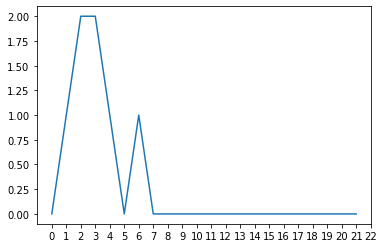

In [ ]:
plt.plot(diffs1)
plt.xticks(range(len(labelss)));

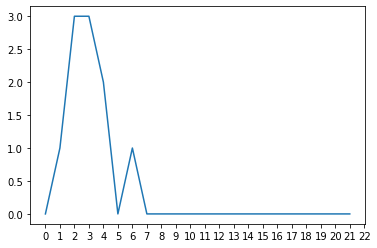

In [ ]:
plt.plot(diffs2)
plt.xticks(range(len(labelss)));

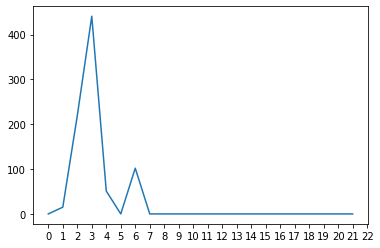

In [ ]:
plt.plot(diffs3)
plt.xticks(range(len(labelss)));

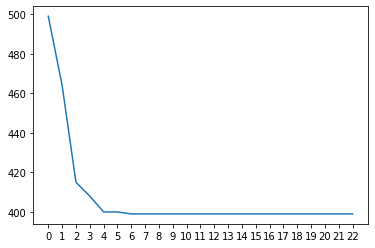

In [ ]:
plt.plot(n_clusters)
plt.xticks(range(len(labelss)));

In [ ]:
def get_max_cluster(z):
    np.uni

In [ ]:
max_cluster = []

#### Датасет house-committees

In [ ]:
H, labels = get_house_committees()

In [ ]:
koeff = 0.01

def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - парамет
        ры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * koeff)
    return β, γ


def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    β = [1] * mx_hyper_size
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * koeff) # А здесь не m_k_collapsed?????
    return β, γ

def Q_for_all_ar_nothing_faster(H: Hypergraph, z, Ω, d, graph_volume, k, label_volumes, m_ks):
    '''
        k - максимальный размер гиперребра
        d - степени вершин
        label_volumes - объемы лейблов, соответствующие текущей кластеризации
    '''
    unique_labels = list(np.unique(z))

    β = 1
    ans = 0.0
    # k = 0 # k - vаксимальный размер гиперребра гиперграфа H
    # for edge in H.hyperedges:
    #    k = max(k, edge.vertexes.shape[0])

    # print('k = ', k)
    # graph_volume = vol_of_graph(H)

    # d[vertex] - cуммарный вес ребер, накрывающий вершину vertex
    # label_volumes = get_all_volumes(H, z, d)
    cut_ks = get_all_cut_ks(H, z, k, m_ks) # !!! Это очень долго!!!
    # print('Start')

    for i in range(1, k + 1):
        # print('i = ', i)
        γ = m_ks[i] / (graph_volume ** i) * koeff
        sum_vol = 0
        for label in unique_labels: # квадратичная скорость
            sum_vol += γ * (label_volumes[label] ** i)
        ans -= β * (cut_ks[i] + sum_vol)
    return ans

In [ ]:
%%time
z = get_hard_clusterisation(H)

edge_sizes:  [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 18 19 21 23 24 25 26 29 31
 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55
 56 57 58 60 61 62 63 64 65 66 67 68 70 71 73 76 77 78 79 80 81]
Start louvain step:

β.size =  82
preproc start
preproc end


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/1290 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: overflow encountered in long_scalars


Δ =  0.9999999724197808


  0%|          | 0/1290 [00:00<?, ?it/s]

z_new =  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220

  0%|          | 0/1289 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
z = get_medium_clusterisation(H)

In [ ]:
np.unique(z).shape[0]

1289

In [ ]:
H_col, edge_sizes, expanded_vertexes = Collapse_h(H, list(range(1, n_nodes + 1)))

In [ ]:
np.unique(list(edge_sizes.values()))

array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 18, 19,
       21, 23, 24, 25, 26, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
       42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
       60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 73, 76, 77, 78, 79, 80,
       81])

In [ ]:
ed_sz = []
for he in H_col.hyperedges:
    ed_sz.append(len(he))
np.unique(ed_sz)

array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 18, 19,
       21, 23, 24, 25, 26, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
       42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
       60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 73, 76, 77, 78, 79, 80,
       81])

In [ ]:
ed_sz = []
ed_sz_1 = []

for he in H.hyperedges:
    ed_sz.append(len(he))
    ed_sz_1.append(np.unique(he.vertexes).shape[0])
np.unique(ed_sz)

array([ 1,  2,  3,  4,  5,  6,  8,  9, 10, 11, 12, 13, 14, 15, 16, 19, 21,
       23, 24, 25, 26, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42,
       43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 60,
       61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 73, 76, 77, 79, 80, 82])

In [ ]:
np.unique(ed_sz_1)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 18,
       19, 21, 23, 24, 25, 26, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40,
       41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57,
       58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 73, 76, 77, 78, 79,
       80, 81])

In [ ]:
get_β_γ_collapsed

In [ ]:
labelss, sz = get_step_by_step_clusterisation(H)

#### граф senate-commities

In [ ]:
H_com, labels = get_senate_committees()

In [ ]:
koeff = 1

def get_β_γ(H: Hypergraph):
    '''
    H - НЕсжатый гиперграф

    return:
        β, γ - парамет
        ры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    for e in H.hyperedges:
        if len(e) > mx_hyper_size:
            mx_hyper_size = len(e)
    
    m_ks = get_all_m_k(H, mx_hyper_size)

    γ = [0]
    # β = [1] * mx_hyper_size
    β = [np.log(k) / k for k in range(1, mx_hyper_size + 1)]
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * koeff)
    return β, γ


def get_β_γ_collapsed(H: Hypergraph, edge_sizes):
    '''
    H - Cжатый гиперграф

    return:
        β, γ - параметры, нужные для ΔQ_AON
        [0 ... max_edge_size]
        в 0 элементе - мусор!!!
    '''
    n = H.number_of_vertexes
    
    H_vol = vol_of_graph(H)
    mx_hyper_size = 0
    mx_hyper_size = max(edge_sizes.values())

    m_ks = get_all_m_k(H, mx_hyper_size) # А здесь на m_k_collapsed??? 
                                         # Чтобы учитывать edge_sizes?
    # m_ks = get_all_m_k_collapsed(H, mx_hyper_size, edge_sizes)

    γ = [0]
    # β = [1] * mx_hyper_size
    β = [np.log(k) / k for k in range(1, mx_hyper_size + 1)]
    β = [0] + β
    for k in range(1, mx_hyper_size + 1):
        γ.append(m_ks[k] / (H_vol ** k) * koeff) # А здесь не m_k_collapsed?????
    return β, γ

def Q_for_all_ar_nothing_faster(H: Hypergraph, z, Ω, d, graph_volume, k, label_volumes, m_ks):
    '''
        k - максимальный размер гиперребра
        d - степени вершин
        label_volumes - объемы лейблов, соответствующие текущей кластеризации
    '''
    unique_labels = list(np.unique(z))

    β = 1
    ans = 0.0
    # k = 0 # k - vаксимальный размер гиперребра гиперграфа H
    # for edge in H.hyperedges:
    #    k = max(k, edge.vertexes.shape[0])

    # print('k = ', k)
    # graph_volume = vol_of_graph(H)

    # d[vertex] - cуммарный вес ребер, накрывающий вершину vertex
    # label_volumes = get_all_volumes(H, z, d)
    cut_ks = get_all_cut_ks(H, z, k, m_ks) # !!! Это очень долго!!!
    # print('Start')

    for i in range(1, k + 1):
        # print('i = ', i)
        γ = m_ks[i] / (graph_volume ** i) * koeff
        sum_vol = 0
        for label in unique_labels: # квадратичная скорость
            sum_vol += γ * (label_volumes[label] ** i)
        ans -= β * (cut_ks[i] + sum_vol)
    return ans

In [ ]:
%%time
z = get_hard_clusterisation(H_com)

edge_sizes:  [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 31]
Start louvain step:

β.size =  32
preproc start
preproc end


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/1290 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: overflow encountered in long_scalars


z_new =  [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220

In [ ]:
np.unique(z).shape

(1290,)

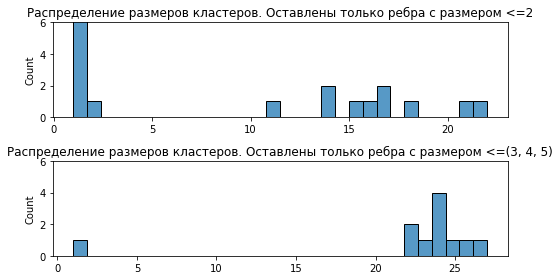

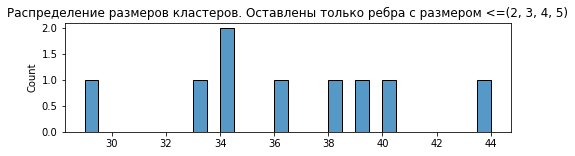

#### Для проекций

##### Код взвешенного проектирования гиперграфа

##### То же для графа лекарств

In [ ]:
def build_hypergraph(path_to_nvert, path_to_edges, n_nodes):
    file_ed_sz = open(path_to_nvert, 'r', encoding='utf-8')
    file_edges = open(path_to_edges, 'r', encoding='utf-8')

    edge_sizes = []
    while True:
        line = file_ed_sz.readline()
        if not line:
            break
        edge_sizes.append(int(line))
    H = Hypergraph(n_nodes)
    for ed_sz in edge_sizes:
        he = []
        for i in range(ed_sz):
            line = file_edges.readline()
            he.append(int(line) - 1)
        H.add_hyperedge(he)
    return H

In [ ]:
path_edge_sizes = '/gdrive/MyDrive/community_detection/datasets/NDC-classes/NDC-classes-nverts.txt'
path_edges = '/gdrive/MyDrive/community_detection/datasets/NDC-classes/NDC-classes-simplices.txt'
H_drug = build_hypergraph(path_edge_sizes, path_edges, 1161)

In [ ]:
sz_drug = np.unique([len(e) for e in H_drug.hyperedges])

In [ ]:
projection_labelss_drug = []

for k in tqdm_notebook(sz_drug):
    if k == 1:
        continue
    G = get_projection_graph(H_drug, k)
    adj_matrix = get_weighted_adjacency(G)
    z = get_louvain_labels(adj_matrix)
    projection_labelss_drug.append(z)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/24 [00:00<?, ?it/s]

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 10))
n_plots = len(sz_drug) - 1

cluster_distr = get_cluster_sz_distribution(projection_labelss_drug)

i=2
plt.subplot(n_plots, 1, 1)
plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_drug[i]))
sns.histplot(cluster_distr[i], bins=30)

i=5
plt.subplot(n_plots, 1, 2)
plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_drug[i]))
sns.histplot(cluster_distr[i], bins=30)


i=5
plt.subplot(n_plots, 1, 1)
plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_drug[i]))
sns.histplot(cluster_distr[i], bins=30)


plt.tight_layout()

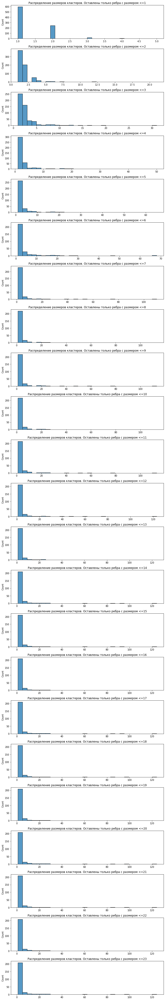

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 60))
n_plots = len(sz_drug) - 1

cluster_distr = get_cluster_sz_distribution(projection_labelss_drug)

for i in range(n_plots):
    plt.subplot(n_plots, 1, i + 1)
    plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_drug[i]))
    sns.histplot(cluster_distr[i], bins=30)
    #plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

In [ ]:
G = get_projection_graph(H_drug, 100)
conn_comp = sorted(list(nx.connected_components(G)), key=lambda x: -len(x))
comp_sz = [len(x) for x in conn_comp]
print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))

top-10 components:  [628, 60, 26, 18, 8, 8, 7, 7, 7, 6] 
number components:  183


In [ ]:
H_drug = H_drug.pruning(list(conn_comp[0]))

In [ ]:
sz_drug = np.unique([len(e) for e in H_drug.hyperedges])

In [ ]:
projection_labelss_drug = []

for k in tqdm_notebook(sz_drug):
    if k == 1:
        continue
    G = get_projection_graph(H_drug, k)
    adj_matrix = get_weighted_adjacency(G)
    z = get_louvain_labels(adj_matrix)
    projection_labelss_drug.append(z)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/24 [00:00<?, ?it/s]

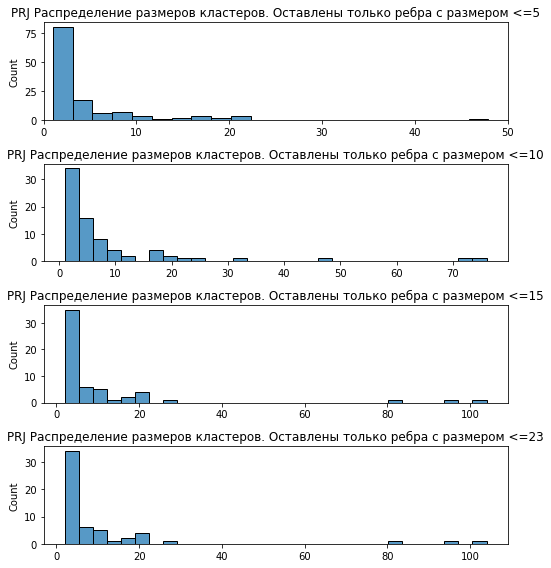

In [ ]:
import seaborn as sns

plt.figure(figsize=(8, 8))
n_plots = 4

cluster_distr = get_cluster_sz_distribution(projection_labelss_drug)

i=4
plt.subplot(n_plots, 1, 1)
plt.title('PRJ Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_drug[i]))
plt.xlim(0, 50)
sns.histplot(cluster_distr[i], bins=30)

i=9
plt.subplot(n_plots, 1, 2)
plt.title('PRJ Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_drug[i]))
sns.histplot(cluster_distr[i], bins=30)


i=14
plt.subplot(n_plots, 1, 3)
plt.title('PRJ Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_drug[i]))
sns.histplot(cluster_distr[i], bins=30)

i=22
plt.subplot(n_plots, 1, 4)
plt.title('PRJ Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_drug[i]))
sns.histplot(cluster_distr[i], bins=30)


plt.tight_layout()

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 60))
n_plots = len(sz_drug) - 1

cluster_distr = get_cluster_sz_distribution(projection_labelss_drug)

for i in range(n_plots):
    plt.subplot(n_plots, 1, i + 1)
    plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_drug[i + 1]))
    sns.histplot(cluster_distr[i], bins=30)
    #plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

In [ ]:
diffs1 = [difference1(projection_labelss_drug[i - 1], projection_labelss_drug[i]) for i in range(1, len(projection_labelss_drug))]
diffs2 = [difference2(projection_labelss_drug[i - 1], projection_labelss_drug[i]) for i in range(1, len(projection_labelss_drug))]
diffs3 = [difference3(projection_labelss_drug[i - 1], projection_labelss_drug[i]) for i in range(1, len(projection_labelss_drug))]

In [ ]:
n_clusters = [np.unique(z_).shape[0] for z_ in projection_labelss_drug]

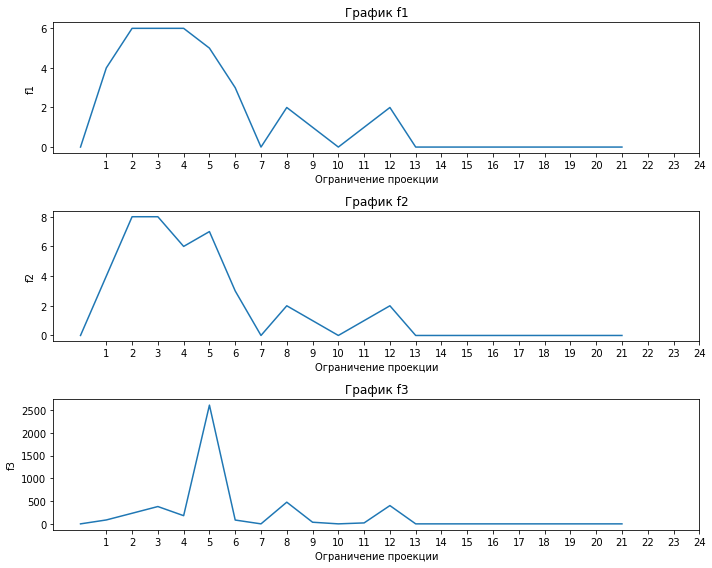

In [ ]:
plt.figure(figsize=(10, 8))

plt.subplot(3, 1, 1)
plt.plot(diffs1)
plt.title('График f1')
plt.xlabel('Ограничение проекции')
plt.ylabel('f1')
plt.xticks(sz_drug)

plt.subplot(3, 1, 2)
plt.plot(diffs2)
plt.title('График f2')
plt.xlabel('Ограничение проекции')
plt.ylabel('f2')
plt.xticks(sz_drug);

plt.subplot(3, 1, 3)
plt.plot(diffs3)
plt.title('График f3')
plt.xlabel('Ограничение проекции')
plt.ylabel('f3')
plt.xticks(sz_drug);

plt.tight_layout()

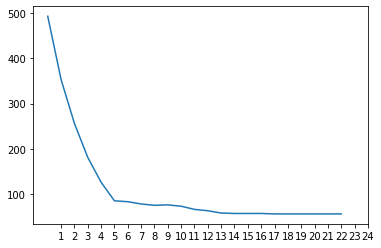

In [ ]:
plt.plot(n_clusters)
plt.xticks(sz_drug);

##### Для house commitees

In [ ]:
def build_hypergraph_committes(path_to_edges, path_true_clusterisation, n_nodes):
    file_edges = open(path_to_edges, 'r', encoding='utf-8')
    file_clust = open(path_true_clusterisation, 'r', encoding='utf-8')
    H = Hypergraph(n_nodes)

    while True:
        line = file_edges.readline()
        if not line:
            break
        line = [int(x) - 1 for x in line.split(',')]
        H.add_hyperedge(line)
    
    true_clusters = []
    while True:
        line = file_clust.readline()
        if not line:
            break
        line = int(line)
        true_clusters.append(line)
    return H, true_clusters

In [ ]:
path_edges = '/gdrive/MyDrive/community_detection/datasets/house-committees/hyperedges-house-committees.txt'
path_true_clusterisation = '/gdrive/MyDrive/community_detection/datasets/house-committees/node-labels-house-committees.txt'
n_nodes = 1290

H_com, labels_com = build_hypergraph_committes(path_edges, path_true_clusterisation, n_nodes)

In [ ]:
sz_com = np.unique([len(e) for e in H_com.hyperedges])

In [ ]:
projection_labelss_com = []

for k in tqdm_notebook(sz_com):
    if k == 1:
        continue
    G = get_projection_graph(H_com, k)
    adj_matrix = get_weighted_adjacency(G)
    z = get_louvain_labels(adj_matrix)
    projection_labelss_com.append(z)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/70 [00:00<?, ?it/s]

In [ ]:
diffs1 = [difference1(projection_labelss_com[i - 1], projection_labelss_com[i]) for i in range(1, len(projection_labelss_com))]
diffs2 = [difference2(projection_labelss_com[i - 1], projection_labelss_com[i]) for i in range(1, len(projection_labelss_com))]
diffs3 = [difference3(projection_labelss_com[i - 1], projection_labelss_com[i]) for i in range(1, len(projection_labelss_com))]

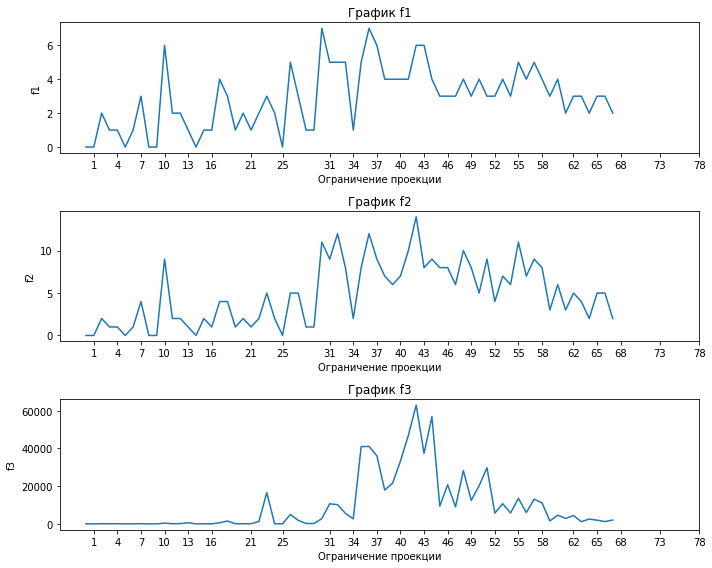

In [ ]:
plt.figure(figsize=(10, 8))

plt.subplot(3, 1, 1)
plt.plot(diffs1)
plt.title('График f1')
plt.xlabel('Ограничение проекции')
plt.ylabel('f1')
plt.xticks(sz_com[0:-1:3])

plt.subplot(3, 1, 2)
plt.plot(diffs2)
plt.title('График f2')
plt.xlabel('Ограничение проекции')
plt.ylabel('f2')
plt.xticks(sz_com[0:-1:3]);

plt.subplot(3, 1, 3)
plt.plot(diffs3)
plt.title('График f3')
plt.xlabel('Ограничение проекции')
plt.ylabel('f3')
plt.xticks(sz_com[0:-1:3]);

plt.tight_layout()

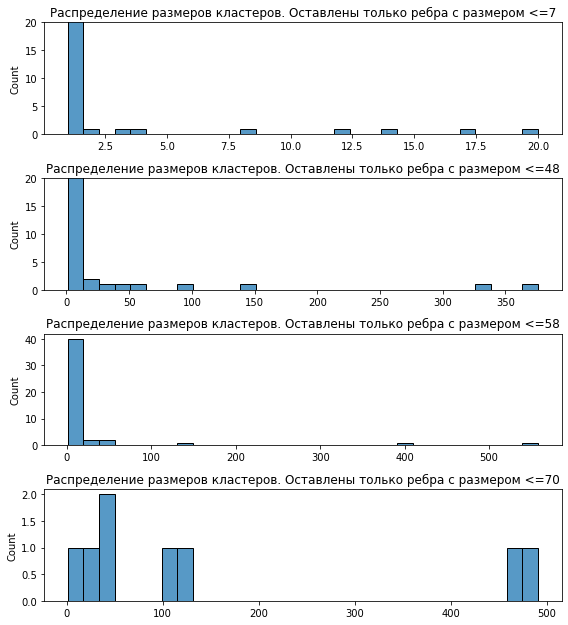

In [ ]:
import seaborn as sns

plt.figure(figsize=(8, 28))
n_plots = len(sz_com) - 1

cluster_distr = get_cluster_sz_distribution(projection_labelss_com)

i=1
plt.subplot(n_plots // 5, 1, 1)
plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i * 5 + 1]))
plt.ylim(0, 20)
sns.histplot(cluster_distr[i * 5], bins=30)
#plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

i=8
plt.subplot(n_plots // 5, 1, 2)
plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i * 5 + 1]))
plt.ylim(0, 20)
sns.histplot(cluster_distr[i * 5], bins=30)
#plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

i=10
plt.subplot(n_plots // 5, 1, 3)
plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i * 5 + 1]))
sns.histplot(cluster_distr[i * 5], bins=30)
#plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

i=12
plt.subplot(n_plots // 5, 1, 4)
plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i * 5 + 1]))
sns.histplot(cluster_distr[i * 5], bins=30)
#plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

In [ ]:
import seaborn as sns

plt.figure(figsize=(8, 28))
n_plots = len(sz_com) - 1

cluster_distr = get_cluster_sz_distribution(projection_labelss_com)

for i in range(n_plots // 5):
    plt.subplot(n_plots // 5, 1, i + 1)
    plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i * 5 + 1]))
    sns.histplot(cluster_distr[i * 5], bins=30)
    #plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

In [ ]:
G = get_projection_graph(H_com, 100)
conn_comp = sorted(list(nx.connected_components(G)), key=lambda x: -len(x))
comp_sz = [len(x) for x in conn_comp]
print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))

top-10 components:  [1290] 
number components:  1


In [ ]:
sz_com = np.unique([len(e) for e in H_com.hyperedges])

In [ ]:
projection_labelss_com = []

for k in tqdm_notebook(sz_com):
    if k == 1:
        continue
    G = get_projection_graph(H_com, k)
    adj_matrix = get_weighted_adjacency(G)
    z = get_louvain_labels(adj_matrix)
    projection_labelss_com.append(z)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/70 [00:00<?, ?it/s]

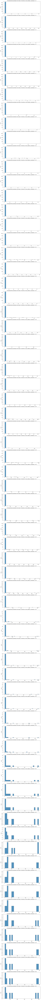

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 240))
n_plots = len(sz_com) - 1

cluster_distr = get_cluster_sz_distribution(projection_labelss_com)

for i in range(n_plots):
    plt.subplot(n_plots, 1, i + 1)
    plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i + 1]))
    sns.histplot(cluster_distr[i], bins=30)
    #plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

In [ ]:
diffs1 = [difference1(projection_labelss_com[i - 1], projection_labelss_com[i]) for i in range(1, len(projection_labelss_com))]
diffs2 = [difference2(projection_labelss_com[i - 1], projection_labelss_com[i]) for i in range(1, len(projection_labelss_com))]
diffs3 = [difference3(projection_labelss_com[i - 1], projection_labelss_com[i]) for i in range(1, len(projection_labelss_com))]

In [ ]:
n_clusters = [np.unique(z_).shape[0] for z_ in projection_labelss_com]

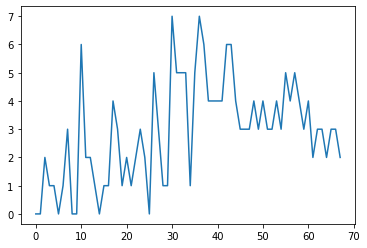

In [ ]:
plt.plot(diffs1)
#plt.xticks(range(len(projection_labelss_com))[:,2]);

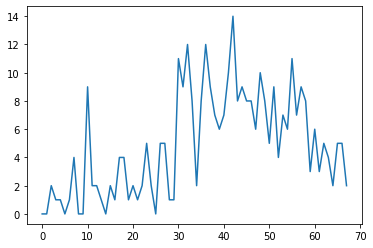

In [ ]:
plt.plot(diffs2)
#plt.xticks(range(len(projection_labelss_com)));

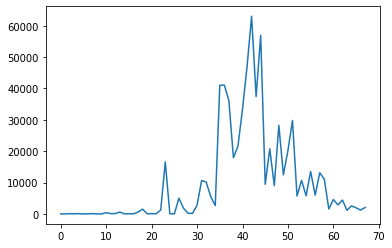

In [ ]:
plt.plot(diffs3)
#plt.xticks(range(len(projection_labelss_com)));

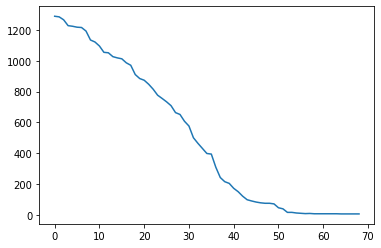

In [ ]:
plt.plot(n_clusters)
#plt.xticks(range(len(projection_labelss_com)));

In [ ]:
print(n_clusters)

[1289, 1285, 1266, 1228, 1224, 1218, 1216, 1193, 1135, 1122, 1096, 1055, 1052, 1027, 1019, 1013, 987, 971, 911, 885, 874, 848, 816, 777, 756, 734, 709, 664, 652, 608, 577, 501, 465, 432, 399, 395, 310, 243, 216, 205, 173, 151, 122, 99, 91, 84, 79, 76, 76, 72, 47, 40, 17, 17, 13, 11, 9, 10, 8, 8, 8, 8, 8, 8, 7, 7, 7, 7, 7]


##### Для senate commitees

In [ ]:
def build_hypergraph_committes(path_to_edges, path_true_clusterisation, n_nodes):
    file_edges = open(path_to_edges, 'r', encoding='utf-8')
    file_clust = open(path_true_clusterisation, 'r', encoding='utf-8')
    H = Hypergraph(n_nodes)

    while True:
        line = file_edges.readline()
        if not line:
            break
        line = [int(x) - 1 for x in line.split(',')]
        H.add_hyperedge(line)
    
    true_clusters = []
    while True:
        line = file_clust.readline()
        if not line:
            break
        line = int(line)
        true_clusters.append(line)
    return H, true_clusters

In [ ]:
path_edges = '/gdrive/MyDrive/community_detection/datasets/senate-committees/hyperedges-senate-committees.txt'
path_true_clusterisation = '/gdrive/MyDrive/community_detection/datasets/senate-committees/node-labels-senate-committees.txt'
n_nodes = 282

H_com, labels_com = build_hypergraph_committes(path_edges, path_true_clusterisation, n_nodes)

In [ ]:
sz_com = np.unique([len(e) for e in H_com.hyperedges])

In [ ]:
projection_labelss_com = []

for k in tqdm_notebook(sz_com):
    if k == 1:
        continue
    G = get_projection_graph(H_com, k)
    adj_matrix = get_weighted_adjacency(G)
    z = get_louvain_labels(adj_matrix)
    projection_labelss_com.append(z)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/28 [00:00<?, ?it/s]

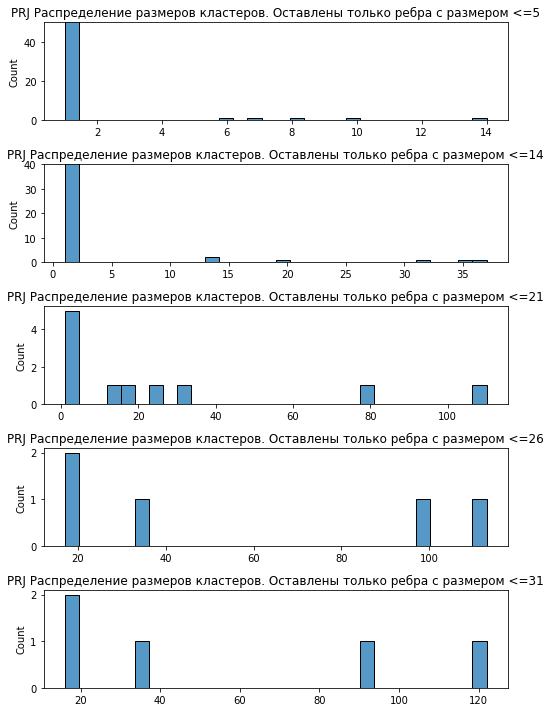

In [ ]:
import seaborn as sns

plt.figure(figsize=(8, 10))
n_plots = 5

cluster_distr = get_cluster_sz_distribution(projection_labelss_com)

i=1
plt.subplot(n_plots, 1, 1)
plt.title('PRJ Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i]))
plt.ylim(0, 50)
sns.histplot(cluster_distr[i], bins=30)

i=10
plt.subplot(n_plots, 1, 2)
plt.title('PRJ Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i]))
plt.ylim(0, 40)
sns.histplot(cluster_distr[i], bins=30)


i=17
plt.subplot(n_plots, 1, 3)
plt.title('PRJ Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i]))
sns.histplot(cluster_distr[i], bins=30)

i=22
plt.subplot(n_plots, 1, 4)
plt.title('PRJ Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i]))
sns.histplot(cluster_distr[i], bins=30)

i=27
plt.subplot(n_plots, 1, 5)
plt.title('PRJ Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i]))
sns.histplot(cluster_distr[i], bins=30)
plt.tight_layout()

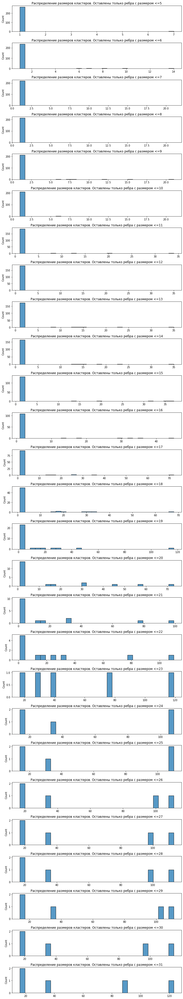

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 54))
n_plots = len(sz_com) - 1

cluster_distr = get_cluster_sz_distribution(projection_labelss_com)

for i in range(n_plots):
    plt.subplot(n_plots, 1, i + 1)
    plt.title('Распределение размеров кластеров. Оставлены только ребра с размером <=' + str(sz_com[i + 1]))
    sns.histplot(cluster_distr[i], bins=30)
    #plt.xticks(np.arange(0, 30, 1))
plt.tight_layout()

In [ ]:
G = get_projection_graph(H_com, 100)
conn_comp = sorted(list(nx.connected_components(G)), key=lambda x: -len(x))
comp_sz = [len(x) for x in conn_comp]
print('top-10 components: ', comp_sz[:10], '\nnumber components: ', len(comp_sz))

top-10 components:  [282] 
number components:  1


In [ ]:
diffs1 = [difference1(projection_labelss_com[i - 1], projection_labelss_com[i]) for i in range(1, len(projection_labelss_com))]
diffs2 = [difference2(projection_labelss_com[i - 1], projection_labelss_com[i]) for i in range(1, len(projection_labelss_com))]
diffs3 = [difference3(projection_labelss_com[i - 1], projection_labelss_com[i]) for i in range(1, len(projection_labelss_com))]

In [ ]:
n_clusters = [np.unique(z_).shape[0] for z_ in projection_labelss_com]

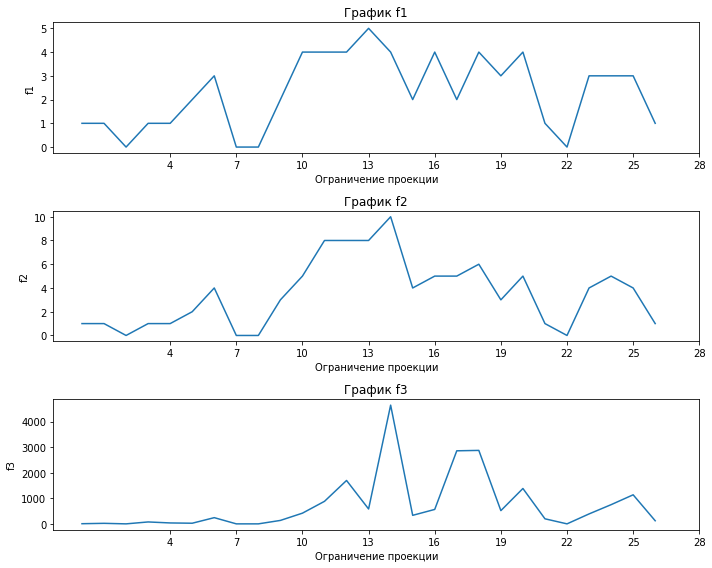

In [ ]:
plt.figure(figsize=(10, 8))

plt.subplot(3, 1, 1)
plt.plot(diffs1)
plt.title('График f1')
plt.xlabel('Ограничение проекции')
plt.ylabel('f1')
plt.xticks(sz_com[0:-1:3])

plt.subplot(3, 1, 2)
plt.plot(diffs2)
plt.title('График f2')
plt.xlabel('Ограничение проекции')
plt.ylabel('f2')
plt.xticks(sz_com[0:-1:3]);

plt.subplot(3, 1, 3)
plt.plot(diffs3)
plt.title('График f3')
plt.xlabel('Ограничение проекции')
plt.ylabel('f3')
plt.xticks(sz_com[0:-1:3]);

plt.tight_layout()

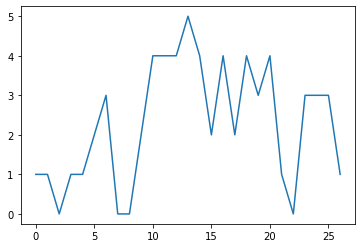

In [ ]:
plt.plot(diffs1)
#plt.xticks(range(len(projection_labelss_com))[:,2]);

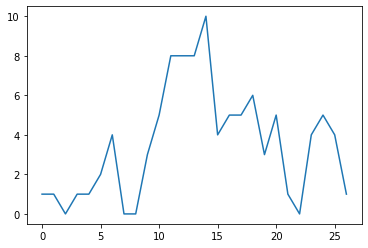

In [ ]:
plt.plot(diffs2)
#plt.xticks(range(len(projection_labelss_com)));

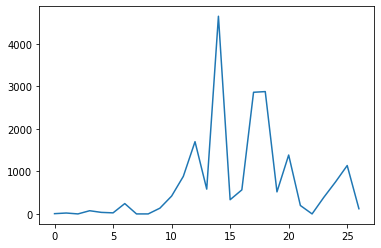

In [ ]:
plt.plot(diffs3)
#plt.xticks(range(len(projection_labelss_com)));

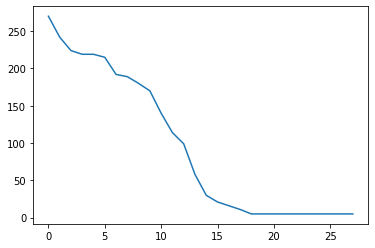

In [ ]:
plt.plot(n_clusters)
#plt.xticks(range(len(projection_labelss_com)));

In [ ]:
print(n_clusters)

[270, 242, 224, 219, 219, 215, 192, 189, 180, 170, 140, 114, 99, 58, 30, 21, 16, 11, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]


In [ ]:
difference3(projection_labelss_com[-1], labels_com)

6245